#Medical Insurance Cost Prediction
##Traditional Regression Vs Quantile Regression

Here, We will explore a dataset consists of patients data for medical cost. The cost of medical treatment depends on many factors: number of diseases, diseases, bmi, , diagbosis, number of childeren, city of residence, age and so on. We have data which can help us to find patterns or draw conclusion about health of patients and their medical costs. But we dont have personal data like diseases and diagnosis.
Let's jump into data and explore it.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso, LinearRegression, Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures, StandardScaler
from sklearn.feature_selection import RFECV, SelectKBest, chi2
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier, plot_tree
from scipy.stats import f_oneway, norm
import xgboost as xgb


Importing Data

In [ ]:
# Load the dataset
file_path = 'https://raw.githubusercontent.com/shubhamvm/Kaggle/main/Final%20Project/Datasets/insurance.csv'
data = pd.read_csv(file_path)
data.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [ ]:
# Check for missing values
missing_values = data.isnull().sum()
print("Missing Values in Each Column:")
print(missing_values)

Missing Values in Each Column:
age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64


In [ ]:
# Check data types
data_types = data.dtypes
print("\nData Types of Each Column:")
print(data_types)


Data Types of Each Column:
age           int64
sex          object
bmi         float64
children      int64
smoker       object
region       object
charges     float64
dtype: object


In [ ]:
# Summary statistics for all columns
summary_stats = data.describe(include='all')
print("\nSummary Statistics:")
print(summary_stats)


Summary Statistics:
                age   sex          bmi     children smoker     region  \
count   1338.000000  1338  1338.000000  1338.000000   1338       1338   
unique          NaN     2          NaN          NaN      2          4   
top             NaN  male          NaN          NaN     no  southeast   
freq            NaN   676          NaN          NaN   1064        364   
mean      39.207025   NaN    30.663397     1.094918    NaN        NaN   
std       14.049960   NaN     6.098187     1.205493    NaN        NaN   
min       18.000000   NaN    15.960000     0.000000    NaN        NaN   
25%       27.000000   NaN    26.296250     0.000000    NaN        NaN   
50%       39.000000   NaN    30.400000     1.000000    NaN        NaN   
75%       51.000000   NaN    34.693750     2.000000    NaN        NaN   
max       64.000000   NaN    53.130000     5.000000    NaN        NaN   

             charges  
count    1338.000000  
unique           NaN  
top              NaN  
freq      

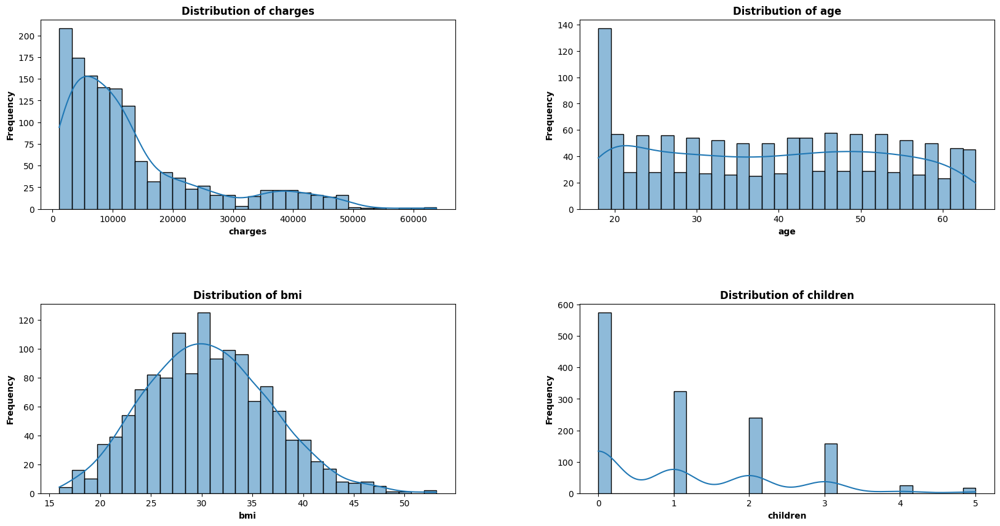

In [ ]:
# Define the numerical features
numerical_cols = ['charges', 'age', 'bmi', 'children']

# Set up the figure and axes
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
axes = axes.flatten()

# Plot the distributions
for i, col in enumerate(numerical_cols):
    sns.histplot(data=data, x=col, bins=30, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}', fontweight='bold')
    axes[i].set_xlabel(col, fontweight='semibold')
    axes[i].set_ylabel('Frequency', fontweight='semibold')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Display the plot
plt.show()

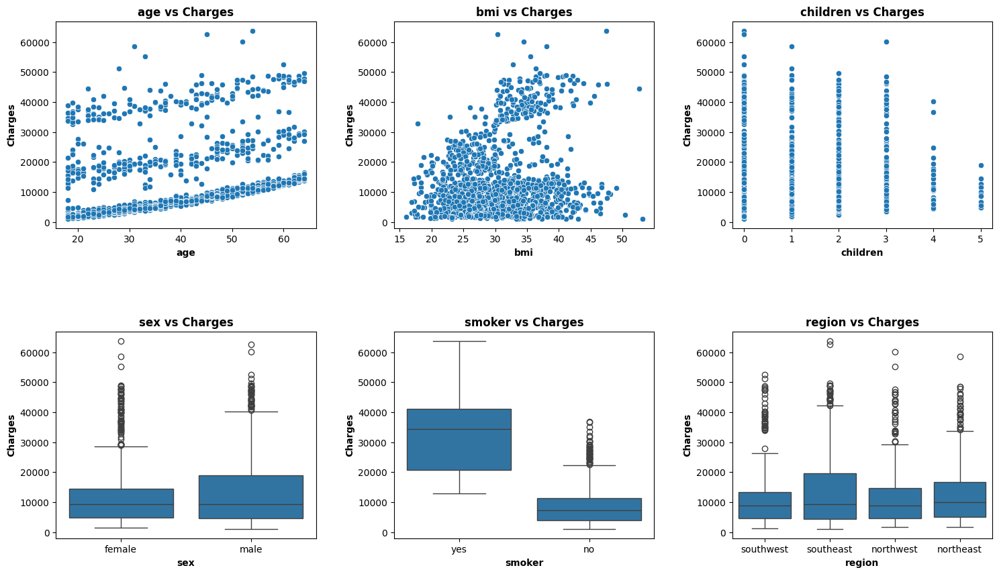

In [ ]:
# Define the numerical and categorical features
numerical_cols = ['age', 'bmi', 'children']
categorical_cols = ['sex', 'smoker', 'region']

# Set up the figure and axes
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

# Scatter plots for numerical variables vs. charges
for i, col in enumerate(numerical_cols):
    if col != 'charges':
        sns.scatterplot(x=data[col], y=data['charges'], ax=axes[i])
        axes[i].set_title(f'{col} vs Charges', fontweight='bold')
        axes[i].set_xlabel(col, fontweight='semibold')
        axes[i].set_ylabel('Charges', fontweight='semibold')

# Box plots for categorical variables vs. charges
for i, col in enumerate(categorical_cols, start=len(numerical_cols)):
    sns.boxplot(x=data[col], y=data['charges'], ax=axes[i])
    axes[i].set_title(f'{col} vs Charges', fontweight='bold')
    axes[i].set_xlabel(col, fontweight='semibold')
    axes[i].set_ylabel('Charges', fontweight='semibold')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Display the plot
plt.show()


In [ ]:
# Convert categorical variables to numerical codes
data_numeric = data.copy()
data_numeric['sex'] = data_numeric['sex'].astype('category').cat.codes
data_numeric['smoker'] = data_numeric['smoker'].astype('category').cat.codes
data_numeric['region'] = data_numeric['region'].astype('category').cat.codes

# Display the first few rows of the resulting dataframe
data_numeric.head()

,age,sex,bmi,children,smoker,region,charges
0,19,0,27.900,0,1,3,16884.92400
1,18,1,33.770,1,0,2,1725.55230
2,28,1,33.000,3,0,2,4449.46200
3,33,1,22.705,0,0,1,21984.47061
4,32,1,28.880,0,0,1,3866.85520


region: northwest = 1, southeast = 2, southwest = 3, northeast = 4

sex: female = 0, male = 1

smoker: smoker = 1, non-smoker = 0

               age       sex       bmi  children    smoker    region   charges
age       1.000000 -0.020856  0.109272  0.042469 -0.025019  0.002127  0.299008
sex      -0.020856  1.000000  0.046371  0.017163  0.076185  0.004588  0.057292
bmi       0.109272  0.046371  1.000000  0.012759  0.003750  0.157566  0.198341
children  0.042469  0.017163  0.012759  1.000000  0.007673  0.016569  0.067998
smoker   -0.025019  0.076185  0.003750  0.007673  1.000000 -0.002181  0.787251
region    0.002127  0.004588  0.157566  0.016569 -0.002181  1.000000 -0.006208
charges   0.299008  0.057292  0.198341  0.067998  0.787251 -0.006208  1.000000


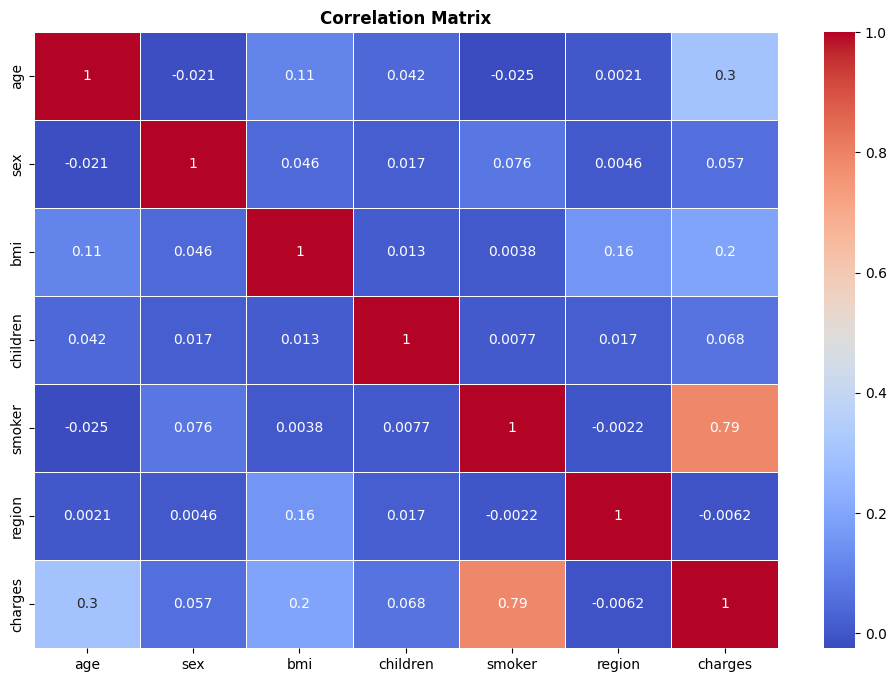

In [ ]:
# Compute the correlation matrix
correlation_matrix = data_numeric.corr()

# Display the correlation matrix
print(correlation_matrix)

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix', fontweight='bold')
plt.show()

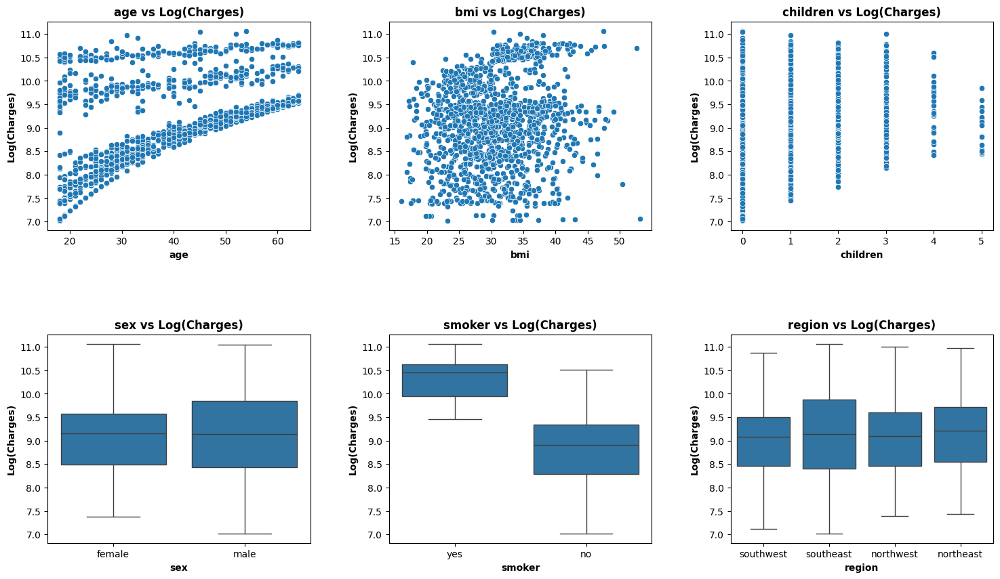

In [ ]:
# Define the numerical and categorical features
numerical_cols = ['age', 'bmi', 'children']
categorical_cols = ['sex', 'smoker', 'region']

data_log = data.copy()
# Take log of 'charges' column
data_log['log_charges'] = np.log(data['charges'])

# Set up the figure and axes
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

# Scatter plots for numerical variables vs. charges
for i, col in enumerate(numerical_cols):
    if col != 'charges':
        sns.scatterplot(x=data_log[col], y=data_log['log_charges'], ax=axes[i])
        axes[i].set_title(f'{col} vs Log(Charges)', fontweight='bold')
        axes[i].set_xlabel(col, fontweight='semibold')
        axes[i].set_ylabel('Log(Charges)', fontweight='semibold')

# Box plots for categorical variables vs. charges
for i, col in enumerate(categorical_cols, start=len(numerical_cols)):
    sns.boxplot(x=data_log[col], y=data_log['log_charges'], ax=axes[i])
    axes[i].set_title(f'{col} vs Log(Charges)', fontweight='bold')
    axes[i].set_xlabel(col, fontweight='semibold')
    axes[i].set_ylabel('Log(Charges)', fontweight='semibold')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Display the plot
plt.show()


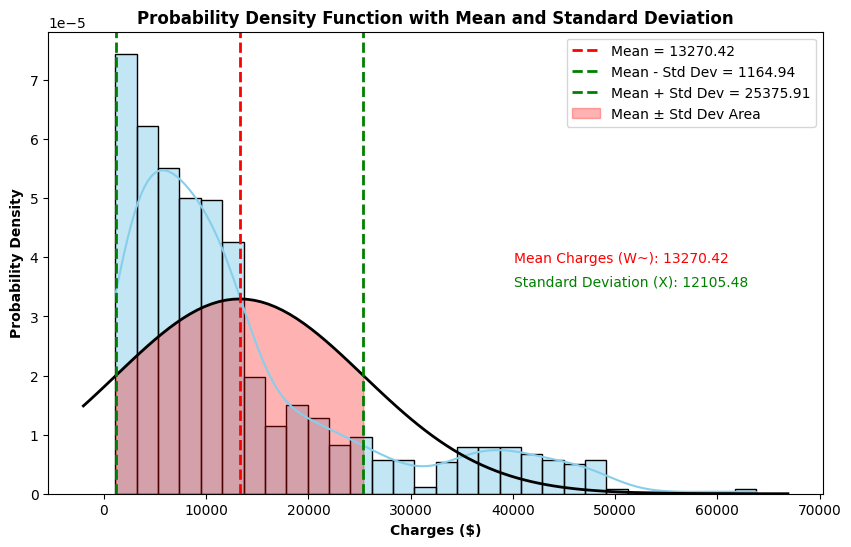

In [ ]:
# Define the numerical feature
numerical_col = 'charges'

# Plot the histogram and kernel density estimate
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x=numerical_col, kde=True, stat="density", bins=30, color="skyblue")

# Create a range of values for the x-axis
xmin, xmax = plt.xlim()
ymin, ymax = plt.ylim()
x = np.linspace(xmin, xmax, 100)

# Fit the data to a normal distribution
mean_value, std_dev = norm.fit(data[numerical_col])

# Plot the PDF using the normal distribution
pdf = norm.pdf(x, mean_value, std_dev)
plt.plot(x, pdf, 'k', linewidth=2)

# Plot mean and standard deviation lines
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean = {mean_value:.2f}')
plt.axvline(mean_value - std_dev, color='green', linestyle='dashed', linewidth=2, label=f'Mean - Std Dev = {(mean_value - std_dev):.2f}')
plt.axvline(mean_value + std_dev, color='green', linestyle='dashed', linewidth=2, label=f'Mean + Std Dev = {(mean_value + std_dev):.2f}')

# Fill the area between mean - std_dev and mean + std_dev with color
x_fill = np.linspace(mean_value - std_dev, mean_value + std_dev, 100)
y_fill = np.exp(-(x_fill - mean_value)**2 / (2 * std_dev**2)) / (std_dev * np.sqrt(2 * np.pi))
plt.fill_between(x_fill, y_fill, color='red', alpha=0.3, label='Mean ± Std Dev Area')

# Add text annotations
plt.text(xmax * 0.6, ymax * 0.5, f'Mean Charges (W~): {mean_value:.2f}', fontsize=10, color='red')
plt.text(xmax * 0.6, ymax * 0.45, f'Standard Deviation (X): {std_dev:.2f}', fontsize=10, color='green')

# Set plot labels and title
plt.xlabel('Charges ($)', fontweight='bold')
plt.ylabel('Probability Density', fontweight='bold')
plt.title('Probability Density Function with Mean and Standard Deviation', fontweight='bold')

# Add legend
plt.legend()

# Display the plot
plt.show()

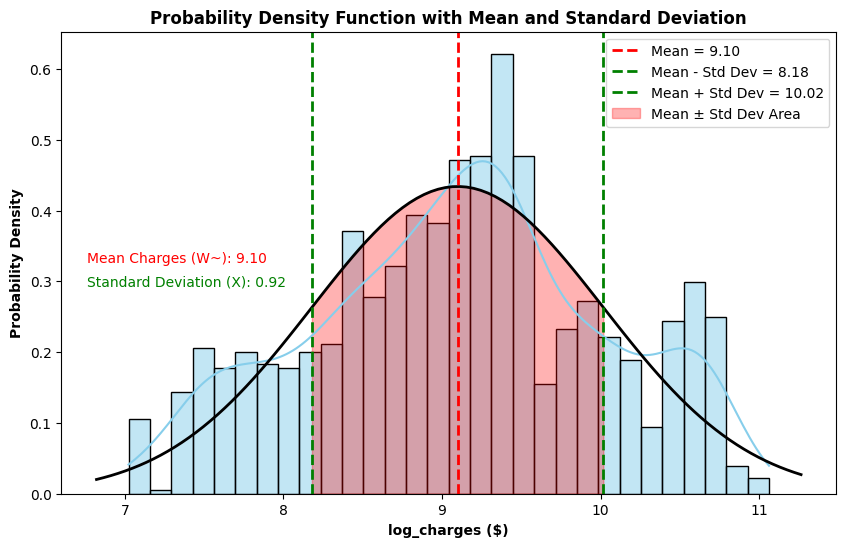

In [ ]:
# Define the numerical feature
numerical_col = 'log_charges'

# Plot the histogram and kernel density estimate
plt.figure(figsize=(10, 6))
sns.histplot(data=data_log, x=numerical_col, kde=True, stat="density", bins=30, color="skyblue")

# Create a range of values for the x-axis
xmin, xmax = plt.xlim()
ymin, ymax = plt.ylim()
x = np.linspace(xmin, xmax, 100)

# Fit the data to a normal distribution
mean_value, std_dev = norm.fit(data_log[numerical_col])

# Plot the PDF using the normal distribution
pdf = norm.pdf(x, mean_value, std_dev)
plt.plot(x, pdf, 'k', linewidth=2)

# Plot mean and standard deviation lines
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean = {mean_value:.2f}')
plt.axvline(mean_value - std_dev, color='green', linestyle='dashed', linewidth=2, label=f'Mean - Std Dev = {(mean_value - std_dev):.2f}')
plt.axvline(mean_value + std_dev, color='green', linestyle='dashed', linewidth=2, label=f'Mean + Std Dev = {(mean_value + std_dev):.2f}')

# Fill the area between mean - std_dev and mean + std_dev with color
x_fill = np.linspace(mean_value - std_dev, mean_value + std_dev, 100)
y_fill = np.exp(-(x_fill - mean_value)**2 / (2 * std_dev**2)) / (std_dev * np.sqrt(2 * np.pi))
plt.fill_between(x_fill, y_fill, color='red', alpha=0.3, label='Mean ± Std Dev Area')

# Add text annotations
plt.text(xmax * 0.6, ymax * 0.5, f'Mean Charges (W~): {mean_value:.2f}', fontsize=10, color='red')
plt.text(xmax * 0.6, ymax * 0.45, f'Standard Deviation (X): {std_dev:.2f}', fontsize=10, color='green')

# Set plot labels and title
plt.xlabel('log_charges ($)', fontweight='bold')
plt.ylabel('Probability Density', fontweight='bold')
plt.title('Probability Density Function with Mean and Standard Deviation', fontweight='bold')

# Add legend
plt.legend()

# Display the plot
plt.show()

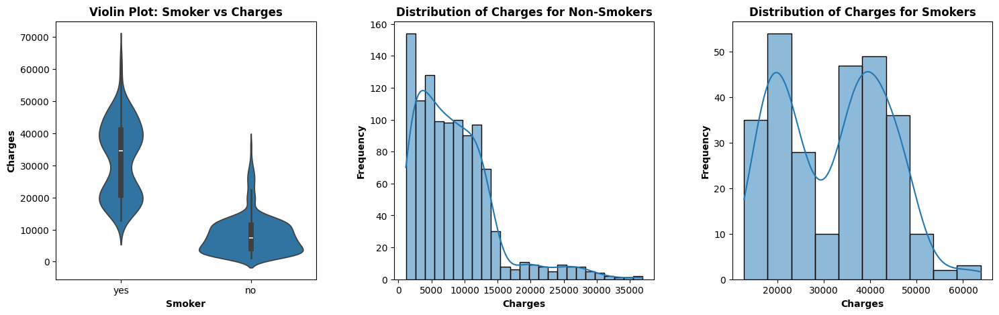

In [ ]:
# Set up the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))

# Violin plot for all smokers vs charges
sns.violinplot(x='smoker', y='charges', data=data, ax=axes[0])
axes[0].set_title('Violin Plot: Smoker vs Charges', fontweight='bold')
axes[0].set_xlabel('Smoker', fontweight='semibold')
axes[0].set_ylabel('Charges', fontweight='semibold')

# Distribution plot of charges for non-smokers
non_smokers = data[data['smoker'] == 'no']
sns.histplot(non_smokers['charges'], kde=True, ax=axes[1])
axes[1].set_title('Distribution of Charges for Non-Smokers', fontweight='bold')
axes[1].set_xlabel('Charges', fontweight='semibold')
axes[1].set_ylabel('Frequency', fontweight='semibold')

# Distribution plot of charges for smokers
smokers = data[data['smoker'] == 'yes']
sns.histplot(smokers['charges'], kde=True, ax=axes[2])
axes[2].set_title('Distribution of Charges for Smokers', fontweight='bold')
axes[2].set_xlabel('Charges', fontweight='semibold')
axes[2].set_ylabel('Frequency', fontweight='semibold')

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.3)

# Display the plot
plt.show()

Observation: Smoking patients spend more on health rather than non smokers.

Let's see if charges depends on more variables or not.

<Figure size 1000x600 with 0 Axes>

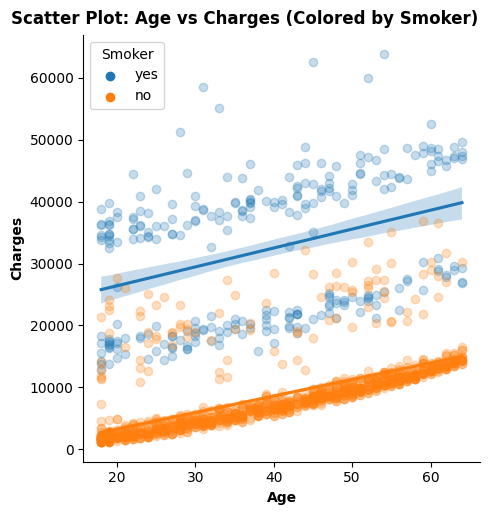

In [ ]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Scatter plot with regression lines for smokers and non-smokers
g = sns.lmplot(x='age', y='charges', hue='smoker', data=data, legend=False)

# Set plot labels and title
g.fig.suptitle('Scatter Plot: Age vs Charges (Colored by Smoker)', fontweight='bold', y=1.02)
g.set_axis_labels('Age', 'Charges', fontweight='semibold')

# Make the visibility of each dot 50%
for artist in g.ax.collections:
    artist.set_alpha(0.25)

# Add legend on the left
leg = g.ax.legend(title='Smoker', title_fontsize='medium', loc='upper left')
for lh in leg.legend_handles:
    lh.set_alpha(1)  # Make legend markers opaque

# Display the plot
plt.show()

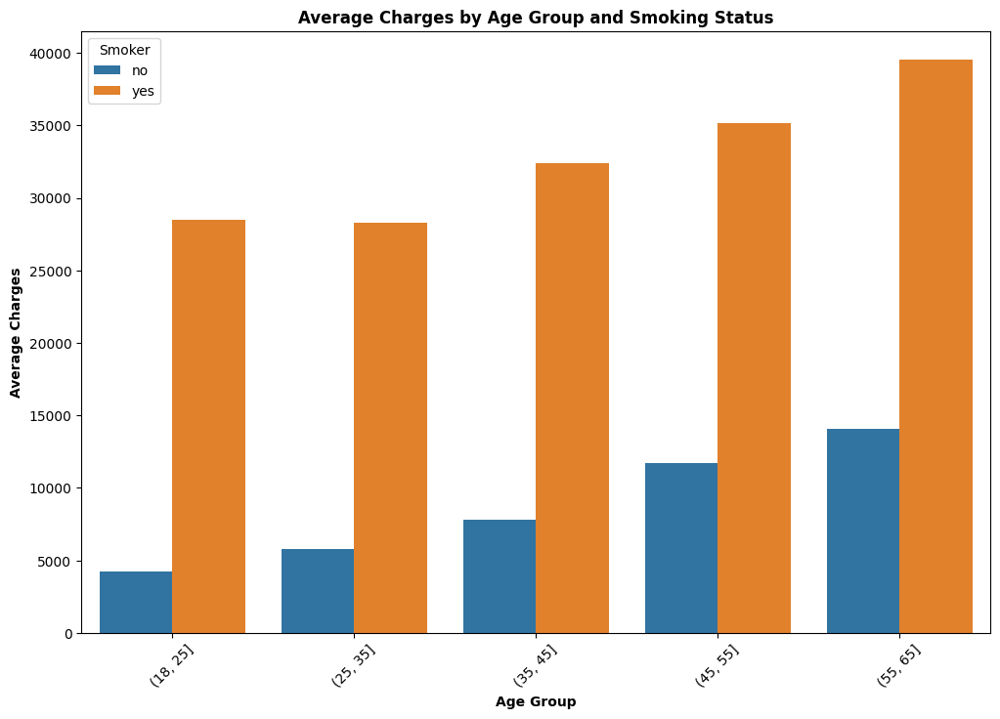

In [ ]:
# Define the age bins
age_bins = [18, 25, 35, 45, 55, 65]
data_log['age_group'] = pd.cut(data['age'], bins=age_bins)

# Group by age group and smoker status and calculate average charges
grouped_data = data_log.groupby(['age_group', 'smoker'], observed=True)['charges'].mean().reset_index()

# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(x='age_group', y='charges', hue='smoker', data=grouped_data)
plt.title('Average Charges by Age Group and Smoking Status', fontweight='bold')
plt.xlabel('Age Group', fontweight='semibold')
plt.ylabel('Average Charges', fontweight='semibold')
plt.legend(title='Smoker')
plt.xticks(rotation=45)
plt.show()


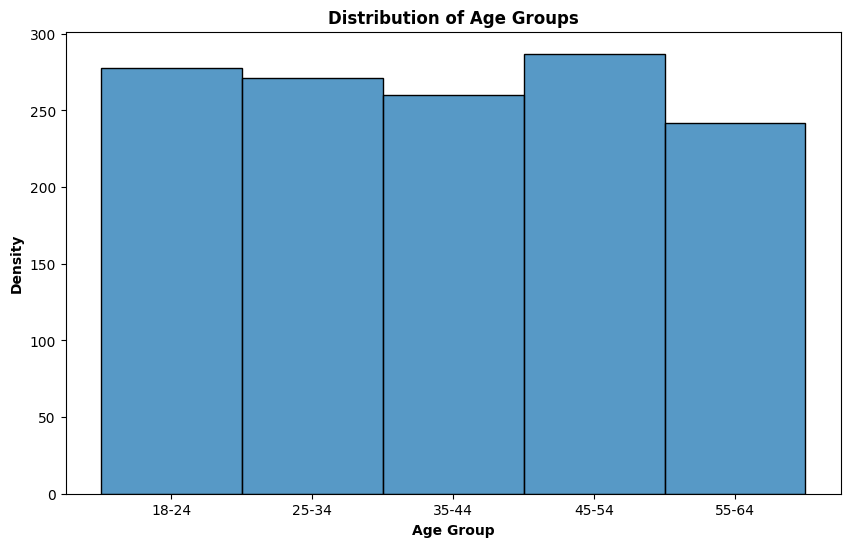

In [ ]:
# Define the age bins
age_bins = [18, 25, 35, 45, 55, 65]
age_labels = ['18-24', '25-34', '35-44', '45-54', '55-64']
data_log['age_group'] = pd.cut(data['age'], bins=age_bins, labels=age_labels, right=False)

# Create a distribution plot for the age groups
plt.figure(figsize=(10, 6))
sns.histplot(data=data_log, x='age_group', discrete=True)
plt.title('Distribution of Age Groups', fontweight='bold')
plt.xlabel('Age Group', fontweight='semibold')
plt.ylabel('Density', fontweight='semibold')
plt.show()

<Figure size 1000x600 with 0 Axes>

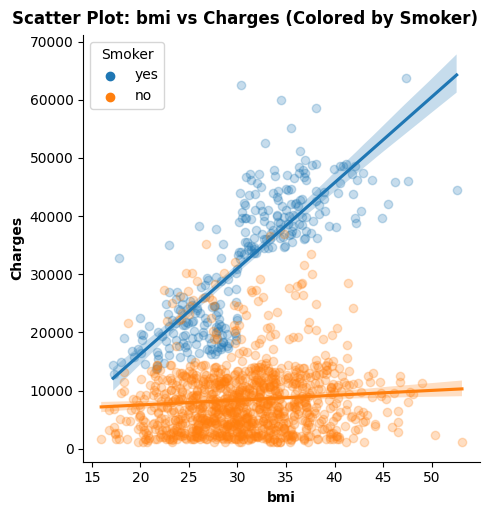

In [ ]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Scatter plot with regression lines for smokers and non-smokers
g = sns.lmplot(x='bmi', y='charges', hue='smoker', data=data_log, legend=False)

# Set plot labels and title
g.fig.suptitle('Scatter Plot: bmi vs Charges (Colored by Smoker)', fontweight='bold', y=1.02)
g.set_axis_labels('bmi', 'Charges', fontweight='semibold')

# Make the visibility of each dot 50%
for artist in g.ax.collections:
    artist.set_alpha(0.25)

# Add legend on the left
leg = g.ax.legend(title='Smoker', title_fontsize='medium', loc='upper left')
for lh in leg.legend_handles:
    lh.set_alpha(1)  # Make legend markers opaque

# Display the plot
plt.show()

<Figure size 1000x600 with 0 Axes>

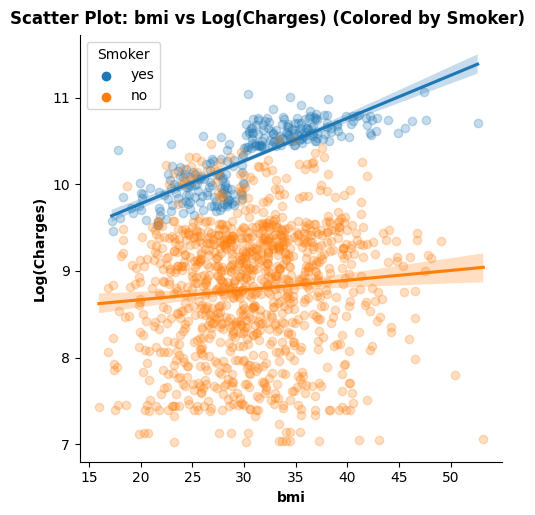

In [ ]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Scatter plot with regression lines for smokers and non-smokers
g = sns.lmplot(x='bmi', y='log_charges', hue='smoker', data=data_log, legend=False)

# Set plot labels and title
g.fig.suptitle('Scatter Plot: bmi vs Log(Charges) (Colored by Smoker)', fontweight='bold', y=1.02)
g.set_axis_labels('bmi', 'Log(Charges)', fontweight='semibold')

# Make the visibility of each dot 50%
for artist in g.ax.collections:
    artist.set_alpha(0.25)

# Add legend on the left
leg = g.ax.legend(title='Smoker', title_fontsize='medium', loc='upper left')
for lh in leg.legend_handles:
    lh.set_alpha(1)  # Make legend markers opaque

# Display the plot
plt.show()

<Figure size 1000x600 with 0 Axes>

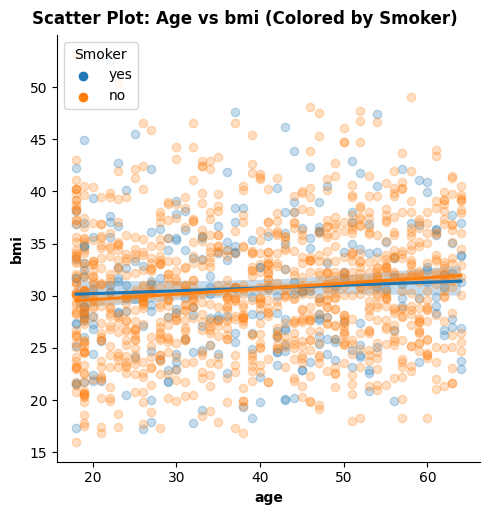

In [ ]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Scatter plot with regression lines for smokers and non-smokers
g = sns.lmplot(x='age', y='bmi', hue='smoker', data=data, legend=False)

# Set plot labels and title
g.fig.suptitle('Scatter Plot: Age vs bmi (Colored by Smoker)', fontweight='bold', y=1.02)
g.set_axis_labels('age', 'bmi', fontweight='semibold')

# Make the visibility of each dot 50%
for artist in g.ax.collections:
    artist.set_alpha(0.25)

# Add legend on the left
leg = g.ax.legend(title='Smoker', title_fontsize='medium', loc='upper left')
for lh in leg.legend_handles:
    lh.set_alpha(1)  # Make legend markers opaque

# Display the plot
plt.show()


Interesting findings, if bmi increases of non-smoker, charges doesn't go much higher but for smokers, it exponentially increases.

In [ ]:
# Convert categorical variables to numerical codes
data_num = data.copy()
data_num['sex'] = data_num['sex'].astype('category').cat.codes
data_num['smoker'] = data_num['smoker'].astype('category').cat.codes
# One-hot encode the 'region' column with 0/1 values
data_encoded = pd.get_dummies(data_num, columns=['region'], dtype='uint8')

# Display the first few rows of the resulting dataframe
data_encoded.head()

,age,sex,bmi,children,smoker,charges,region_northeast,region_northwest,region_southeast,region_southwest
0,19,0,27.900,0,1,16884.92400,0,0,0,1
1,18,1,33.770,1,0,1725.55230,0,0,1,0
2,28,1,33.000,3,0,4449.46200,0,0,1,0
3,33,1,22.705,0,0,21984.47061,0,1,0,0
4,32,1,28.880,0,0,3866.85520,0,1,0,0


## Feature Selection

### VIF

In [ ]:
# Drop the target variable
X = data_encoded.drop('charges', axis=1)

# Add a constant term to the independent variable matrix
X = sm.add_constant(X)

# Initialize an empty DataFrame to store VIF values
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns

# Calculate VIF for each feature
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Handle infinite VIF values by dropping those rows
vif_data.replace([np.inf, -np.inf], np.nan, inplace=True)
vif_data.dropna(inplace=True)

# Sort the VIF values in ascending order
vif_data = vif_data.sort_values('VIF', ascending=True)

print(vif_data)

    feature       VIF
0     const  0.000000
4  children  1.004011
2       sex  1.008900
5    smoker  1.012074
1       age  1.016822
3       bmi  1.106630


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


### ANOVA (Analysis of Variance)

In [ ]:
# Assuming 'data_encoded' is your DataFrame with independent variables
X = data_encoded.drop('charges', axis=1)
y = data_encoded['charges']

anova_results = {}

for feature in X.columns:
    groups = X[feature].unique()
    data_groups = [y[X[feature] == group] for group in groups]

    f_value, p_value = f_oneway(*data_groups)
    anova_results[feature] = p_value

anova_results = pd.DataFrame.from_dict(anova_results, orient='index', columns=['p_value'])
anova_results = anova_results.sort_values(by='p_value', ascending=True)

print(anova_results)

                        p_value
smoker            8.271436e-283
age                1.060528e-16
children           5.785681e-03
region_southeast   6.782699e-03
sex                3.613272e-02
bmi                8.372451e-02
region_southwest   1.141466e-01
region_northwest   1.445970e-01
region_northeast   8.165264e-01


### RFECV (Recursive Feature Elimination with Cross-Validation):
RFECV is a method that recursively removes features and evaluates the model performance using cross-validation.

Optimal number of features: 6
Selected features: Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region'], dtype='object')


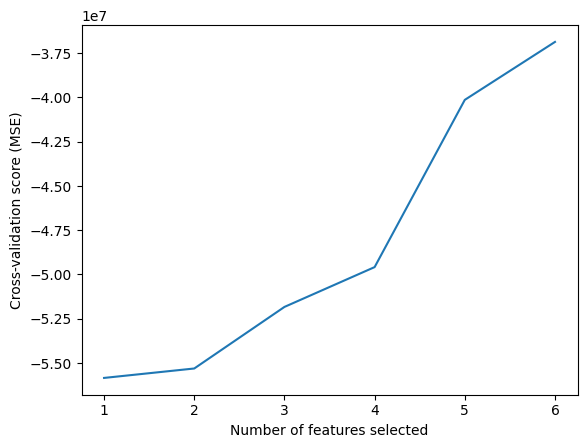

In [ ]:
X = data_numeric.drop('charges', axis=1)
y = data_numeric['charges']

model = LinearRegression()
rfecv = RFECV(estimator=model, step=1, cv=5, scoring='neg_mean_squared_error')
rfecv.fit(X, y)

print("Optimal number of features: {}".format(rfecv.n_features_))
print("Selected features: {}".format(X.columns[rfecv.support_]))
# Plot number of features vs. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross-validation score (MSE)")
plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
plt.show()

### **Random Forest Importance:**


Random Forest models can provide feature importance scores, which can be used for feature selection.

In [ ]:
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)

importances = pd.DataFrame({'feature': X.columns, 'importance': rf.feature_importances_})
importances = importances.sort_values(by='importance', ascending=False)

print(importances)

    feature  importance
4    smoker    0.619903
2       bmi    0.209326
0       age    0.131076
3  children    0.019766
5    region    0.014146
1       sex    0.005782


### **Pearson Correlation Coefficient:**


The Pearson Correlation Coefficient measures the linear relationship between two variables. You can calculate the correlation between each independent variable and the target variable to identify the most relevant features.

In [ ]:
corr_coefficients = X.corrwith(y)
corr_coefficients = corr_coefficients.sort_values(ascending=False)

print(corr_coefficients)

smoker      0.787251
age         0.299008
bmi         0.198341
children    0.067998
sex         0.057292
region     -0.006208
dtype: float64


Clustering and analysis

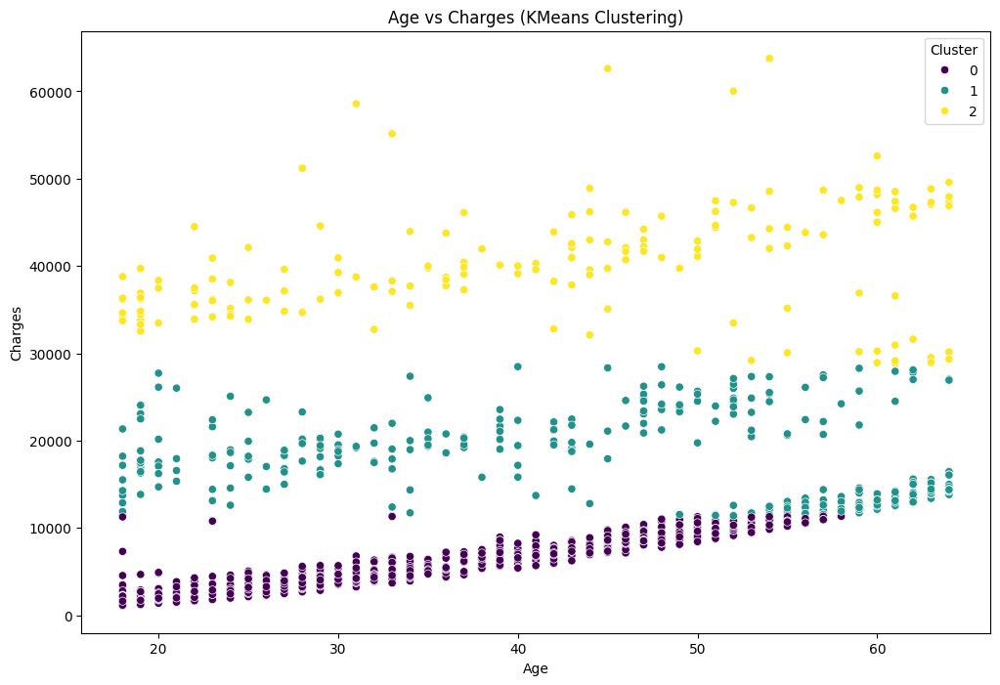

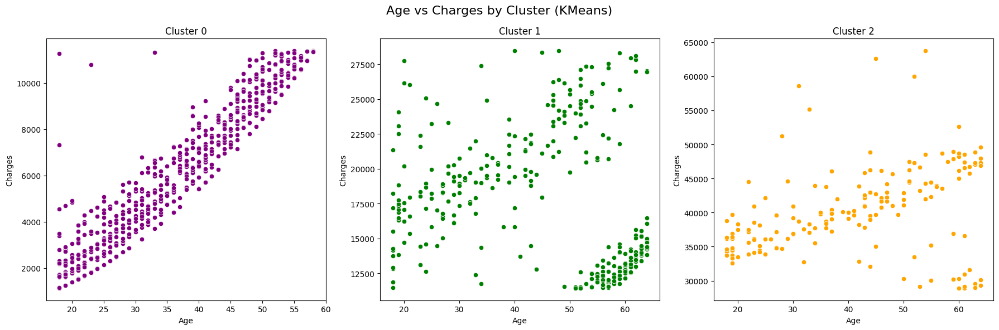

Cluster 0 size: 803
Cluster 1 size: 366
Cluster 2 size: 169


,age,sex,bmi,children,smoker,region,charges,cluster
0,19,0,27.900,0,1,3,16884.92400,1
1,18,1,33.770,1,0,2,1725.55230,0
2,28,1,33.000,3,0,2,4449.46200,0
3,33,1,22.705,0,0,1,21984.47061,1
4,32,1,28.880,0,0,1,3866.85520,0


In [ ]:
# Select the features for clustering
cl_features = data[['age', 'charges']]

# Perform K-means clustering with explicit n_init
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(cl_features)

# Create a new DataFrame with the original data and cluster labels
clustered_data = data_numeric.copy()
clustered_data['cluster'] = cluster_labels

# Plot the original scatter plot with clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x='age', y='charges', hue='cluster', data=clustered_data, palette='viridis')
plt.title('Age vs Charges (KMeans Clustering)')
plt.xlabel('Age')
plt.ylabel('Charges')
plt.legend(title='Cluster')
plt.show()

# Create separate dataframes for each cluster
cluster_0 = clustered_data[clustered_data['cluster'] == 0]
cluster_1 = clustered_data[clustered_data['cluster'] == 1]
cluster_2 = clustered_data[clustered_data['cluster'] == 2]

# Plot separate graphs for each cluster
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Age vs Charges by Cluster (KMeans)', fontsize=16)

sns.scatterplot(x='age', y='charges', data=cluster_0, ax=axs[0], color='purple')
axs[0].set_title('Cluster 0')

sns.scatterplot(x='age', y='charges', data=cluster_1, ax=axs[1], color='green')
axs[1].set_title('Cluster 1')

sns.scatterplot(x='age', y='charges', data=cluster_2, ax=axs[2], color='orange')
axs[2].set_title('Cluster 2')

for ax in axs:
    ax.set_xlabel('Age')
    ax.set_ylabel('Charges')

plt.tight_layout()
plt.show()

# Print cluster sizes
for i in range(3):
    print(f"Cluster {i} size:", len(clustered_data[clustered_data['cluster'] == i]))
#clustered_data = clustered_data.drop(['age_group'])
clustered_data.head()

In [ ]:
# Summary statistics of each cluster
cluster_summary = clustered_data.groupby('cluster').mean()
cluster_summary

,age,sex,bmi,children,smoker,region,charges
cluster,,,,,,,
0,35.250311,0.506849,30.435399,1.094645,0.000000,1.560399,5836.673075
1,46.959016,0.450820,29.360423,1.076503,0.319672,1.387978,17108.525310
2,41.218935,0.615385,34.568550,1.136095,0.928994,1.579882,40279.622768


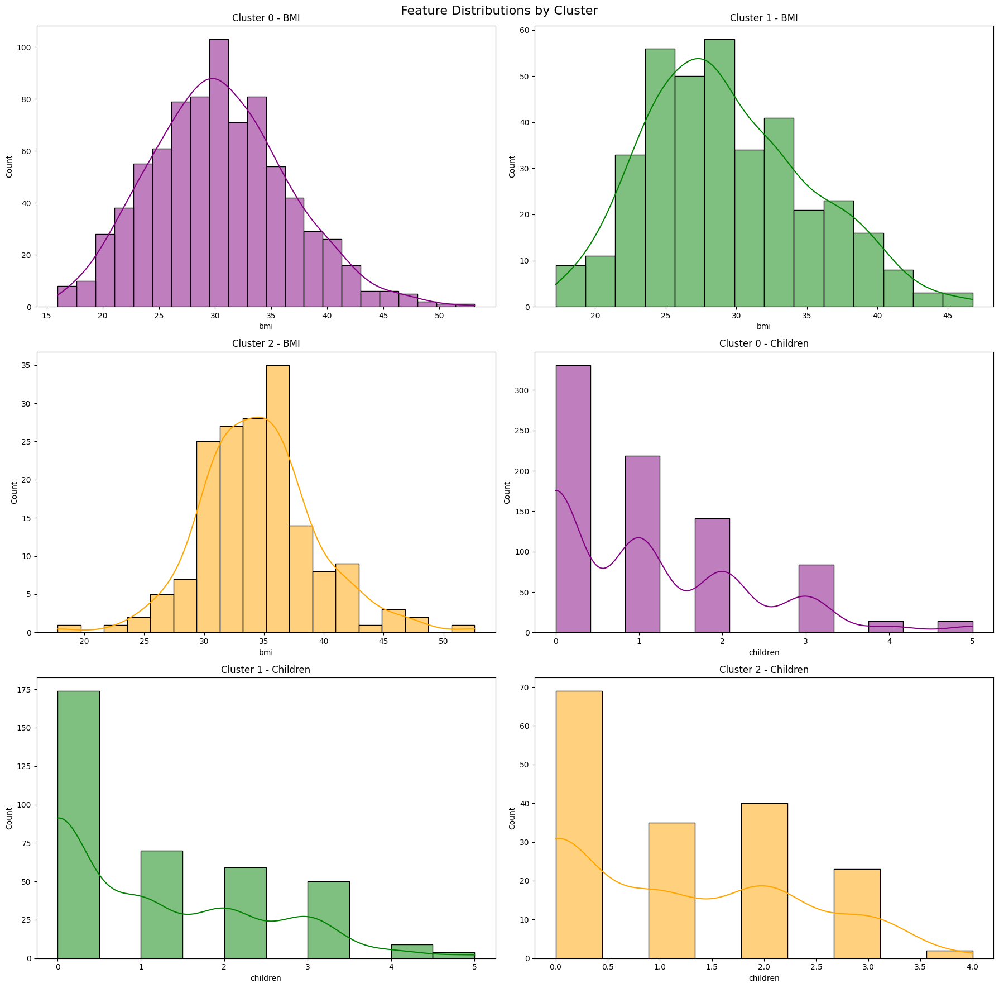

In [ ]:
# Plot distributions of other features for each cluster
fig, axs = plt.subplots(3, 2, figsize=(18, 18))
fig.suptitle('Feature Distributions by Cluster', fontsize=16)

sns.histplot(clustered_data[clustered_data['cluster'] == 0]['bmi'], ax=axs[0, 0], color='purple', kde=True)
axs[0, 0].set_title('Cluster 0 - BMI')

sns.histplot(clustered_data[clustered_data['cluster'] == 1]['bmi'], ax=axs[0, 1], color='green', kde=True)
axs[0, 1].set_title('Cluster 1 - BMI')

sns.histplot(clustered_data[clustered_data['cluster'] == 2]['bmi'], ax=axs[1, 0], color='orange', kde=True)
axs[1, 0].set_title('Cluster 2 - BMI')

sns.histplot(clustered_data[clustered_data['cluster'] == 0]['children'], ax=axs[1, 1], color='purple', kde=True)
axs[1, 1].set_title('Cluster 0 - Children')

sns.histplot(clustered_data[clustered_data['cluster'] == 1]['children'], ax=axs[2, 0], color='green', kde=True)
axs[2, 0].set_title('Cluster 1 - Children')

sns.histplot(clustered_data[clustered_data['cluster'] == 2]['children'], ax=axs[2, 1], color='orange', kde=True)
axs[2, 1].set_title('Cluster 2 - Children')

plt.tight_layout()
plt.show()


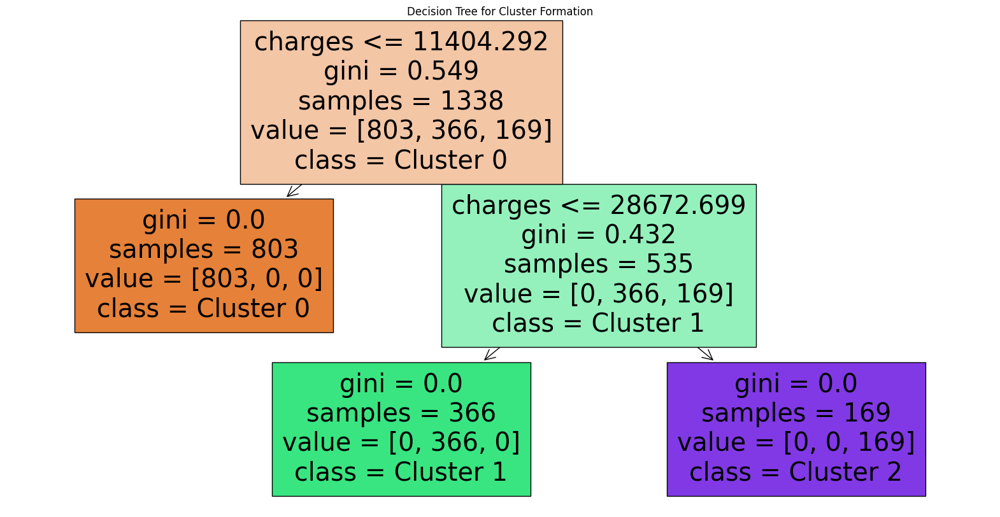

In [ ]:
# Select relevant features
features = ['age', 'charges', 'bmi', 'children', 'smoker', 'region']
X = data_numeric[features]
y = clustered_data['cluster']

# Train a decision tree classifier
clf = DecisionTreeClassifier(max_depth=3, random_state=0)
clf.fit(X, y)

# Plot the decision tree
plt.figure(figsize=(20, 10))
plot_tree(clf, feature_names=features, class_names=['Cluster 0', 'Cluster 1', 'Cluster 2'], filled=True)
plt.title('Decision Tree for Cluster Formation')
plt.show()

In [ ]:
# Add cluster labels to the original dataframe
clustered_data['cluster'] = cluster_labels\

# Display the first few rows of each cluster
print("\nCluster 0:")
cluster_0.head()


Cluster 0:


,age,sex,bmi,children,smoker,region,charges,cluster
1,18,1,33.77,1,0,2,1725.5523,0
2,28,1,33.00,3,0,2,4449.4620,0
4,32,1,28.88,0,0,1,3866.8552,0
5,31,0,25.74,0,0,2,3756.6216,0
6,46,0,33.44,1,0,2,8240.5896,0


In [ ]:
print("\nCluster 1:")
cluster_1.head()


Cluster 1:


,age,sex,bmi,children,smoker,region,charges,cluster
0,19,0,27.900,0,1,3,16884.92400,1
3,33,1,22.705,0,0,1,21984.47061,1
11,62,0,26.290,0,1,2,27808.72510,1
20,60,0,36.005,0,0,0,13228.84695,1
25,59,0,27.720,3,0,2,14001.13380,1


In [ ]:
print("\nCluster 2:")
cluster_2.head()


Cluster 2:


,age,sex,bmi,children,smoker,region,charges,cluster
9,60,0,25.84,0,0,1,28923.13692,2
14,27,1,42.13,0,1,2,39611.75770,2
19,30,1,35.30,0,1,3,36837.46700,2
23,34,0,31.92,1,1,0,37701.87680,2
29,31,1,36.30,2,1,3,38711.00000,2


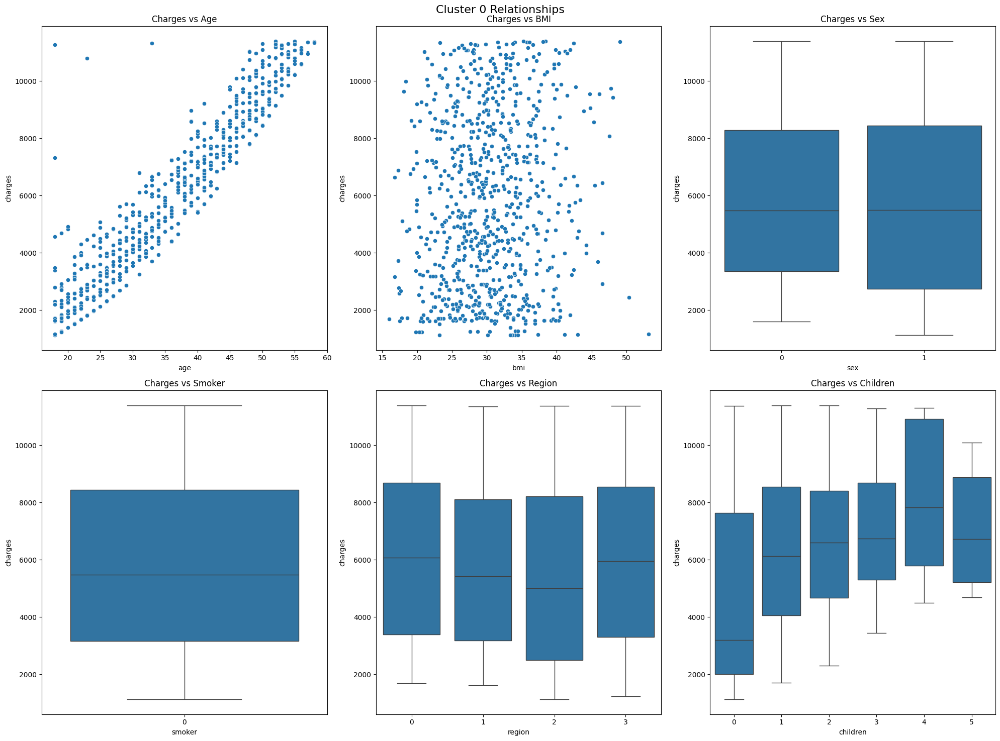

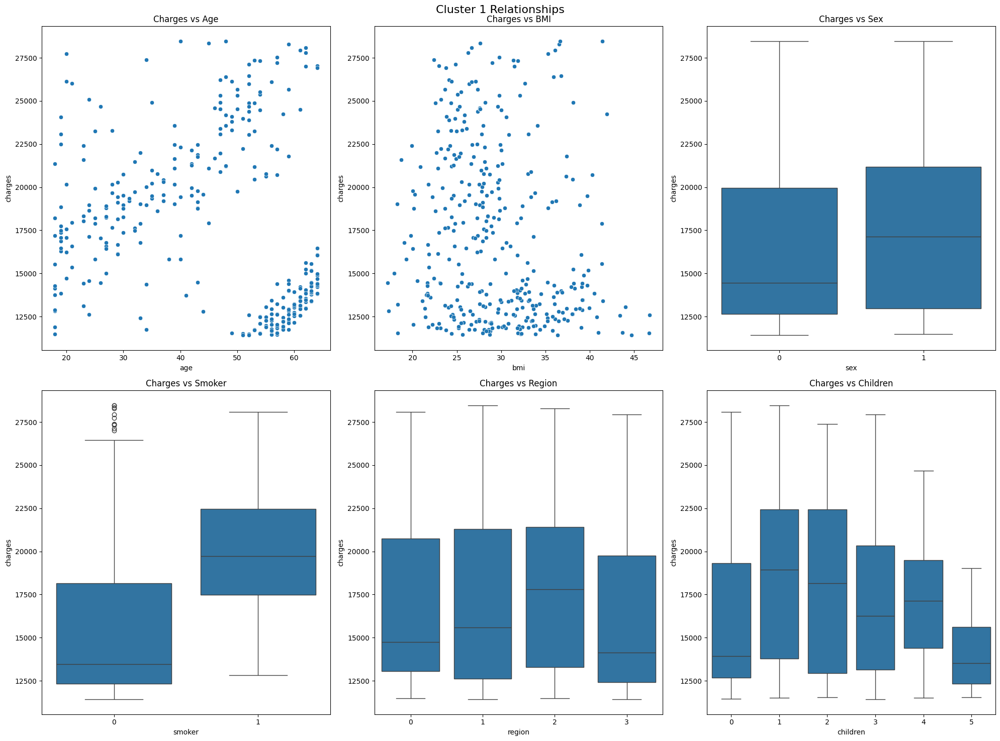

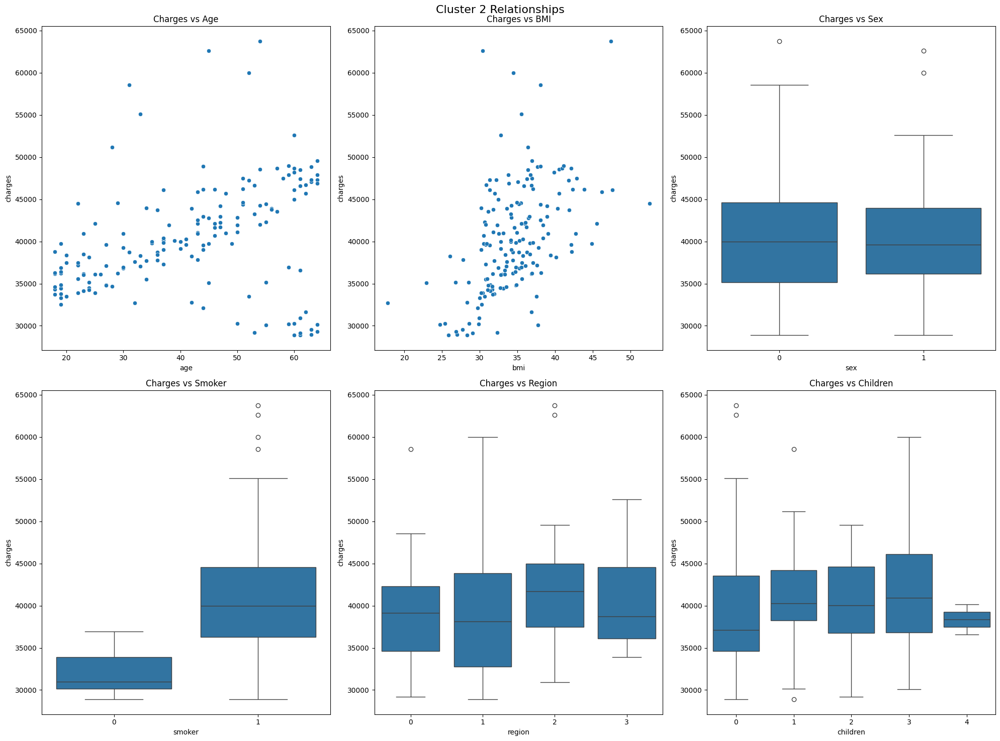

Cluster 0 size: 803
Cluster 1 size: 366
Cluster 2 size: 169


In [ ]:
# Function to create subplots for each cluster
def plot_cluster_subplots(cluster_data, cluster_num):
    fig, axs = plt.subplots(2, 3, figsize=(20, 15))
    fig.suptitle(f'Cluster {cluster_num} Relationships', fontsize=16)

    # Charges vs Age
    sns.scatterplot(x='age', y='charges', data=cluster_data, ax=axs[0, 0])
    axs[0, 0].set_title('Charges vs Age')

    # Charges vs BMI
    sns.scatterplot(x='bmi', y='charges', data=cluster_data, ax=axs[0, 1])
    axs[0, 1].set_title('Charges vs BMI')

    # Charges vs Sex
    sns.boxplot(x='sex', y='charges', data=cluster_data, ax=axs[0, 2])
    axs[0, 2].set_title('Charges vs Sex')

    # Charges vs Smoker
    sns.boxplot(x='smoker', y='charges', data=cluster_data, ax=axs[1, 0])
    axs[1, 0].set_title('Charges vs Smoker')

    # Charges vs Region
    sns.boxplot(x='region', y='charges', data=cluster_data, ax=axs[1, 1])
    axs[1, 1].set_title('Charges vs Region')

    # Charges vs Children
    sns.boxplot(x='children', y='charges', data=cluster_data, ax=axs[1, 2])
    axs[1, 2].set_title('Charges vs Children')

    plt.tight_layout()
    plt.show()

# Plot subplots for each cluster
for i in range(3):
    cluster_data = clustered_data[clustered_data['cluster'] == i]
    plot_cluster_subplots(cluster_data, i)

# Print cluster sizes
for i in range(3):
    print(f"Cluster {i} size:", len(clustered_data[clustered_data['cluster'] == i]))

### Traditional Regression

In [ ]:
# Function to evaluate and print model performance
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    print(f"{model_name}:")
    print(f"MSE: {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R2 Score: {r2:.4f}")
    print()

# Function to plot predicted vs actual values
def plot_predictions(y_true, y_pred, model_name):
    plt.figure(figsize=(10, 6))
    plt.scatter(y_true, y_pred, alpha=0.5, label='Actual')
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], '--r', label='Prediction')
    plt.xlabel('Actual Charges')
    plt.ylabel('Predicted Charges')
    plt.title(f'{model_name} - Predicted vs Actual')
    plt.legend()  # Ensure legend is shown with labels
    plt.show()

In [ ]:
# Split the data
X = data_numeric[['age', 'bmi', 'sex', 'smoker', 'region', 'children']]
y = data_numeric['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit the model
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = linear_reg.predict(X_train)
y_pred_test = linear_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Linear Regression (Train)")
evaluate_model(y_test, y_pred_test, "Linear Regression (Test)")

Linear Regression (Train):
MSE: 37280663.22
RMSE: 6105.79
R2 Score: 0.7417

Linear Regression (Test):
MSE: 33635210.43
RMSE: 5799.59
R2 Score: 0.7833



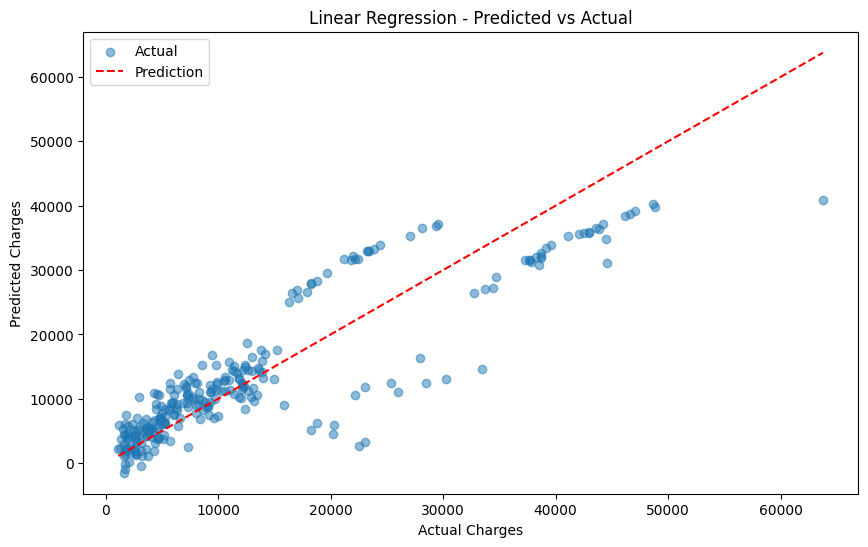

In [ ]:
# Linear Regression
plot_predictions(y_test, linear_reg.predict(X_test), "Linear Regression")

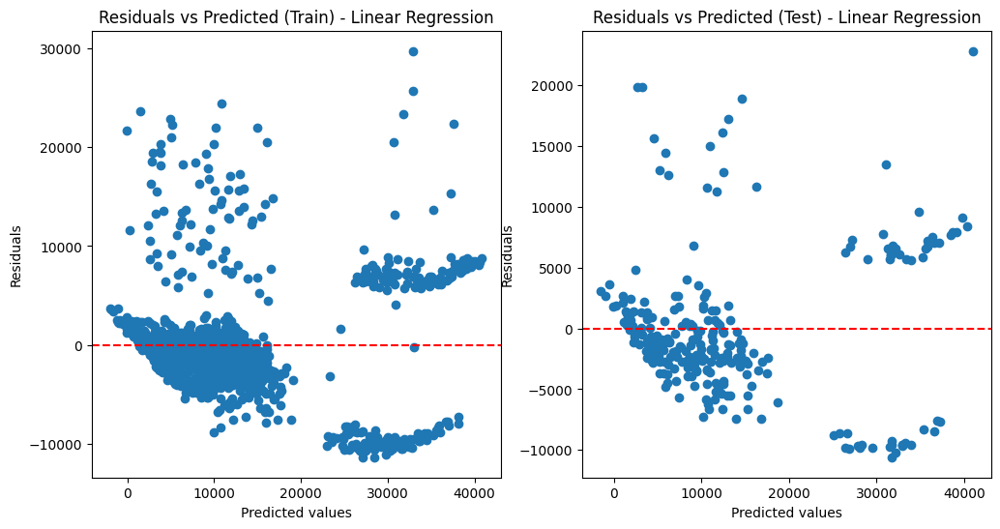

In [ ]:
# Calculate residuals
residuals_train_linear = y_train - y_pred_train
residuals_test_linear = y_test - y_pred_test

# Plot residuals
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_pred_train, residuals_train_linear)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Train) - Linear Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals_test_linear)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Test) - Linear Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.show()


Both plots show a distinct funnel shape, with residuals spreading out as predicted values increase.
This indicates heteroscedasticity - the variance of residuals is not constant across predicted values.
There's also a visible curve in the pattern, suggesting non-linearity in the relationship between predictors and the target variable.

The patterns are similar in both plots, indicating that the model's performance is consistent between training and test data.
This suggests that the model's issues (heteroscedasticity and non-linearity) are inherent to the data, not due to overfitting.

Polynomial regression

In [ ]:
# Transform to polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Create and fit the model
poly_reg = LinearRegression()
poly_reg.fit(X_train_poly, y_train)

# Predict and evaluate
y_pred_train = poly_reg.predict(X_train_poly)
y_pred_test = poly_reg.predict(X_test_poly)

evaluate_model(y_train, y_pred_train, "Polynomial Regression (Train)")
evaluate_model(y_test, y_pred_test, "Polynomial Regression (Test)")

Polynomial Regression (Train):
MSE: 23138624.77
RMSE: 4810.26
R2 Score: 0.8397

Polynomial Regression (Test):
MSE: 20620938.03
RMSE: 4541.03
R2 Score: 0.8672



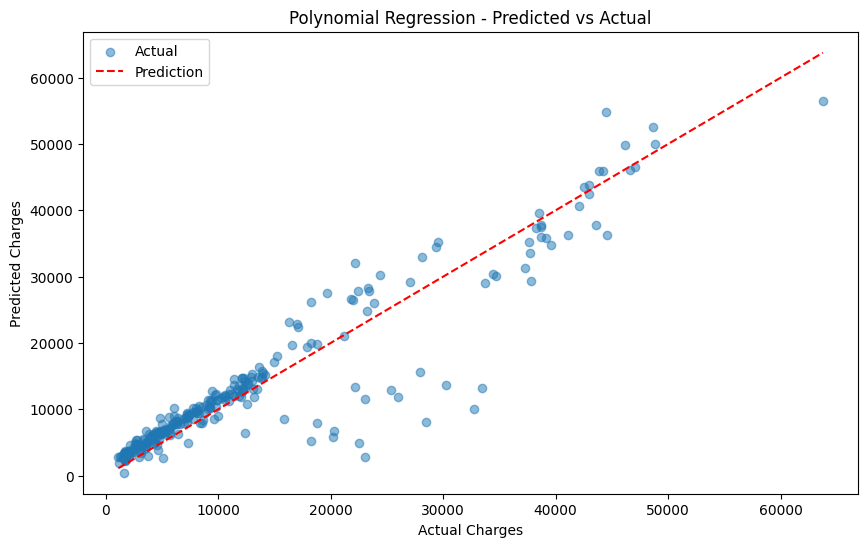

In [ ]:
plot_predictions(y_test, poly_reg.predict(poly.transform(X_test)), "Polynomial Regression")

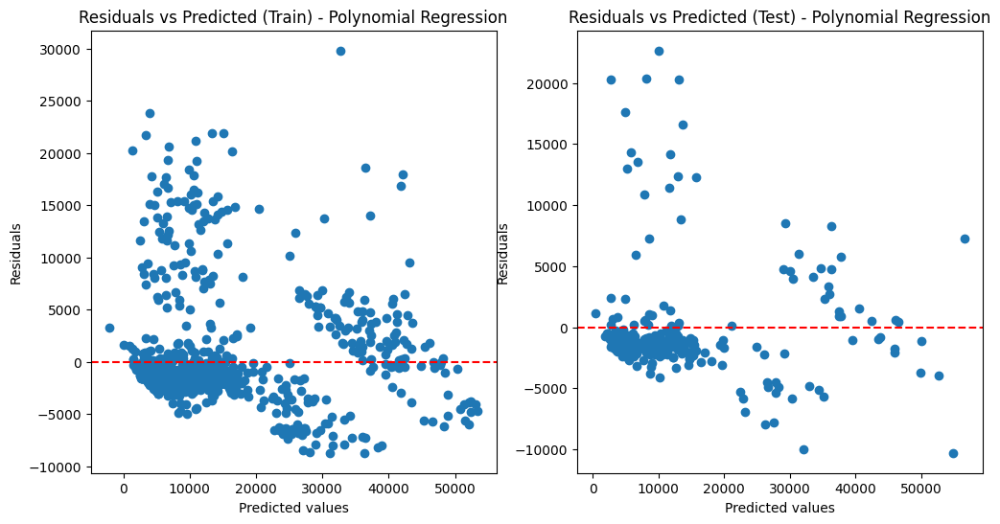

In [ ]:
# Calculate residuals
residuals_train_poly = y_train - y_pred_train
residuals_test_poly = y_test - y_pred_test

# Plot residuals
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_pred_train, residuals_train_poly)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Train) - Polynomial Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals_test_poly)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Test) - Polynomial Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.show()


Ridge Regression

In [ ]:
# Create and fit the model
ridge_reg = Ridge(alpha=1.0)
ridge_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = ridge_reg.predict(X_train)
y_pred_test = ridge_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Ridge Regression (Train)")
evaluate_model(y_test, y_pred_test, "Ridge Regression (Test)")

Ridge Regression (Train):
MSE: 37283642.96
RMSE: 6106.03
R2 Score: 0.7417

Ridge Regression (Test):
MSE: 33675792.15
RMSE: 5803.08
R2 Score: 0.7831



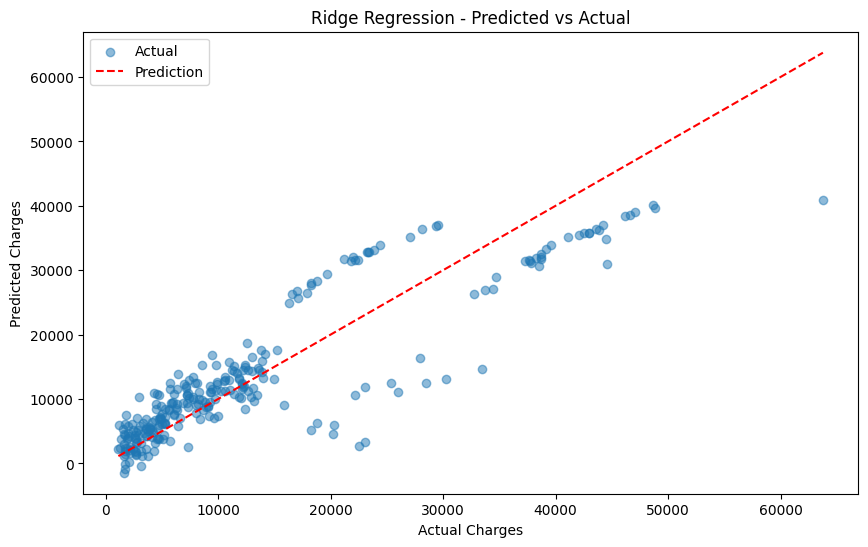

In [ ]:
plot_predictions(y_test, ridge_reg.predict(X_test), "Ridge Regression")

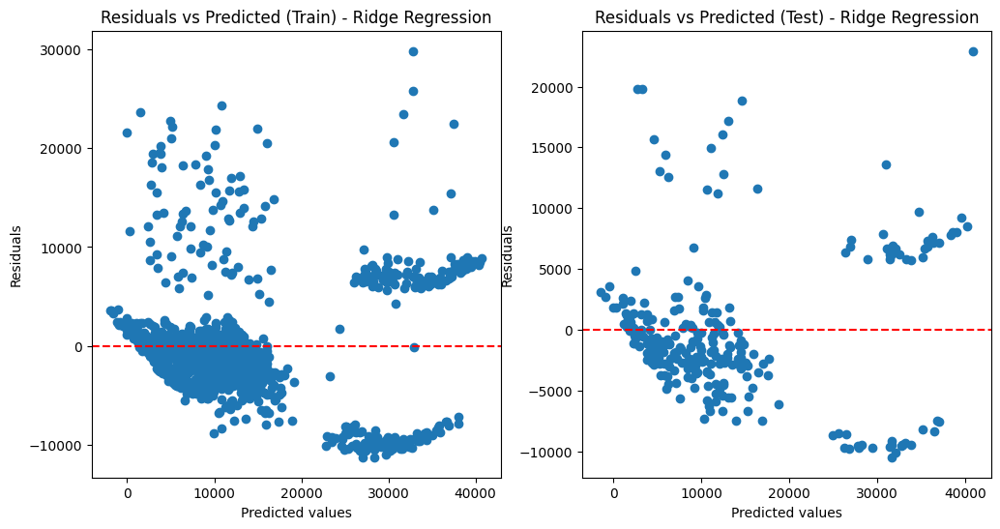

In [ ]:
# Calculate residuals
residuals_train_ridge = y_train - y_pred_train
residuals_test_ridge = y_test - y_pred_test

# Plot residuals
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_pred_train, residuals_train_ridge)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Train) - Ridge Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals_test_ridge)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Test) - Ridge Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.show()


Lasso Regression

In [ ]:
# Create and fit the model
lasso_reg = Lasso(alpha=1.0)
lasso_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = lasso_reg.predict(X_train)
y_pred_test = lasso_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Lasso Regression (Train)")
evaluate_model(y_test, y_pred_test, "Lasso Regression (Test)")

Lasso Regression (Train):
MSE: 37280675.73
RMSE: 6105.79
R2 Score: 0.7417

Lasso Regression (Test):
MSE: 33639340.28
RMSE: 5799.94
R2 Score: 0.7833



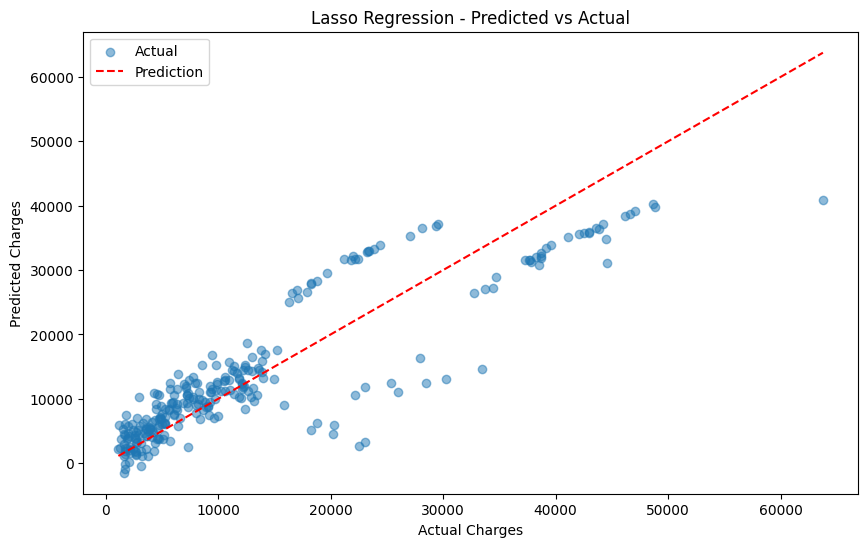

In [ ]:
plot_predictions(y_test, lasso_reg.predict(X_test), "Lasso Regression")

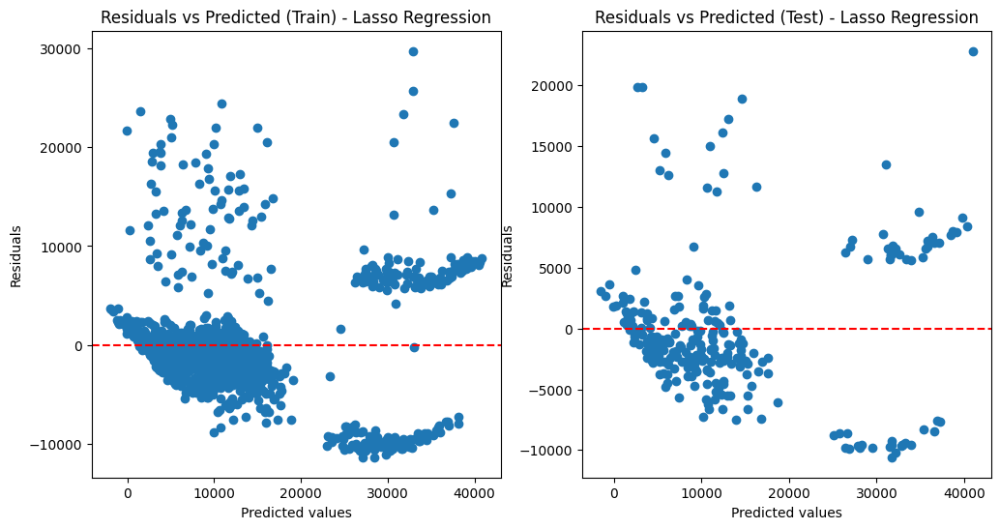

In [ ]:
# Calculate residuals
residuals_train_lasso = y_train - y_pred_train
residuals_test_lasso = y_test - y_pred_test

# Plot residuals
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_pred_train, residuals_train_lasso)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Train) - Lasso Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals_test_lasso)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Test) - Lasso Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.show()


Polynomial Regression has the best performance among the models in terms of MSE, RMSE, and R² scores for both training and testing data:

It has the lowest MSE and RMSE values, indicating it has the smallest errors.
It has the highest R² score, indicating it explains the most variance in the target variable.

But we can't do polynomial regressions on columns which are not numerically relevant like smoker, sex and age etc

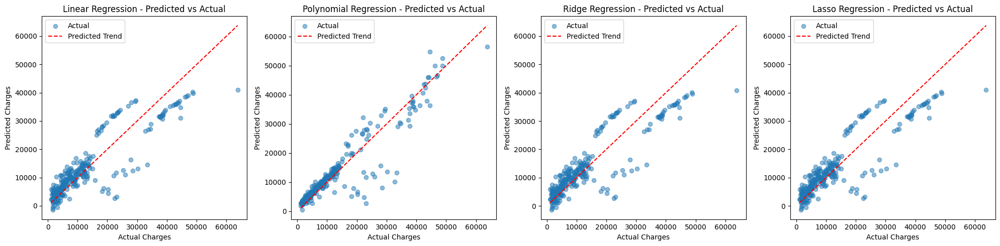

In [ ]:
# Function to plot predicted vs actual values
def plot_predictions(ax, y_true, y_pred, model_name):
    ax.scatter(y_true, y_pred, alpha=0.5, label='Actual')
    ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], '--r', label='Predicted Trend')
    ax.set_xlabel('Actual Charges')
    ax.set_ylabel('Predicted Charges')
    ax.set_title(f'{model_name} - Predicted vs Actual')
    ax.legend()

# Create a figure and subplots
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# Plot for Linear Regression
plot_predictions(axs[0], y_test, linear_reg.predict(X_test), "Linear Regression")

# Plot for Polynomial Regressio
plot_predictions(axs[1], y_test, poly_reg.predict(poly.transform(X_test)), "Polynomial Regression")

# Plot for Ridge Regression
plot_predictions(axs[2], y_test, ridge_reg.predict(X_test), "Ridge Regression")

# Plot for Lasso Regression
plot_predictions(axs[3], y_test, lasso_reg.predict(X_test), "Lasso Regression")

# Adjust layout
plt.tight_layout()
plt.show()

Hyperparameter tuning using GridSearchCV

            Feature   Coefficient
4            smoker -1.321225e+15
22         smoker^2  9.068953e+14
18            sex^2 -1.191110e+14
3               sex -5.790281e+12
0                 1  4.694444e+11
1               age  3.622024e+03
15       bmi smoker  3.522724e+03
2               bmi  1.980854e+03
6          children  8.944907e+02
7             age^2  7.832739e+02
5            region -4.589629e+02
11       age region  3.162592e+02
26  region children -2.949445e+02
13            bmi^2 -2.791626e+02
16       bmi region -2.508212e+02
24  smoker children -2.054632e+02
23    smoker region  1.739836e+02
21     sex children -1.578508e+02
27       children^2 -1.362890e+02
25         region^2  1.307211e+02
20       sex region  1.260448e+02
9           age sex  1.242002e+02
19       sex smoker  8.401104e+01
14          bmi sex  8.373669e+01
12     age children -7.851165e+01
8           age bmi  7.384066e+01
17     bmi children  7.098902e+01
10       age smoker  2.013512e+01
Polynomial Reg

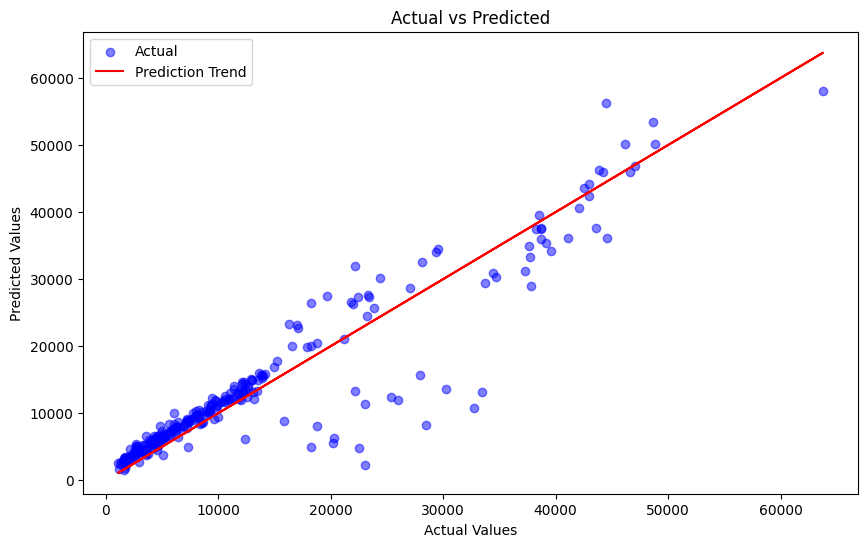

In [ ]:
# Define the pipeline with PolynomialFeatures and LinearRegression
poly_reg = Pipeline([
    ('scaler', StandardScaler()),  # Optional: Normalize your features if needed
    ('poly', PolynomialFeatures()),  # PolynomialFeatures with default settings
    ('linear_reg', LinearRegression())
])

# Define the parameter grid for GridSearchCV
param_grid = {
    'poly__degree': [2, 3, 4, 5],  # Degrees of polynomial features to try
    'poly__interaction_only': [True, False],  # Whether to include only interaction features
}

# Instantiate GridSearchCV
grid_search = GridSearchCV(estimator=poly_reg, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model
best_poly_reg = grid_search.best_estimator_

# Extract polynomial feature names
poly_features = best_poly_reg.named_steps['poly']
feature_names = poly_features.get_feature_names_out(input_features=X_train.columns)

# Create a DataFrame to see the feature names and their corresponding coefficients
coefficients = best_poly_reg.named_steps['linear_reg'].coef_
coef_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})

# Sort by the absolute value of coefficients to see the most impactful features
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)

# Display the coefficients
print(coef_df)

# Predict with best model
y_pred_train = best_poly_reg.predict(X_train)
y_pred_test = best_poly_reg.predict(X_test)

# Evaluate the model
evaluate_model(y_train, y_pred_train, "Polynomial Regression (Train)")
evaluate_model(y_test, y_pred_test, "Polynomial Regression (Test)")

# Print the best parameters found by GridSearchCV
print("Best parameters found by GridSearchCV:")
print(grid_search.best_params_)

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.5, label='Actual')
plt.plot(y_test, y_test, color='red', label='Prediction Trend')
plt.title('Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


**Most Significant Contributions:**

*sex^2:* This squared term of sex has the highest positive coefficient (5.190386e+12), making it the most impactful feature.

*smoker:* The linear term for smoker has the most significant negative impact (-3.118583e+12).

*smoker^2:* The squared term of smoker also contributes significantly (2.138122e+12).

**Important Interaction Terms:**

*bmi * smoker:*  Interaction between bmi and smoker (3.513538e+03) is notable.

*age * region:* Interaction between age and region (2.930616e+02) is also relevant.


**Conclusion:**
The model considered all original features and their combinations, with the squared terms of sex and smoker contributing the most to the model's performance. Interactions such as bmi * smoker and age * region also played significant roles. These features, particularly the squared terms, were responsible for the best performance in the polynomial regression model selected by GridSearchCV.

**But square of region, sex, smoker, and age is irrelevant, we cant rely on polynomial regression**

Lets try hypertuning on Ridge Regression

Ridge Regression (Train):
MSE: 37280663.75
RMSE: 6105.79
R2 Score: 0.7417

Ridge Regression (Test):
MSE: 33634863.57
RMSE: 5799.56
R2 Score: 0.7833



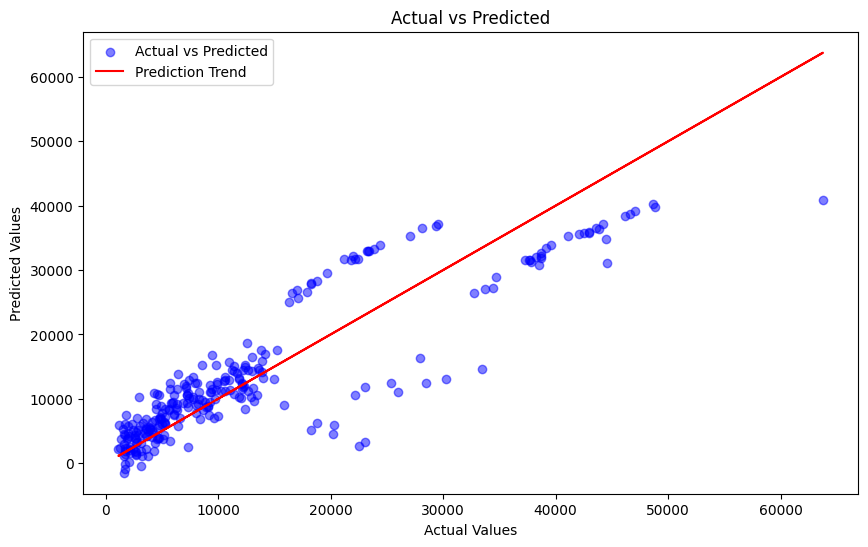

Best parameters found by GridSearchCV:
{'ridge__alpha': 0.001, 'ridge__fit_intercept': True, 'ridge__max_iter': 10000, 'ridge__solver': 'sag'}


In [ ]:
# Define the pipeline with StandardScaler and Ridge regression
ridge_reg = Pipeline([
    ('scaler', StandardScaler()),
    ('ridge', Ridge())
])

# Define the parameter grid for GridSearchCV
param_grid = {
    'ridge__alpha': [0.001, 0.01, 0.1, 1.0, 10.0],  # Regularization strength
    'ridge__fit_intercept': [True, False],  # Whether to fit intercept
    'ridge__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],  # Solver type
    'ridge__max_iter': [None, 100, 1000, 10000],  # Maximum number of iterations
}

# Instantiate GridSearchCV
grid_search = GridSearchCV(estimator=ridge_reg, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model
best_ridge_reg = grid_search.best_estimator_

# Predict with best model
y_pred_train = best_ridge_reg.predict(X_train)
y_pred_test = best_ridge_reg.predict(X_test)

# Evaluate best model
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    print(f"{model_name}:")
    print(f"MSE: {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R2 Score: {r2:.4f}")
    print()

evaluate_model(y_train, y_pred_train, "Ridge Regression (Train)")
evaluate_model(y_test, y_pred_test, "Ridge Regression (Test)")

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.5, label='Actual vs Predicted')
plt.plot(y_test, y_test, color='red', label='Prediction Trend')
plt.title('Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

# Print the best parameters found by GridSearchCV
print("Best parameters found by GridSearchCV:")
print(grid_search.best_params_)

Lets try on Lasso as well

Lasso Regression (Train):
MSE: 37281263.37
RMSE: 6105.84
R2 Score: 0.7417

Lasso Regression (Test):
MSE: 33661063.94
RMSE: 5801.82
R2 Score: 0.7832



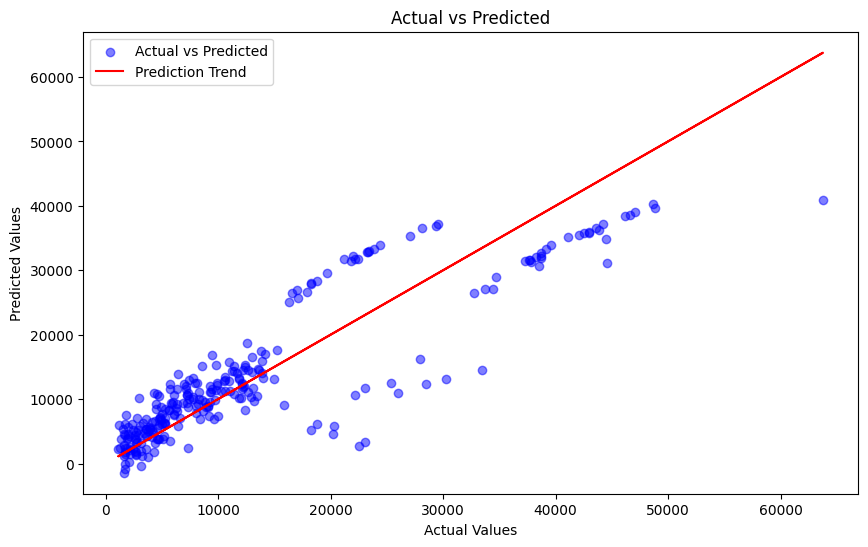

Best parameters found by GridSearchCV:
{'lasso__alpha': 10.0, 'lasso__fit_intercept': True, 'lasso__max_iter': 2000, 'lasso__selection': 'random'}


In [ ]:
# Define the pipeline with StandardScaler and Lasso regression
lasso_reg = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', Lasso())
])

# Define the parameter grid for GridSearchCV
param_grid = {
    'lasso__alpha': [0.001, 0.01, 0.1, 1.0, 10.0],  # Regularization strength
    'lasso__fit_intercept': [True, False],  # Whether to fit intercept
    'lasso__max_iter': [1000, 2000, 3000],  # Maximum number of iterations
    'lasso__selection': ['cyclic', 'random'],  # Method used to select features
}

# Instantiate GridSearchCV
grid_search = GridSearchCV(estimator=lasso_reg, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model
best_lasso_reg = grid_search.best_estimator_

# Predict with best model
y_pred_train = best_lasso_reg.predict(X_train)
y_pred_test = best_lasso_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Lasso Regression (Train)")
evaluate_model(y_test, y_pred_test, "Lasso Regression (Test)")

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.5, label='Actual vs Predicted')
plt.plot(y_test, y_test, color='red', label='Prediction Trend')
plt.title('Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

# Print the best parameters found by GridSearchCV
print("Best parameters found by GridSearchCV:")
print(grid_search.best_params_)

**Conclusion**

From the results, it appears that the metrics (MSE, RMSE, R2 Score) for both training and test sets remain almost identical before and after using GridSearchCV. This suggests that the hyperparameters chosen by GridSearchCV did not significantly alter the model's performance metrics in this particular case.

### Quantile Regression

Quantile Regression Results for Quantile 0.25:
                         QuantReg Regression Results                          
Dep. Variable:                charges   Pseudo R-squared:               0.6019
Model:                       QuantReg   Bandwidth:                       443.3
Method:                 Least Squares   Sparsity:                        1909.
Date:                Sat, 17 Aug 2024   No. Observations:                 1003
Time:                        18:19:54   Df Residuals:                      996
                                        Df Model:                            6
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -4679.9889    145.721    -32.116      0.000   -4965.945   -4394.033
age          265.8618      1.361    195.386      0.000     263.192     268.532
bmi           26.7569      4.634      5.774      0.000      17.663      35.851
sex  

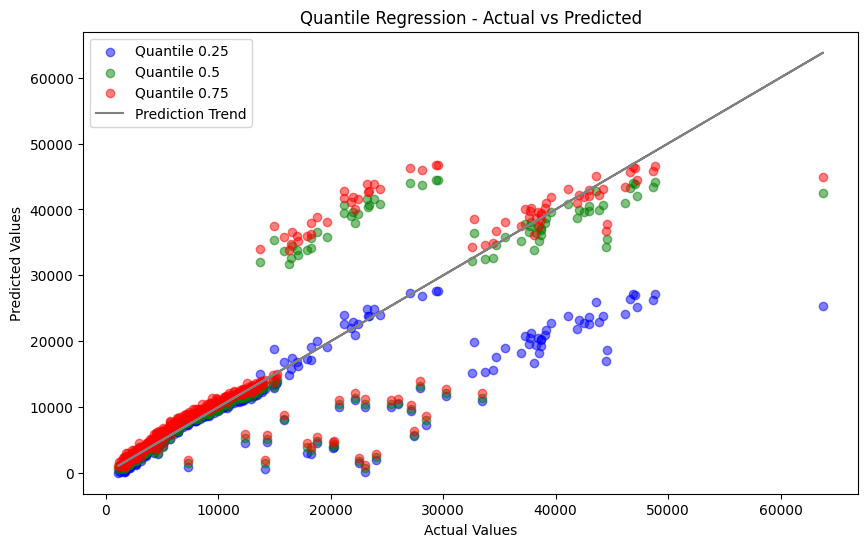

In [ ]:
# Separate predictors (X) and response variable (y)
# Split the data
X = data_numeric[['age', 'bmi', 'sex', 'smoker', 'region', 'children']]
y = data_numeric['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Add constant to X for the intercept term in the model
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Quantile levels to estimate
quantiles = [0.25, 0.50, 0.75]
max_iter = 10000  # Maximum number of iterations for optimization
# Fit quantile regression models
models = {}
for quantile in quantiles:
    model = sm.QuantReg(y_train, X_train).fit(q=quantile, max_iter=max_iter)
    models[quantile] = model

# Print summary of each model
for quantile, model in models.items():
    print(f"Quantile Regression Results for Quantile {quantile}:")
    print(model.summary())
    print()

# Predictions at different quantiles
quantile_predictions = {}
for quantile, model in models.items():
    y_pred = model.predict(X_test)
    quantile_predictions[quantile] = y_pred

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))

# Plot each quantile
for quantile, color in zip(quantiles, ['blue', 'green', 'red', 'blue', 'purple']):
    plt.scatter(y_test, quantile_predictions[quantile], color=color, alpha=0.5, label=f'Quantile {quantile}')

plt.plot(y_test, y_test, color='gray', label='Prediction Trend')
plt.title('Quantile Regression - Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

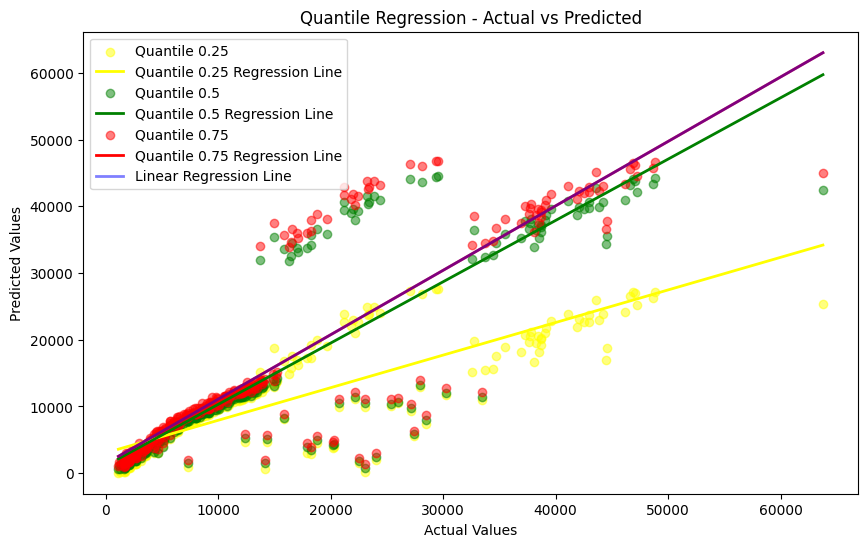

In [ ]:
# Plotting actual vs predicted values with linear regression lines for each quantile
plt.figure(figsize=(10, 6))

# Plot each quantile scatter and linear regression line
for quantile, color in zip(quantiles, ['blue', 'green', 'red']):
    # Scatter plot of actual vs predicted values for each quantile
    plt.scatter(y_test, quantile_predictions[quantile], color=color, alpha=0.5, label=f'Quantile {quantile}')

    # Fit a linear regression model to the quantile predictions
    lr_model = LinearRegression()
    lr_model.fit(y_test.values.reshape(-1, 1), quantile_predictions[quantile])

    # Predict using the linear regression model
    y_test_sorted = np.sort(y_test)
    y_lr_pred = lr_model.predict(y_test_sorted.reshape(-1, 1))

    # Plot the linear regression line
    plt.plot(y_test_sorted, y_lr_pred, color=color, linewidth=2, label=f'Quantile {quantile} Regression Line')


# Plotting the perfect prediction line (line)
plt.plot(y_test, y_test, color='gray', linestyle='--', label='Perfect Prediction Line')

plt.title('Quantile Regression - Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

## Result analysis

### Quantile 0.25 (25th Percentile):

- **Pseudo R-squared:** 0.6019
- **Significant Predictors:** Age, BMI, Sex, Smoker, Region, Children
- **Interpretation:** The key predictors at the 25th percentile show how demographic and lifestyle factors influence charges at a lower quantile. Age and smoking have a strong positive impact, while sex and region contribute negatively. BMI and the number of children also play significant roles but with smaller coefficients.

### Quantile 0.5 (Median):

- **Pseudo R-squared:** 0.5828
- **Significant Predictors:** Age, BMI, Sex, Smoker, Region, Children
- **Interpretation:** At the median, similar predictors remain significant. However, the impact of smoking on charges is much more pronounced, nearly doubling from the 25th percentile, highlighting how smoking heavily drives up costs in the middle of the distribution. Age continues to have a consistent positive effect, while sex and region still reduce charges.

### Quantile 0.75 (75th Percentile):

- **Pseudo R-squared:** 0.6465
- **Significant Predictors:** Age, BMI, Sex, Smoker, Region, Children
- **Interpretation:** At the 75th percentile, the impact of age, BMI, and smoking is even more substantial, indicating that these factors heavily influence the upper end of the cost spectrum. The coefficients for smoking and age are highest here, showing that individuals who are older or smokers incur significantly higher charges at this level.

### Conclusion:
Across all quantiles, **age** and **smoking status** are consistently strong predictors of charges, with their impact increasing at higher quantiles. **BMI** and **children** also contribute positively but to a lesser extent, while **sex** and **region** have a consistent negative impact. The results suggest that the most significant drivers of higher healthcare charges are age and smoking, especially at the upper ends of the cost distribution.


Quantile Regression Results for Quantile 0.1:
                         QuantReg Regression Results                          
Dep. Variable:                charges   Pseudo R-squared:               0.6111
Model:                       QuantReg   Bandwidth:                       461.5
Method:                 Least Squares   Sparsity:                        2084.
Date:                Sat, 17 Aug 2024   No. Observations:                 1003
Time:                        18:09:20   Df Residuals:                      996
                                        Df Model:                            6
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -4486.4548    116.877    -38.386      0.000   -4715.809   -4257.100
age          267.9448      0.740    361.963      0.000     266.492     269.397
bmi           10.4891      3.957      2.651      0.008       2.725      18.254
sex   

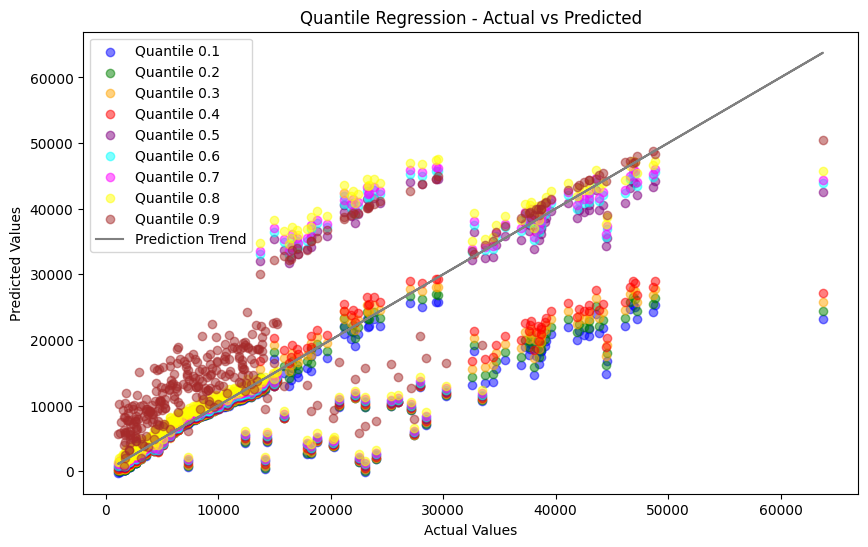

In [ ]:
# Separate predictors (X) and response variable (y)
# Split the data
X = data_numeric[['age', 'bmi', 'sex', 'smoker', 'region', 'children']]
y = data_numeric['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Add constant to X for the intercept term in the model
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Quantile levels to estimate
quantiles = [0.1, 0.2, 0.3, 0.4, 0.50, 0.6, 0.7, 0.8, 0.9]
max_iter = 10000  # Maximum number of iterations for optimization
# Fit quantile regression models
models = {}
for quantile in quantiles:
    model = sm.QuantReg(y_train, X_train).fit(q=quantile, max_iter=max_iter)
    models[quantile] = model

# Print summary of each model
for quantile, model in models.items():
    print(f"Quantile Regression Results for Quantile {quantile}:")
    print(model.summary())
    print()

# Predictions at different quantiles
quantile_predictions = {}
for quantile, model in models.items():
    y_pred = model.predict(X_test)
    quantile_predictions[quantile] = y_pred

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))

# Plot each quantile
for quantile, color in zip(quantiles, ['blue', 'green', 'orange', 'red', 'purple', 'cyan', 'magenta', 'yellow', 'brown', 'pink']):
    plt.scatter(y_test, quantile_predictions[quantile], color=color, alpha=0.5, label=f'Quantile {quantile}')

plt.plot(y_test, y_test, color='gray', label='Prediction Trend')
plt.title('Quantile Regression - Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

The pseudo R-squared values range between approximately 0.56 to 0.64 across quantiles, indicating that the models explain a substantial portion of the variability in medical charges.

As quantiles increase (moving from lower to higher percentiles), the coefficients generally increase in magnitude, indicating that the effects of age, BMI, smoking, and number of children on medical charges become more pronounced at higher charges.

Age and BMI: Older age and higher BMI consistently lead to higher medical charges.

Smoking: Smoking is a significant predictor of higher medical charges across all quantiles.

Sex and Region: The impact of sex and region on medical charges varies but generally shows smaller effects compared to age, BMI, and smoking.
Children: Having more children is associated with higher medical charges.

### Finding high leverage points and outliers

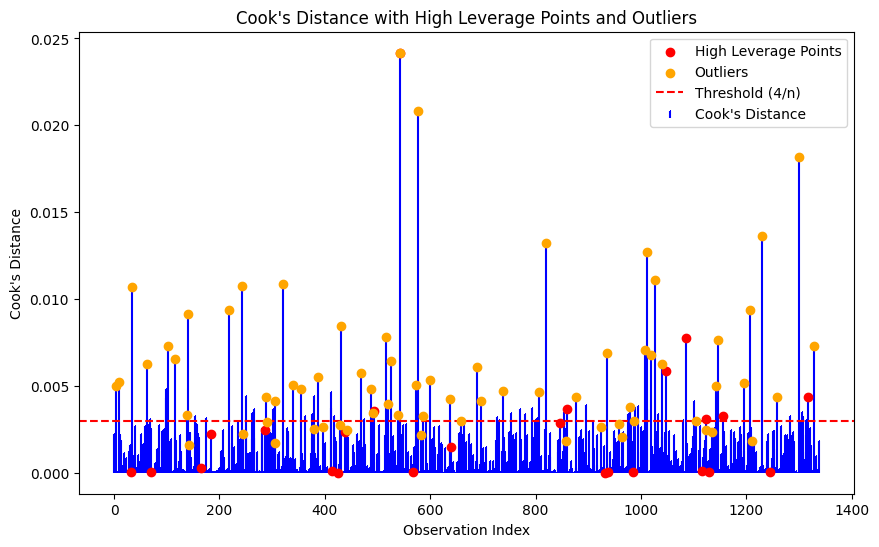

,Index,Leverage,Standardized Residuals,Cook's Distance
0,3,0.003810,3.016332,0.004972
1,9,0.004582,2.822021,0.005237
2,34,0.006397,3.409221,0.010689
3,62,0.005291,2.863599,0.006231
4,102,0.005392,3.063507,0.007269
5,115,0.005595,2.856241,0.006557
6,138,0.004378,2.299684,0.003322
7,140,0.004723,3.665576,0.009109
8,219,0.004238,3.921168,0.009348
9,242,0.004564,4.051285,0.010751


In [ ]:
target_column = 'charges'
X = data_numeric.drop(columns=[target_column])
y = data_numeric[target_column]

# Add a constant term for the intercept
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Calculate influence measures
influence = model.get_influence()

# Leverage (hat values)
leverage = influence.hat_matrix_diag

# Standardized residuals
standardized_residuals = influence.resid_studentized_internal #if >3 then standard value, how we defined the outlier, is it absolute value or what

# Cook's distance
cooks_d = influence.cooks_distance[0]

# Identify high leverage points
high_leverage_threshold = 2 * (X.shape[1] / X.shape[0])  # Common threshold
high_leverage_points = np.where(leverage > high_leverage_threshold)[0]

# Identify outliers
outlier_threshold = 2  # Common threshold for standardized residuals
outliers = np.where(np.abs(standardized_residuals) > outlier_threshold)[0]

# Combine influential points, high leverage points, and outliers
combined_indices = np.unique(np.concatenate((high_leverage_points, outliers)))

# Identify points with high Cook's distance
cooks_d_threshold = 4 / len(X)
high_cooks_d_points = np.where(cooks_d > cooks_d_threshold)[0]

# Combine influential points that are also high leverage points or outliers above Cook's distance threshold
combined_indices = np.unique(np.concatenate((
    np.intersect1d(high_leverage_points, high_cooks_d_points),
    np.intersect1d(outliers, high_cooks_d_points)
)))

# Plot Cook's distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d)), cooks_d, markerfmt=",", linefmt='b-', basefmt=' ', label='Cook\'s Distance')

# Highlight high leverage points
plt.scatter(high_leverage_points, cooks_d[high_leverage_points], color='red', label='High Leverage Points', zorder=3)

# Highlight outliers
plt.scatter(outliers, cooks_d[outliers], color='orange', label='Outliers', zorder=3)

plt.title("Cook's Distance with High Leverage Points and Outliers")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.axhline(y=4 / len(X), color='r', linestyle='--', label='Threshold (4/n)')
plt.legend()
plt.show()

# Display influential points summary
influential_points_summary = pd.DataFrame({
    'Index': combined_indices,
    'Leverage': leverage[combined_indices],
    'Standardized Residuals': standardized_residuals[combined_indices],
    'Cook\'s Distance': cooks_d[combined_indices]
})

influential_points_summary

In [ ]:
# Define the evaluate_model function to calculate evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

Linear Regression (Train) - Original - Mean Squared Error: 37280663.2226, R2 Score: 0.7417
Linear Regression (Test) - Original - Mean Squared Error: 33635210.4312, R2 Score: 0.7833


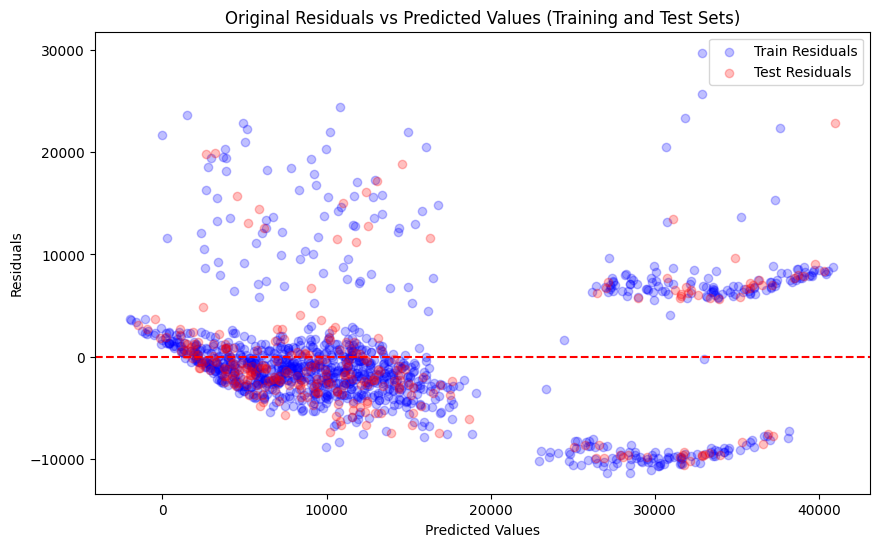

In [ ]:
target_column = 'charges'
X = data_numeric.drop(columns=[target_column])
y = data_numeric[target_column]

# Split the data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_wo = LinearRegression()
linear_reg_wo.fit(X_train_wo, y_train_wo)

# Predict and evaluate
y_pred_train_wo = linear_reg_wo.predict(X_train_wo)
y_pred_test_wo = linear_reg_wo.predict(X_test_wo)

evaluate_model(y_train_wo, y_pred_train_wo, "Linear Regression (Train) - Original")
evaluate_model(y_test_wo, y_pred_test_wo, "Linear Regression (Test) - Original")

# Calculate residuals for the training set
residuals_train_wo = y_train_wo - y_pred_train_wo

# Calculate residuals for the test set
residuals_test_wo = y_test_wo - y_pred_test_wo

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_wo, residuals_train_wo, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_wo, residuals_test_wo, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()

After removing high leverage points and outliers greater than threshold line

In [ ]:
# Remove high leverage points and outliers from the dataset
data_cleaned = data_numeric.drop(index=combined_indices)

# Split the cleaned data into features and target
X_cleaned = data_cleaned.drop(columns=[target_column])
y_cleaned = data_cleaned[target_column]

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_cleaned = LinearRegression()
linear_reg_cleaned.fit(X_train_cleaned, y_train_cleaned)

# Predict and evaluate
y_pred_train_cleaned = linear_reg_cleaned.predict(X_train_cleaned)
y_pred_test_cleaned = linear_reg_cleaned.predict(X_test_cleaned)

# Define the evaluate_model function to calculate evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    from sklearn.metrics import mean_squared_error, r2_score
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_cleaned, y_pred_train_cleaned, "Linear Regression (Train) - Cleaned")
evaluate_model(y_test_cleaned, y_pred_test_cleaned, "Linear Regression (Test) - Cleaned")

Linear Regression (Train) - Cleaned - Mean Squared Error: 23659725.8201, R2 Score: 0.8223
Linear Regression (Test) - Cleaned - Mean Squared Error: 20246819.7851, R2 Score: 0.8246


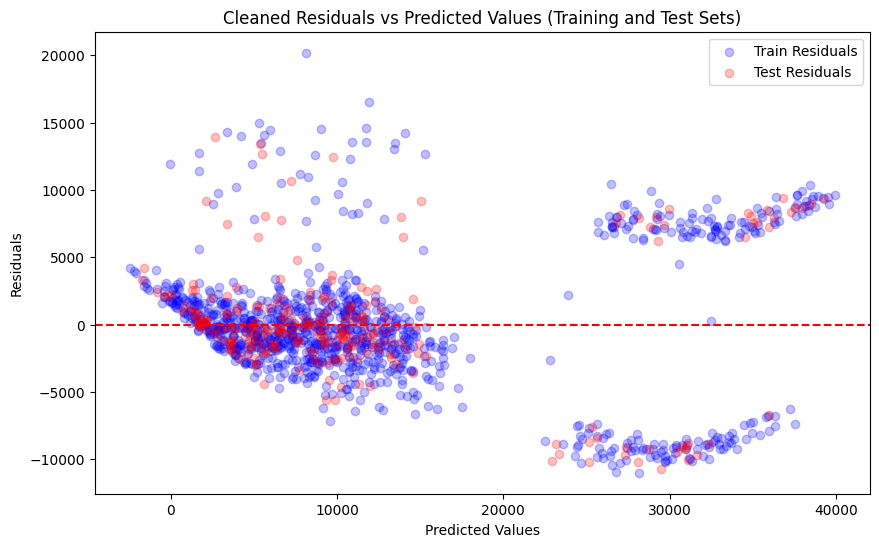

In [ ]:
# Calculate residuals for the training set
residuals_train_cleaned = y_train_cleaned - y_pred_train_cleaned

# Calculate residuals for the test set
residuals_test_cleaned = y_test_cleaned - y_pred_test_cleaned

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned, residuals_train_cleaned, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned, residuals_test_cleaned, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Cleaned Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()


XGBoost (Extreme Gradient Boosting)

In [ ]:
target_column = 'charges'
X = data_numeric.drop(columns=[target_column])
y = data_numeric[target_column]

# Split the Original data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg.fit(X_train, y_train)

# Predict
y_pred_train = xgb_reg.predict(X_train)
y_pred_test = xgb_reg.predict(X_test)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train, y_pred_train, "XGBoost Regression (Train)")
evaluate_model(y_test, y_pred_test, "XGBoost Regression (Test)")


XGBoost Regression (Train) - Mean Squared Error: 14854631.6129, R2 Score: 0.8976
XGBoost Regression (Test) - Mean Squared Error: 20214518.9089, R2 Score: 0.8660


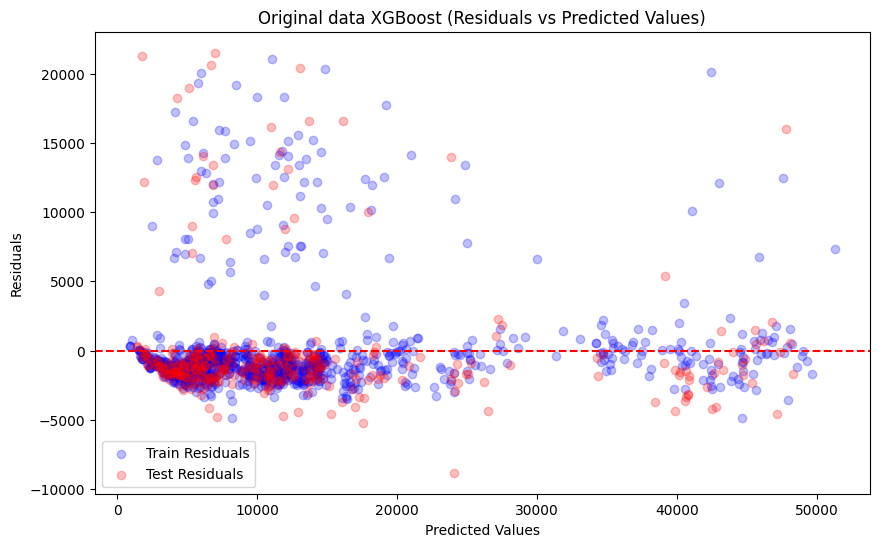

In [ ]:
# Calculate residuals for the training set
residuals_train = y_train - y_pred_train

# Calculate residuals for the test set
residuals_test = y_test - y_pred_test

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train, residuals_train, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test, residuals_test, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original data XGBoost (Residuals vs Predicted Values)')
plt.legend()
plt.show()


XGBoost on cleaned data

In [ ]:
# Initialize the XGBRegressor
xgb_reg2 = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg2.fit(X_train_cleaned, y_train_cleaned)

# Predict
y_pred_train_cleaned_xg = xgb_reg2.predict(X_train_cleaned)
y_pred_test_cleaned_xg = xgb_reg2.predict(X_test_cleaned)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_cleaned, y_pred_train_cleaned_xg, "XGBoost Regression (Train)")
evaluate_model(y_test_cleaned, y_pred_test_cleaned_xg, "XGBoost Regression (Test)")

XGBoost Regression (Train) - Mean Squared Error: 6197745.2622, R2 Score: 0.9535
XGBoost Regression (Test) - Mean Squared Error: 9062129.5747, R2 Score: 0.9215


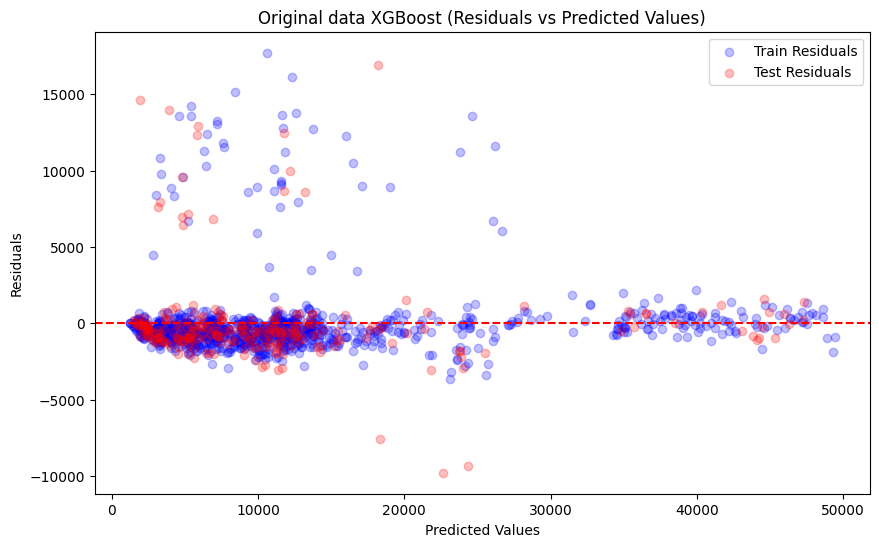

In [ ]:
# Calculate residuals for the training set
residuals_train_xg = y_train_cleaned - y_pred_train_cleaned_xg

# Calculate residuals for the test set
residuals_test_xg = y_test_cleaned - y_pred_test_cleaned_xg

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned_xg, residuals_train_xg, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned_xg, residuals_test_xg, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original data XGBoost (Residuals vs Predicted Values)')
plt.legend()
plt.show()


Quantile regression

In [ ]:
def quantile_regression(q, X_train, y_train, X_test, y_test, max_iter=10000):

    # Add constant to X for the intercept term in Quantile Regression
    X_train = sm.add_constant(X_train)
    X_test = sm.add_constant(X_test)

    # Fit the model with increased maximum iterations
    mod = sm.QuantReg(y_train, X_train)
    res = mod.fit(q=q, max_iter=max_iter)

    # Predict
    y_pred_train = res.predict(X_train)
    y_pred_test = res.predict(X_test)

    # Evaluate
    mse_train = mean_squared_error(y_train, y_pred_train)
    mse_test = mean_squared_error(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    print(f'Quantile {q} - Train MSE: {mse_train:.4f}, R2: {r2_train:.4f}')
    print(f'Quantile {q} - Test MSE: {mse_test:.4f}, R2: {r2_test:.4f}')

    return res, y_pred_train, y_pred_test

In [ ]:
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_quant, y_pred_test_quant = quantile_regression(q, X_train_wo, y_train_wo, X_test_wo, y_test_wo)
    results[q] = (res, y_pred_train_quant, y_pred_test_quant)

Quantile 0.25 - Train MSE: 67342331.5538, R2: 0.5334
Quantile 0.25 - Test MSE: 65145621.4106, R2: 0.5804
Quantile 0.5 - Train MSE: 49599370.6179, R2: 0.6564
Quantile 0.5 - Test MSE: 43265906.8409, R2: 0.7213
Quantile 0.75 - Train MSE: 54930146.4067, R2: 0.6194
Quantile 0.75 - Test MSE: 48150961.2787, R2: 0.6898


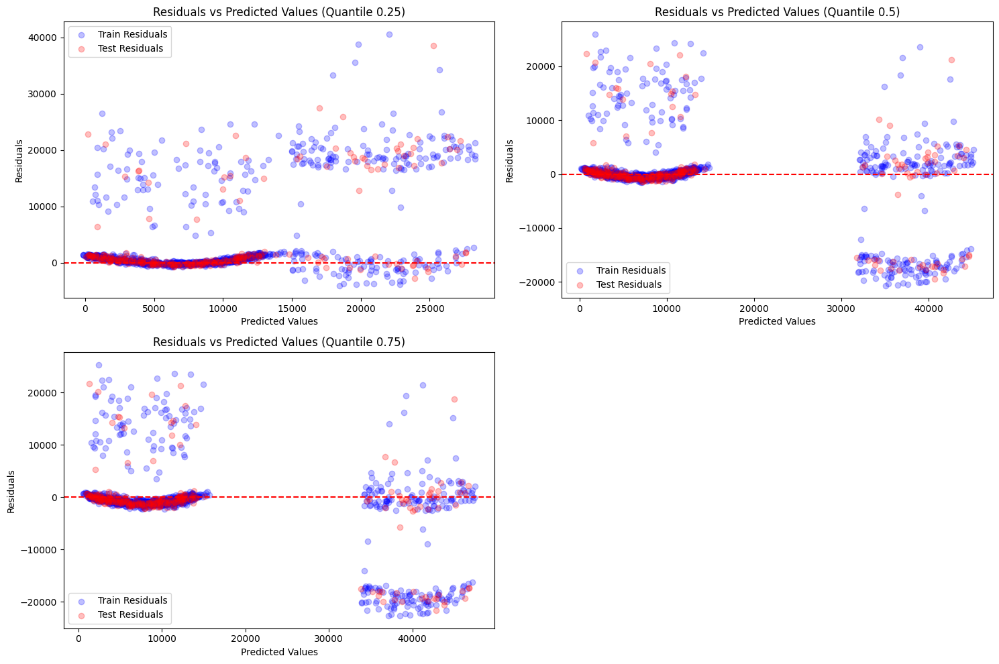

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_quant, y_pred_test_quant = results[q]

    # Calculate residuals for the training set
    residuals_train_quant = y_train_wo - y_pred_train_quant

    # Calculate residuals for the test set
    residuals_test_quant = y_test_wo - y_pred_test_quant

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_quant, residuals_train_quant, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_quant, residuals_test_quant, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


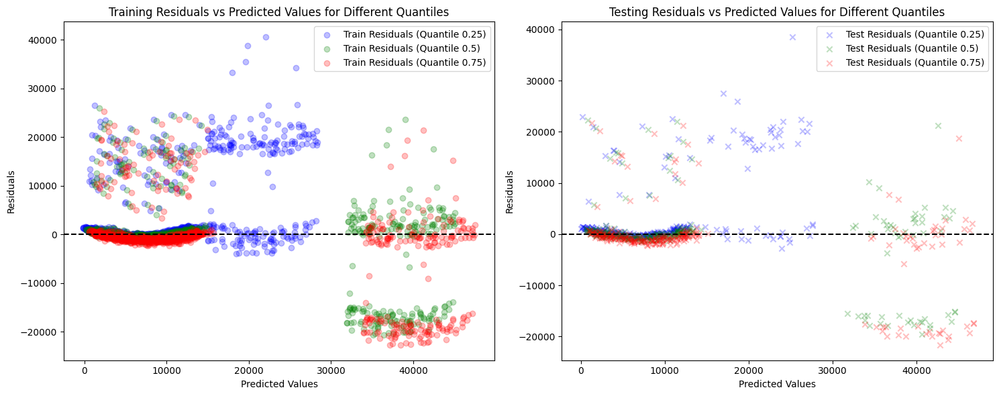

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_quant, y_pred_test_quant = results[q]

    # Calculate residuals for the training set
    residuals_train_quant = y_train_wo - y_pred_train_quant

    # Calculate residuals for the test set
    residuals_test_quant = y_test_wo - y_pred_test_quant

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_quant, residuals_train_quant, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_quant, residuals_test_quant, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

Quantile regressions after removing high leverage points and outliers greater than threshold line

In [ ]:
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_cq, y_pred_test_cq = quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_cq, y_pred_test_cq)

Quantile 0.25 - Train MSE: 48706369.3996, R2: 0.6343
Quantile 0.25 - Test MSE: 41478349.0790, R2: 0.6407
Quantile 0.5 - Train MSE: 36096755.7287, R2: 0.7290
Quantile 0.5 - Test MSE: 32479368.4660, R2: 0.7187
Quantile 0.75 - Train MSE: 42362211.8095, R2: 0.6819
Quantile 0.75 - Test MSE: 37374397.1436, R2: 0.6763


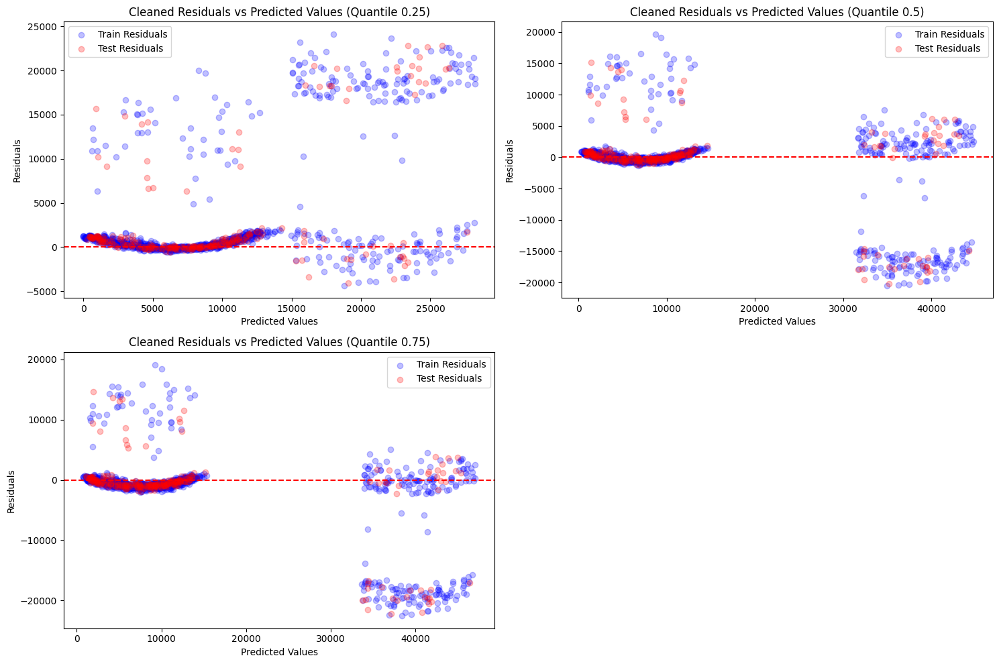

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq = y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_cq, residuals_train_cq, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_cq, residuals_test_cq, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Cleaned Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


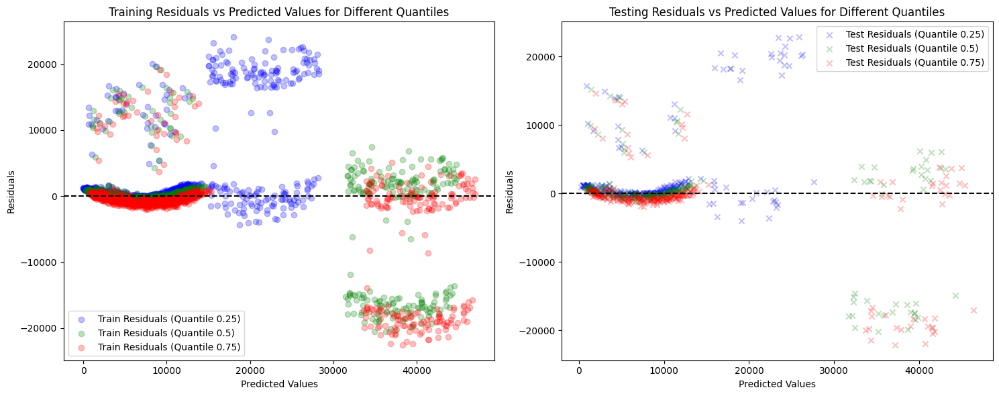

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq= y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_cq, residuals_train_cq, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_cq, residuals_test_cq, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

XGBoost on quantile regression

In [ ]:
# Define a function for the quantile loss
def quantile_loss(q, y_true, y_pred):
    e = y_true - y_pred
    return np.mean(np.maximum(q * e, (q - 1) * e))

# Define a function to fit and predict using XGBoost for quantile regression
def xgboost_quantile_regression(q, X_train, y_train, X_test, y_test):

    '''
    eta (learning rate): Controls the step size in optimization. A smaller value (e.g., 0.1) makes learning slower and helps prevent overfitting.

    max_depth: Sets the maximum depth of each tree. A value of 3 balances complexity and generalization.

    objective (reg:absoluteerror): Optimizes for mean absolute error (MAE), which is suitable for quantile regression as it focuses on predicting specific quantiles rather than the mean.

    alpha: Specifies the quantile to predict (e.g., 0.5 for the median). It adjusts the loss function to target underpredictions or overpredictions based on the quantile.
    '''


    dtrain = xgb.DMatrix(X_train, label=y_train)
    dtest = xgb.DMatrix(X_test, label=y_test)

    params = {
        'eta': 0.1,
        'max_depth': 3,
        'objective': 'reg:absoluteerror',
        'alpha': q
    }

    num_boost_round = 100
    model = xgb.train(params, dtrain, num_boost_round)

    y_pred_train = model.predict(dtrain)
    y_pred_test = model.predict(dtest)

    # Evaluate
    mse_train = mean_squared_error(y_train, y_pred_train)
    mse_test = mean_squared_error(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    print(f'Quantile {q} - Train MSE: {mse_train:.4f}, R2: {r2_train:.4f}')
    print(f'Quantile {q} - Test MSE: {mse_test:.4f}, R2: {r2_test:.4f}')

    return model, y_pred_train, y_pred_test



In [ ]:
# Perform XGBoost quantile regression for 0.25, 0.5, and 0.75 quantiles
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    model, y_pred_train_quant, y_pred_test_quant = xgboost_quantile_regression(q, X_train_wo, y_train_wo, X_test_wo, y_test_wo)
    results[q] = (model, y_pred_train_quant, y_pred_test_quant)


Quantile 0.25 - Train MSE: 24449565.3737, R2: 0.8306
Quantile 0.25 - Test MSE: 23468981.4794, R2: 0.8488
Quantile 0.5 - Train MSE: 25388001.0203, R2: 0.8241
Quantile 0.5 - Test MSE: 25111831.8577, R2: 0.8382
Quantile 0.75 - Train MSE: 26579582.1303, R2: 0.8158
Quantile 0.75 - Test MSE: 28049929.6557, R2: 0.8193


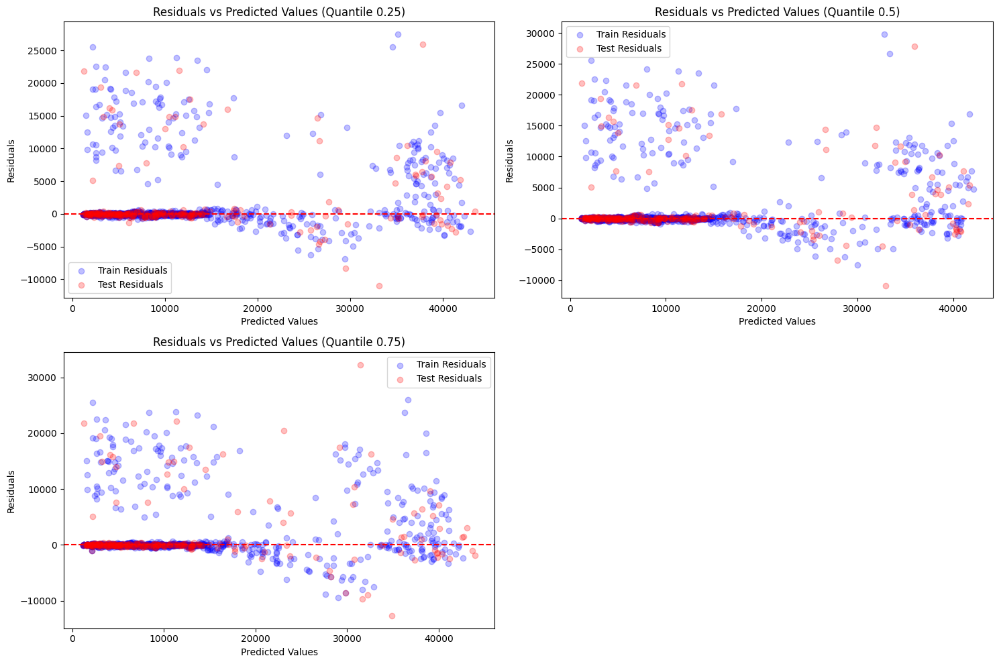

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_qxg, y_pred_test_qxg = results[q]

    # Calculate residuals for the training set
    residuals_train_qxg = y_train_wo - y_pred_train_qxg

    # Calculate residuals for the test set
    residuals_test_qxg = y_test_wo - y_pred_test_qxg

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_qxg, residuals_train_qxg, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_qxg, residuals_test_qxg, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


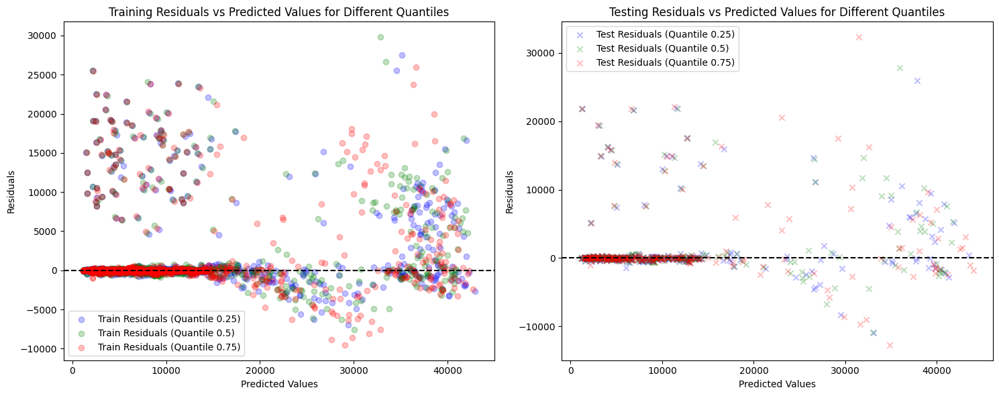

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_qxg, y_pred_test_qxg = results[q]

    # Calculate residuals for the training set
    residuals_train_qxg = y_train_wo - y_pred_train_qxg

    # Calculate residuals for the test set
    residuals_test_qxg = y_test_wo - y_pred_test_qxg

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_qxg, residuals_train_qxg, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_qxg, residuals_test_qxg, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

XGBoost Quantile regression after removing high leverage points and outliers

In [ ]:
# Perform XGBoost quantile regression for 0.25, 0.5, and 0.75 quantiles
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    model, y_pred_train_qxgc, y_pred_test_qxgc = xgboost_quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (model, y_pred_train_qxgc, y_pred_test_qxgc)


Quantile 0.25 - Train MSE: 15936249.9920, R2: 0.8803
Quantile 0.25 - Test MSE: 19151108.4958, R2: 0.8341
Quantile 0.5 - Train MSE: 17823549.3897, R2: 0.8662
Quantile 0.5 - Test MSE: 20328092.5829, R2: 0.8239
Quantile 0.75 - Train MSE: 16091820.1123, R2: 0.8792
Quantile 0.75 - Test MSE: 19142146.4965, R2: 0.8342


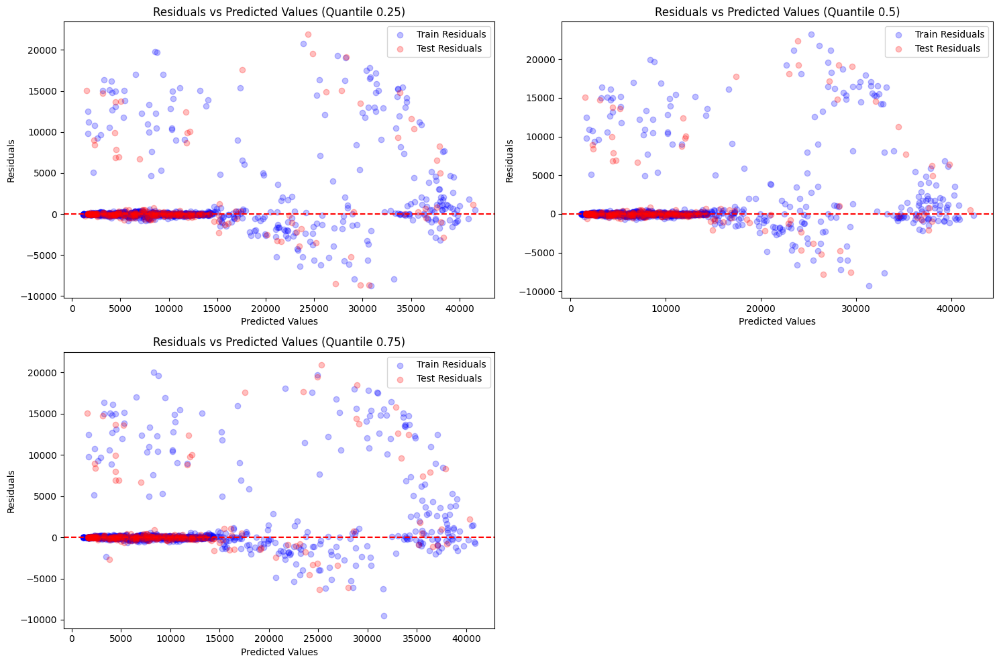

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_qxgc, y_pred_test_qxgc = results[q]

    # Calculate residuals for the training set
    residuals_train_qxgc = y_train_cleaned - y_pred_train_qxgc

    # Calculate residuals for the test set
    residuals_test_qxgc = y_test_cleaned - y_pred_test_qxgc

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_qxgc, residuals_train_qxgc, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_qxgc, residuals_test_qxgc, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


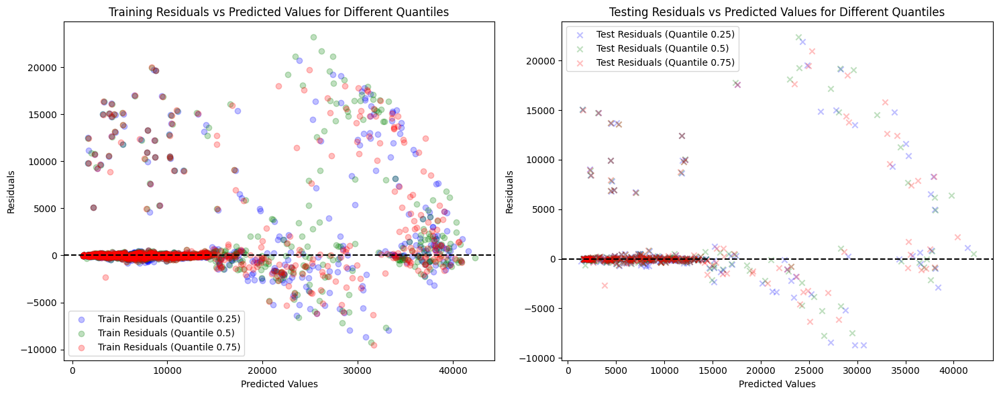

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_qxgc, y_pred_test_qxgc = results[q]

    # Calculate residuals for the training set
    residuals_train_qxgc = y_train_cleaned - y_pred_train_qxgc

    # Calculate residuals for the test set
    residuals_test_qxgc = y_test_cleaned - y_pred_test_qxgc

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_qxgc, residuals_train_qxgc, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_qxgc, residuals_test_qxgc, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

After Feature selection
Most significant features are:

1. Smoker

2. BMI

3. Age

Lets select only these feature and find outliers and high leverege points and again

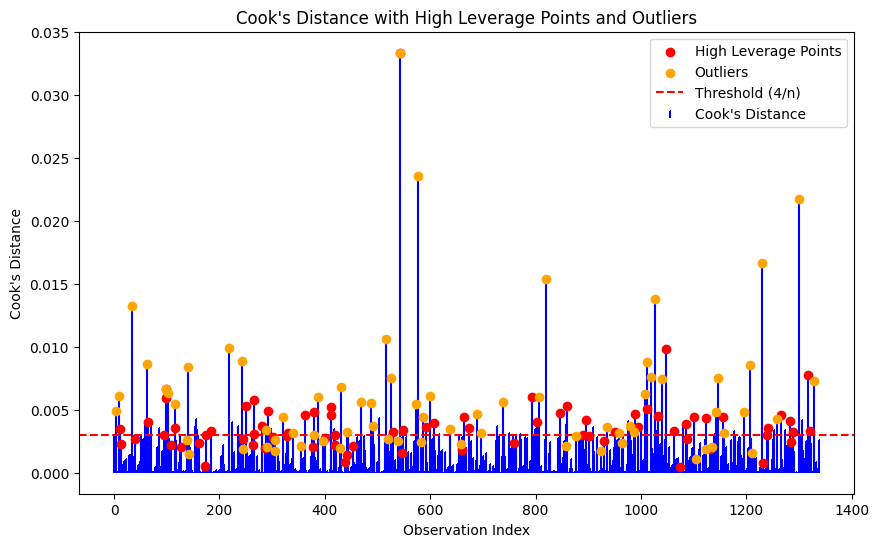

,Index,Leverage,Standardized Residuals,Cook's Distance
0,3,0.002284,2.920330,0.004880
1,9,0.003234,2.744077,0.006107
2,11,0.006364,-1.467441,0.003448
3,14,0.007068,1.130889,0.002276
4,34,0.004849,3.296929,0.013241
...,...,...,...,...
142,1288,0.006814,1.366333,0.003202
143,1300,0.003818,4.764565,0.021750
144,1317,0.013910,-1.483042,0.007756
145,1321,0.006276,-1.440710,0.003277


In [ ]:
target_column = 'charges'
selected_features = ['smoker', 'bmi', 'age']
X = data_numeric[selected_features]
y = data_numeric[target_column]

# Add a constant term for the intercept
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Calculate influence measures
influence = model.get_influence()

# Leverage (hat values)
leverage = influence.hat_matrix_diag

# Standardized residuals
standardized_residuals = influence.resid_studentized_internal

# Cook's distance
cooks_d = influence.cooks_distance[0]

# Identify high leverage points
high_leverage_threshold = 2 * (X.shape[1] / X.shape[0])  # Common threshold
high_leverage_points = np.where(leverage > high_leverage_threshold)[0]

# Identify outliers
outlier_threshold = 2  # Common threshold for standardized residuals
outliers = np.where(np.abs(standardized_residuals) > outlier_threshold)[0]

# Combine influential points, high leverage points, and outliers
combined_indices = np.unique(np.concatenate((high_leverage_points, outliers)))

# Plot Cook's distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d)), cooks_d, markerfmt=",", linefmt='b-', basefmt=' ', label='Cook\'s Distance')

# Highlight high leverage points
plt.scatter(high_leverage_points, cooks_d[high_leverage_points], color='red', label='High Leverage Points', zorder=3)

# Highlight outliers
plt.scatter(outliers, cooks_d[outliers], color='orange', label='Outliers', zorder=3)

plt.title("Cook's Distance with High Leverage Points and Outliers")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.axhline(y=4 / len(X), color='r', linestyle='--', label='Threshold (4/n)')
plt.legend()
plt.show()

# Display influential points summary
influential_points_summary = pd.DataFrame({
    'Index': combined_indices,
    'Leverage': leverage[combined_indices],
    'Standardized Residuals': standardized_residuals[combined_indices],
    'Cook\'s Distance': cooks_d[combined_indices]
})

influential_points_summary

Fitting linear regression model without removing these outliers and high levereage poings

Linear Regression (Train) - Original - Mean Squared Error: 37638069.1703, R2 Score: 0.7392
Linear Regression (Test) - Original - Mean Squared Error: 34512843.8802, R2 Score: 0.7777


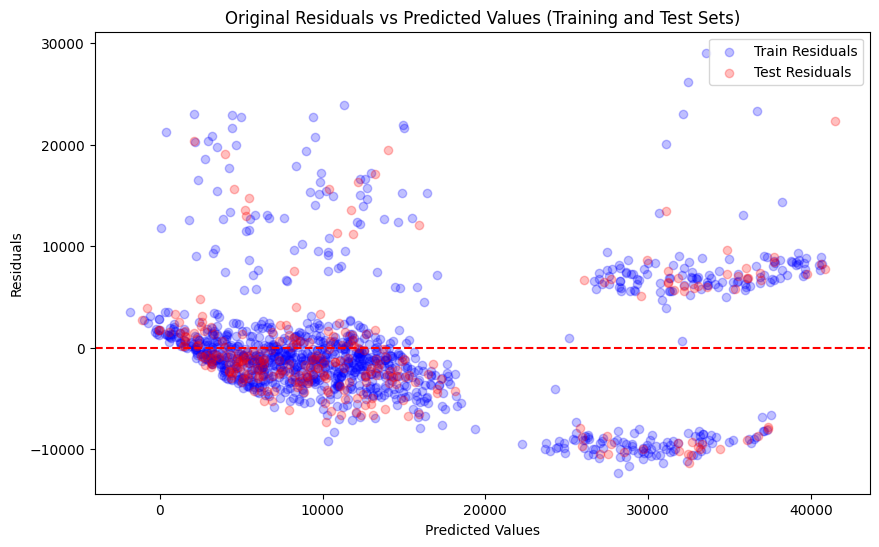

In [ ]:
target_column = 'charges'
selected_features = ['smoker', 'bmi', 'age']
X = data_numeric[selected_features]
y = data_numeric[target_column]

# Split the cleaned data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_wo = LinearRegression()
linear_reg_wo.fit(X_train_wo, y_train_wo)

# Predict and evaluate
y_pred_train_wo = linear_reg_wo.predict(X_train_wo)
y_pred_test_wo = linear_reg_wo.predict(X_test_wo)

# Define the evaluate_model function to calculate evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    from sklearn.metrics import mean_squared_error, r2_score
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_wo, y_pred_train_wo, "Linear Regression (Train) - Original")
evaluate_model(y_test_wo, y_pred_test_wo, "Linear Regression (Test) - Original")

# Calculate residuals for the training set
residuals_train_wo = y_train_wo - y_pred_train_wo

# Calculate residuals for the test set
residuals_test_wo = y_test_wo - y_pred_test_wo

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_wo, residuals_train_wo, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_wo, residuals_test_wo, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()

With XGBoost

In [ ]:
target_column = 'charges'
selected_features = ['smoker', 'bmi', 'age']
X = data_numeric[selected_features]
y = data_numeric[target_column]

# Split the Original data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg.fit(X_train, y_train)

# Predict
y_pred_train = xgb_reg.predict(X_train)
y_pred_test = xgb_reg.predict(X_test)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train, y_pred_train, "XGBoost Regression (Train)")
evaluate_model(y_test, y_pred_test, "XGBoost Regression (Test)")


XGBoost Regression (Train) - Mean Squared Error: 14854631.6129, R2 Score: 0.8976
XGBoost Regression (Test) - Mean Squared Error: 20214518.9089, R2 Score: 0.8660


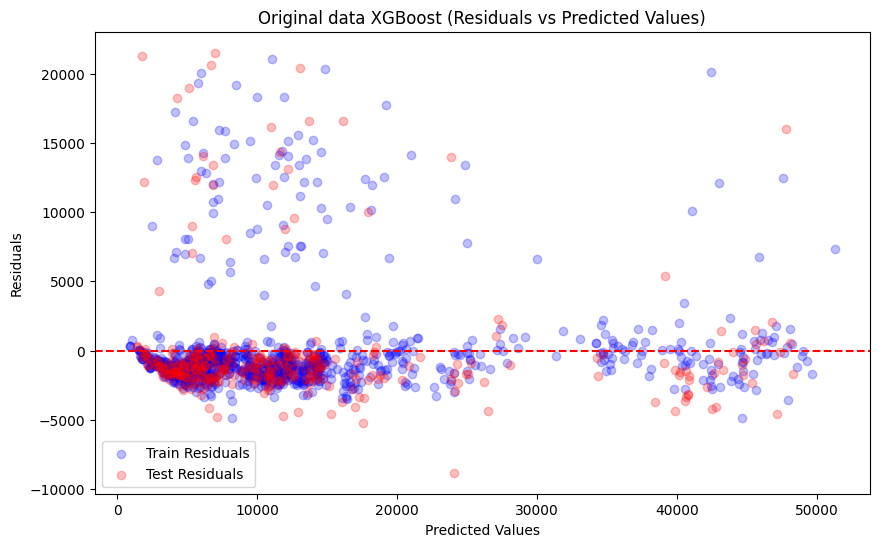

In [ ]:
# Calculate residuals for the training set
residuals_train = y_train - y_pred_train

# Calculate residuals for the test set
residuals_test = y_test - y_pred_test

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train, residuals_train, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test, residuals_test, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original data XGBoost (Residuals vs Predicted Values)')
plt.legend()
plt.show()


After removing high leverage points and outliers

In [ ]:
# Remove high leverage points and outliers from the dataset
data_cleaned = data_numeric.drop(index=combined_indices)

# Split the cleaned data into features and target
X_cleaned = data_cleaned[selected_features]
y_cleaned = data_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_cleaned = LinearRegression()
linear_reg_cleaned.fit(X_train_cleaned, y_train_cleaned)

# Predict and evaluate
y_pred_train_cleaned = linear_reg_cleaned.predict(X_train_cleaned)
y_pred_test_cleaned = linear_reg_cleaned.predict(X_test_cleaned)

# Define the evaluate_model function to calculate evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    from sklearn.metrics import mean_squared_error, r2_score
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_cleaned, y_pred_train_cleaned, "Linear Regression (Train) - Cleaned")
evaluate_model(y_test_cleaned, y_pred_test_cleaned, "Linear Regression (Test) - Cleaned")

Linear Regression (Train) - Cleaned - Mean Squared Error: 17223404.2413, R2 Score: 0.8326
Linear Regression (Test) - Cleaned - Mean Squared Error: 17390249.2428, R2 Score: 0.8706


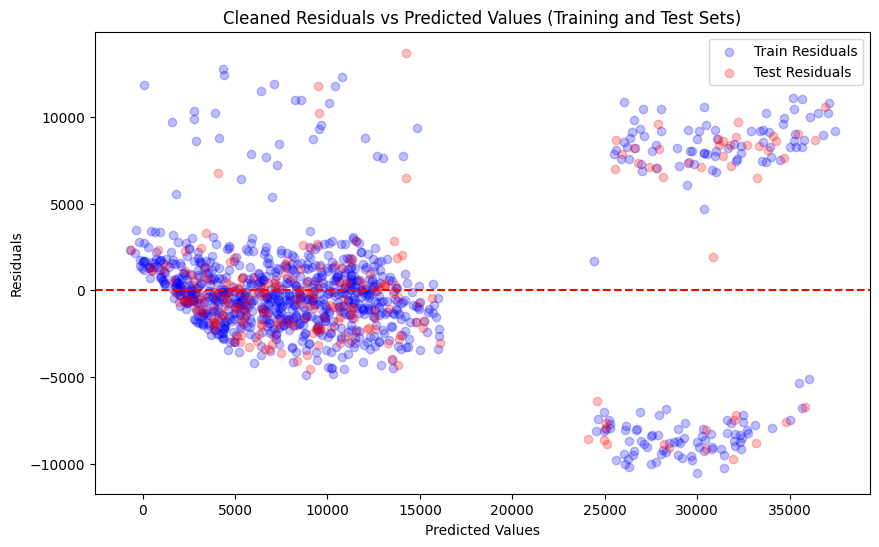

In [ ]:
# Calculate residuals for the training set
residuals_train_cleaned = y_train_cleaned - y_pred_train_cleaned

# Calculate residuals for the test set
residuals_test_cleaned = y_test_cleaned - y_pred_test_cleaned

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned, residuals_train_cleaned, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned, residuals_test_cleaned, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Cleaned Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()


XGBoost after removing high leverage points and outliers

In [ ]:
# Initialize the XGBRegressor
xgb_reg2 = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg2.fit(X_train_cleaned, y_train_cleaned)

# Predict
y_pred_train_cleaned_xg = xgb_reg2.predict(X_train_cleaned)
y_pred_test_cleaned_xg = xgb_reg2.predict(X_test_cleaned)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_cleaned, y_pred_train_cleaned_xg, "XGBoost Regression (Train)")
evaluate_model(y_test_cleaned, y_pred_test_cleaned_xg, "XGBoost Regression (Test)")

XGBoost Regression (Train) - Mean Squared Error: 4272318.2048, R2 Score: 0.9585
XGBoost Regression (Test) - Mean Squared Error: 4025027.4682, R2 Score: 0.9701


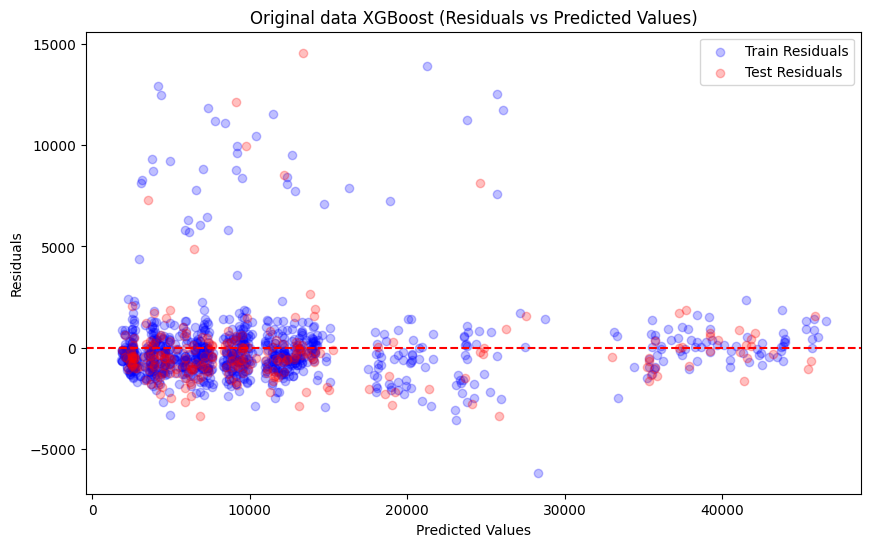

In [ ]:
# Calculate residuals for the training set
residuals_train_xg = y_train_cleaned - y_pred_train_cleaned_xg

# Calculate residuals for the test set
residuals_test_xg = y_test_cleaned - y_pred_test_cleaned_xg

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned_xg, residuals_train_xg, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned_xg, residuals_test_xg, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original data XGBoost (Residuals vs Predicted Values)')
plt.legend()
plt.show()


Quantile regression after feature selection

In [ ]:
target_column = 'charges'
selected_features = ['smoker', 'bmi', 'age']
X = data_numeric[selected_features]
y = data_numeric[target_column]

# Split the cleaned data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_quant, y_pred_test_quant = quantile_regression(q, X_train_wo, y_train_wo, X_test_wo, y_test_wo)
    results[q] = (res, y_pred_train_quant, y_pred_test_quant)

Quantile 0.25 - Train MSE: 67238592.9645, R2: 0.5341
Quantile 0.25 - Test MSE: 65279359.1635, R2: 0.5795
Quantile 0.5 - Train MSE: 49285618.5110, R2: 0.6585
Quantile 0.5 - Test MSE: 43900311.2510, R2: 0.7172
Quantile 0.75 - Train MSE: 54736221.3347, R2: 0.6208
Quantile 0.75 - Test MSE: 49053563.9458, R2: 0.6840


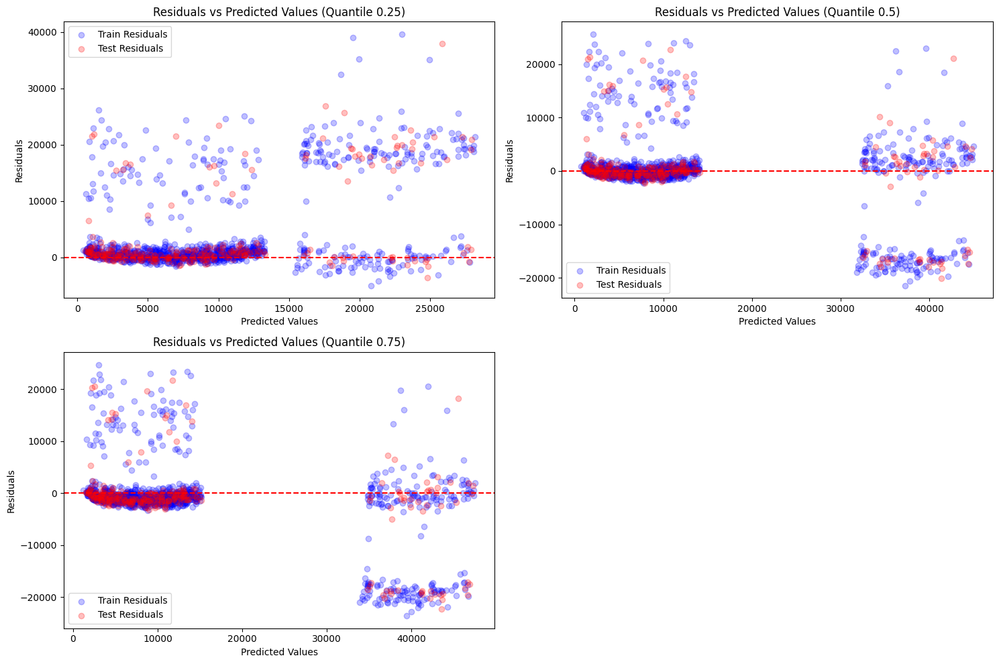

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_quant, y_pred_test_quant = results[q]

    # Calculate residuals for the training set
    residuals_train_quant = y_train_wo - y_pred_train_quant

    # Calculate residuals for the test set
    residuals_test_quant = y_test_wo - y_pred_test_quant

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_quant, residuals_train_quant, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_quant, residuals_test_quant, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


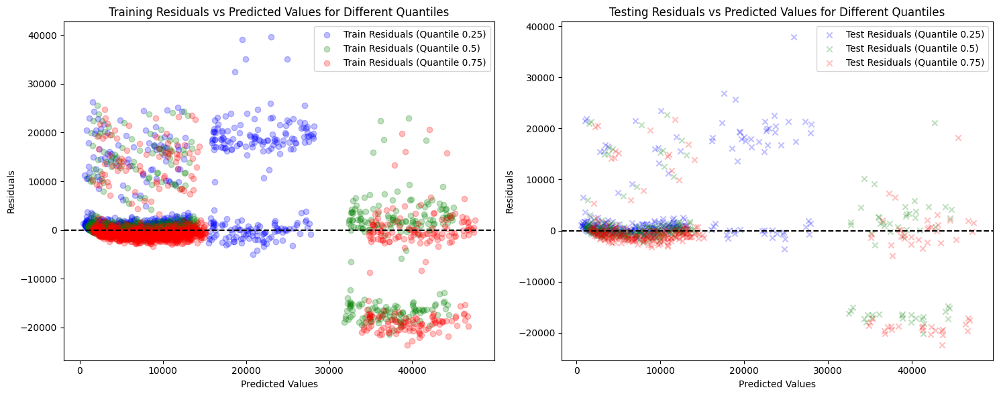

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_quant, y_pred_test_quant = results[q]

    # Calculate residuals for the training set
    residuals_train_quant = y_train_wo - y_pred_train_quant

    # Calculate residuals for the test set
    residuals_test_quant = y_test_wo - y_pred_test_quant

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_quant, residuals_train_quant, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_quant, residuals_test_quant, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

XGBoost Quantile regression after feature selection

In [ ]:
# Perform XGBoost quantile regression for 0.25, 0.5, and 0.75 quantiles
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    model, y_pred_train_quant, y_pred_test_quant = xgboost_quantile_regression(q, X_train_wo, y_train_wo, X_test_wo, y_test_wo)
    results[q] = (model, y_pred_train_quant, y_pred_test_quant)


Quantile 0.25 - Train MSE: 22121068.3138, R2: 0.8467
Quantile 0.25 - Test MSE: 21090354.7442, R2: 0.8642
Quantile 0.5 - Train MSE: 21889866.1398, R2: 0.8483
Quantile 0.5 - Test MSE: 21122081.6132, R2: 0.8639
Quantile 0.75 - Train MSE: 21961609.7667, R2: 0.8478
Quantile 0.75 - Test MSE: 21659843.4360, R2: 0.8605


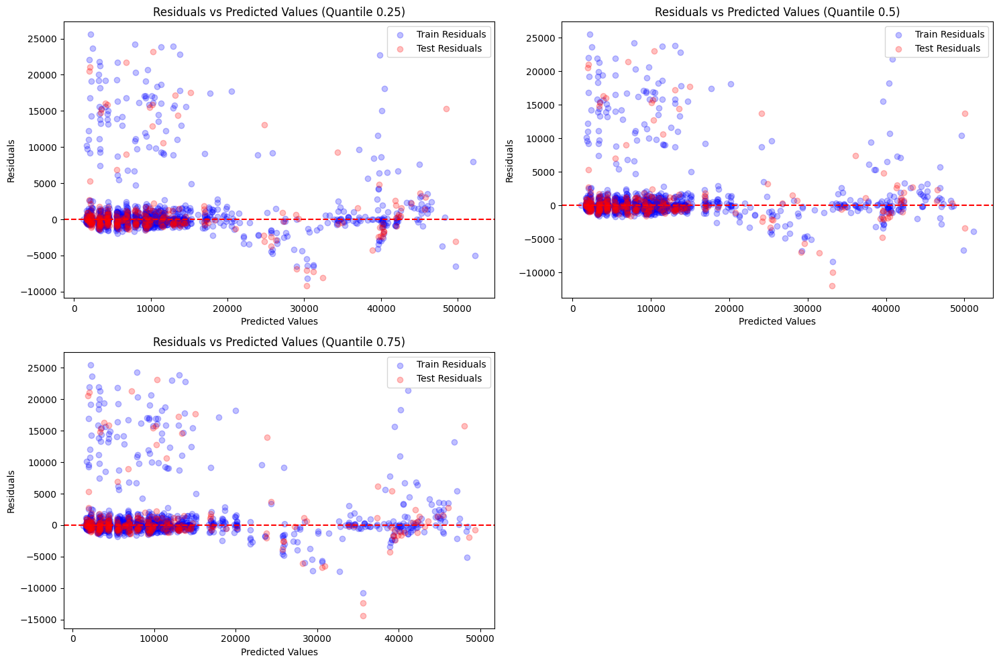

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_qxg, y_pred_test_qxg = results[q]

    # Calculate residuals for the training set
    residuals_train_qxg = y_train_wo - y_pred_train_qxg

    # Calculate residuals for the test set
    residuals_test_qxg = y_test_wo - y_pred_test_qxg

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_qxg, residuals_train_qxg, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_qxg, residuals_test_qxg, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


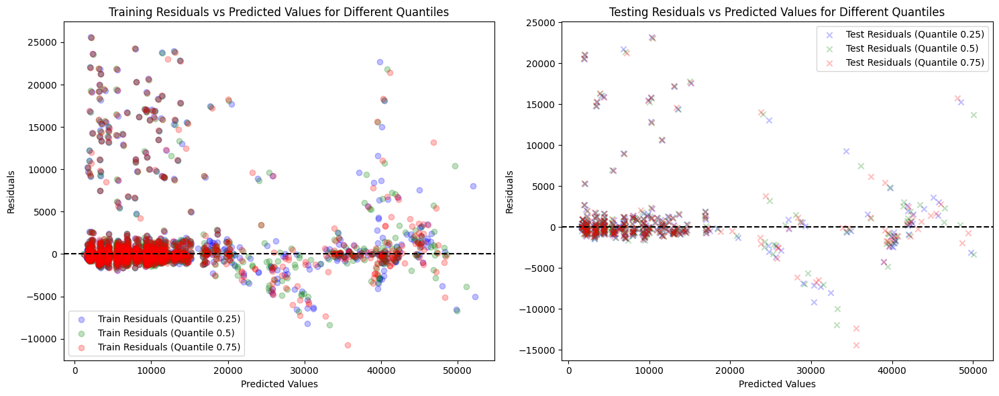

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_qxg, y_pred_test_qxg = results[q]

    # Calculate residuals for the training set
    residuals_train_qxg = y_train_wo - y_pred_train_qxg

    # Calculate residuals for the test set
    residuals_test_qxg = y_test_wo - y_pred_test_qxg

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_qxg, residuals_train_qxg, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_qxg, residuals_test_qxg, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

Quantile regression after feature selection and removing high leverage points, and outliers

Quantile 0.25 - Train MSE: 33384639.7899, R2: 0.6755
Quantile 0.25 - Test MSE: 45526883.8233, R2: 0.6613


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (10000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +


Quantile 0.5 - Train MSE: 18880521.2374, R2: 0.8165
Quantile 0.5 - Test MSE: 18599118.2671, R2: 0.8616
Quantile 0.75 - Train MSE: 32648197.9749, R2: 0.6827
Quantile 0.75 - Test MSE: 25483532.5150, R2: 0.8104


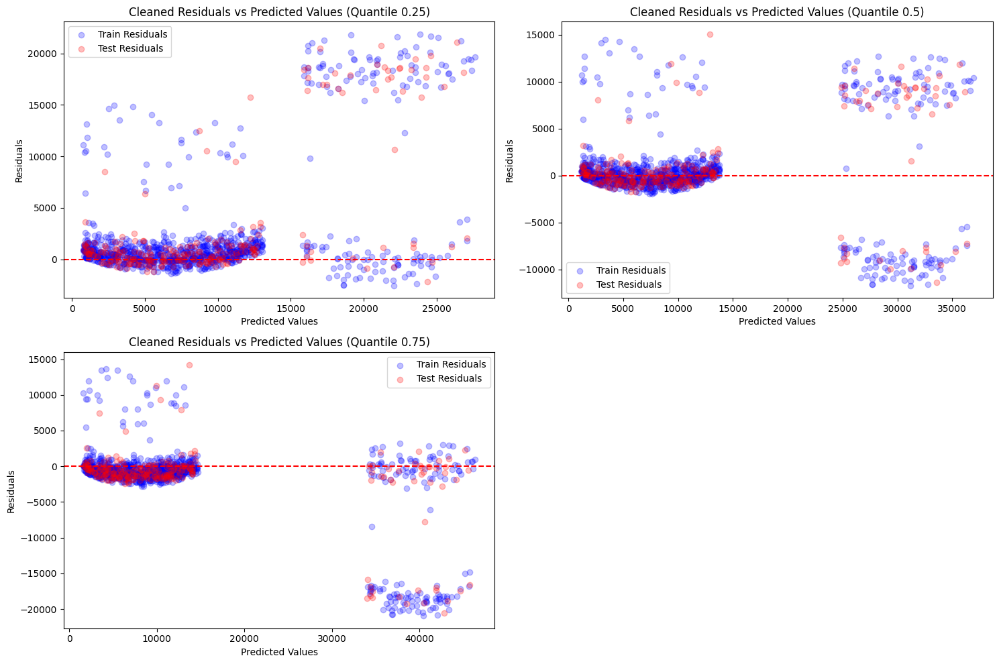

In [ ]:
# Remove high leverage points and outliers from the dataset
data_cleaned = data_numeric.drop(index=combined_indices)

# Split the cleaned data into features and target
X_cleaned = data_cleaned[selected_features]
y_cleaned = data_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)


quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_cq, y_pred_test_cq = quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_cq, y_pred_test_cq)

plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq = y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_cq, residuals_train_cq, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_cq, residuals_test_cq, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Cleaned Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


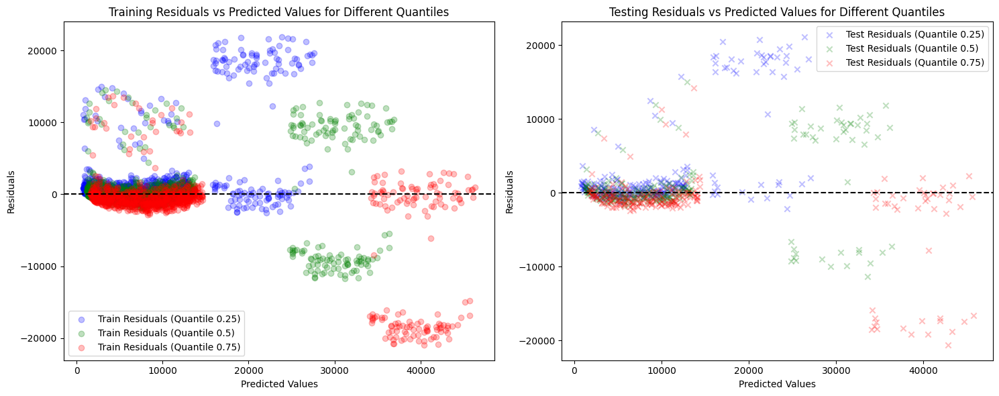

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq= y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_cq, residuals_train_cq, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_cq, residuals_test_cq, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

XGBoost Quantile regression after feature selection and removing high leverage points, and outliers

In [ ]:
# Perform XGBoost quantile regression for 0.25, 0.5, and 0.75 quantiles
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    model, y_pred_train_qxgc, y_pred_test_qxgc = xgboost_quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (model, y_pred_train_qxgc, y_pred_test_qxgc)


Quantile 0.25 - Train MSE: 7283892.2628, R2: 0.9292
Quantile 0.25 - Test MSE: 6189905.8884, R2: 0.9540
Quantile 0.5 - Train MSE: 6506688.3092, R2: 0.9368
Quantile 0.5 - Test MSE: 5227699.1840, R2: 0.9611
Quantile 0.75 - Train MSE: 6572648.4739, R2: 0.9361
Quantile 0.75 - Test MSE: 5210260.0338, R2: 0.9612


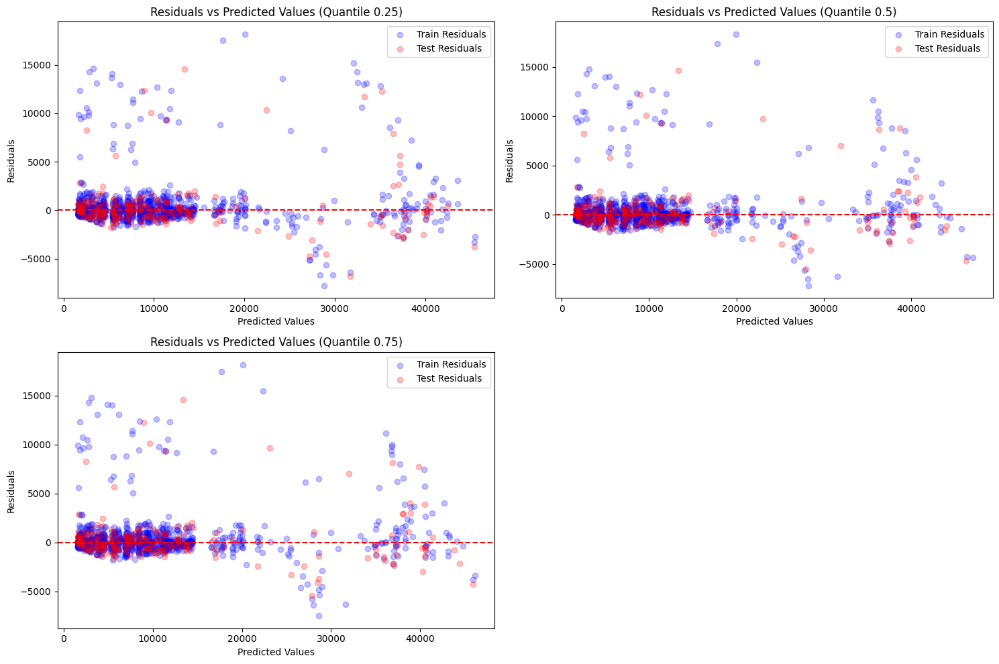

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_qxgc, y_pred_test_qxgc = results[q]

    # Calculate residuals for the training set
    residuals_train_qxgc = y_train_cleaned - y_pred_train_qxgc

    # Calculate residuals for the test set
    residuals_test_qxgc = y_test_cleaned - y_pred_test_qxgc

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_qxgc, residuals_train_qxgc, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_qxgc, residuals_test_qxgc, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


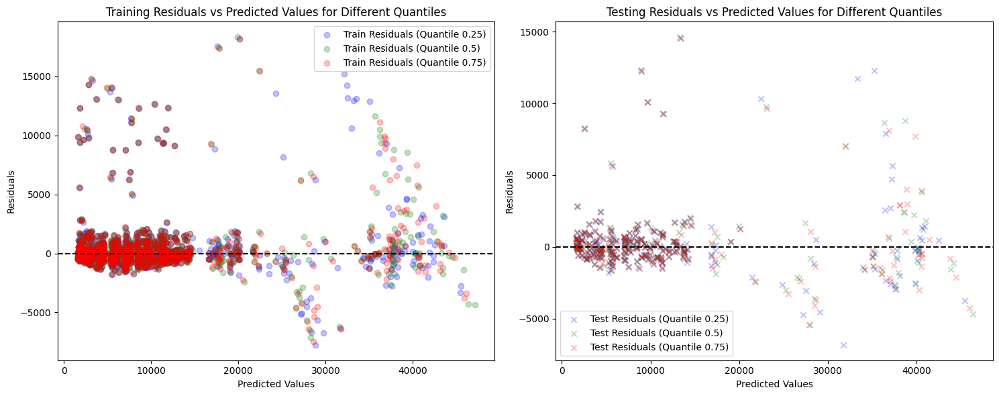

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_qxgc, y_pred_test_qxgc = results[q]

    # Calculate residuals for the training set
    residuals_train_qxgc = y_train_cleaned - y_pred_train_qxgc

    # Calculate residuals for the test set
    residuals_test_qxgc = y_test_cleaned - y_pred_test_qxgc

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_qxgc, residuals_train_qxgc, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_qxgc, residuals_test_qxgc, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

Doing same on Log prices after feature selection

In [ ]:
data_log_fs = pd.concat([data_numeric[selected_features], data_log[['charges', 'log_charges']]], axis=1)
data_log_fs.head()

,smoker,bmi,age,charges,log_charges
0,1,27.900,19,16884.92400,9.734176
1,0,33.770,18,1725.55230,7.453302
2,0,33.000,28,4449.46200,8.400538
3,0,22.705,33,21984.47061,9.998092
4,0,28.880,32,3866.85520,8.260197


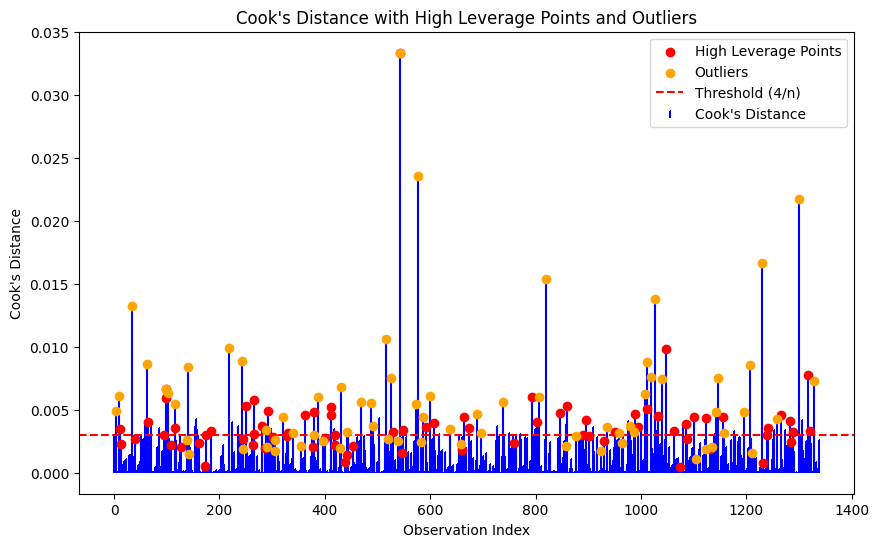

    Index  Leverage  Standardized Residuals  Cook's Distance
0       3  0.002284                2.920330         0.004880
1       9  0.003234                2.744077         0.006107
2      11  0.006364               -1.467441         0.003448
3      34  0.004849                3.296929         0.013241
4      62  0.004269                2.839770         0.008644
..    ...       ...                     ...              ...
90   1288  0.006814                1.366333         0.003202
91   1300  0.003818                4.764565         0.021750
92   1317  0.013910               -1.483042         0.007756
93   1321  0.006276               -1.440710         0.003277
94   1328  0.002607                3.334384         0.007266

[95 rows x 4 columns]


In [ ]:

target_column = 'charges'
X = data_log_fs.drop(columns=[target_column, 'log_charges'])
y = data_log_fs[target_column]

# Add a constant term for the intercept
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Calculate influence measures
influence = model.get_influence()

# Leverage (hat values)
leverage = influence.hat_matrix_diag

# Standardized residuals
standardized_residuals = influence.resid_studentized_internal

# Cook's distance
cooks_d = influence.cooks_distance[0]

# Identify high leverage points
high_leverage_threshold = 2 * (X.shape[1] / X.shape[0])  # Common threshold
high_leverage_points = np.where(leverage > high_leverage_threshold)[0]

# Identify outliers
outlier_threshold = 2  # Common threshold for standardized residuals
outliers = np.where(np.abs(standardized_residuals) > outlier_threshold)[0]

# Identify points with high Cook's distance
cooks_d_threshold = 4 / len(X)
high_cooks_d_points = np.where(cooks_d > cooks_d_threshold)[0]

# Combine influential points that are also high leverage points or outliers above Cook's distance threshold
combined_indices = np.unique(np.concatenate((
    np.intersect1d(high_leverage_points, high_cooks_d_points),
    np.intersect1d(outliers, high_cooks_d_points)
)))

# Plot Cook's distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d)), cooks_d, markerfmt=",", linefmt='b-', basefmt=' ', label='Cook\'s Distance')

# Highlight high leverage points
plt.scatter(high_leverage_points, cooks_d[high_leverage_points], color='red', label='High Leverage Points', zorder=3)

# Highlight outliers
plt.scatter(outliers, cooks_d[outliers], color='orange', label='Outliers', zorder=3)

plt.title("Cook's Distance with High Leverage Points and Outliers")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.axhline(y=cooks_d_threshold, color='r', linestyle='--', label='Threshold (4/n)')
plt.legend()
plt.show()

# Display influential points summary
influential_points_summary = pd.DataFrame({
    'Index': combined_indices,
    'Leverage': leverage[combined_indices],
    'Standardized Residuals': standardized_residuals[combined_indices],
    'Cook\'s Distance': cooks_d[combined_indices]
})

# Print influential points summary
print(influential_points_summary)


Analysing high leverage points and outliers

Summary Statistics for High Leverage Points and Outliers:
             age        sex        bmi   children     smoker     region  \
count  95.000000  95.000000  95.000000  95.000000  95.000000  95.000000   
mean   39.968421   0.463158  31.064579   1.189474   0.547368   1.315789   
std    15.985667   0.501286   9.323848   1.141991   0.500392   1.064546   
min    18.000000   0.000000  17.195000   0.000000   0.000000   0.000000   
25%    24.000000   0.000000  23.195000   0.000000   0.000000   0.000000   
50%    40.000000   0.000000  29.735000   1.000000   1.000000   1.000000   
75%    54.500000   1.000000  37.707500   2.000000   1.000000   2.000000   
max    64.000000   1.000000  53.130000   5.000000   1.000000   3.000000   

            charges  
count     95.000000  
mean   30387.867943  
std    13645.261467  
min     1163.462700  
25%    21270.332350  
50%    27375.904780  
75%    41508.217550  
max    63770.428010  

Summary Statistics for the Rest of the Dataset:
               age 

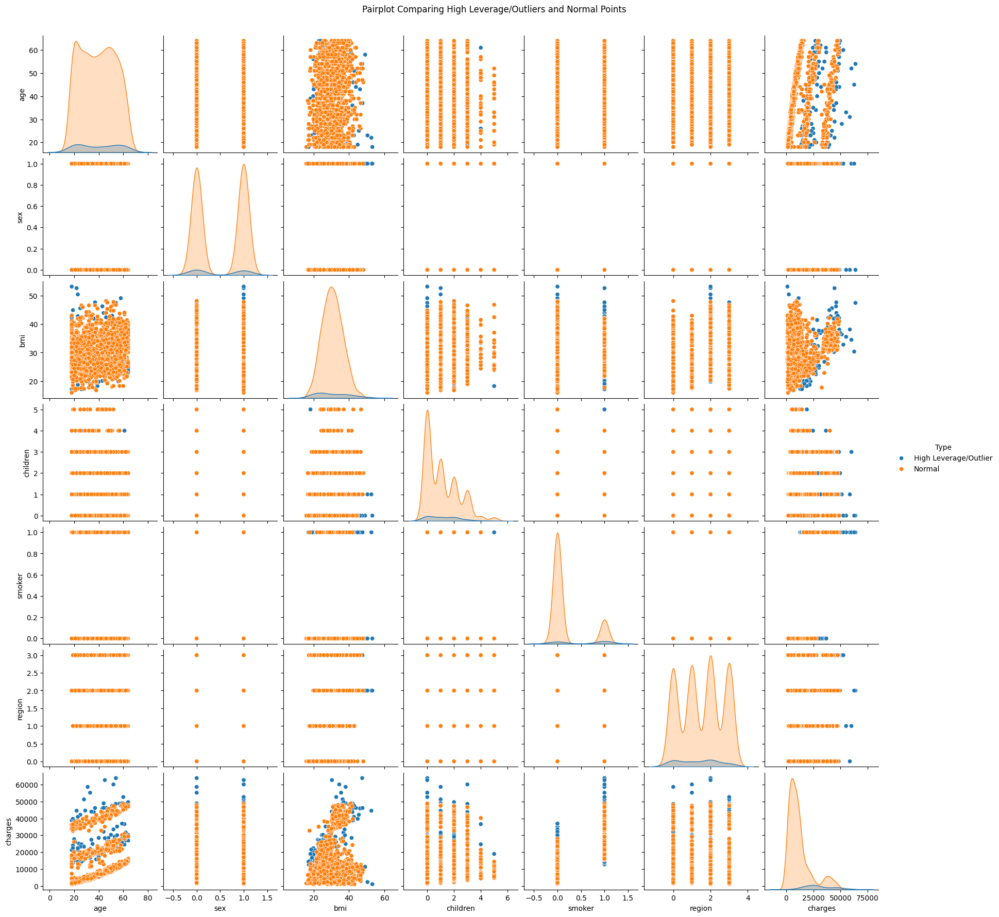

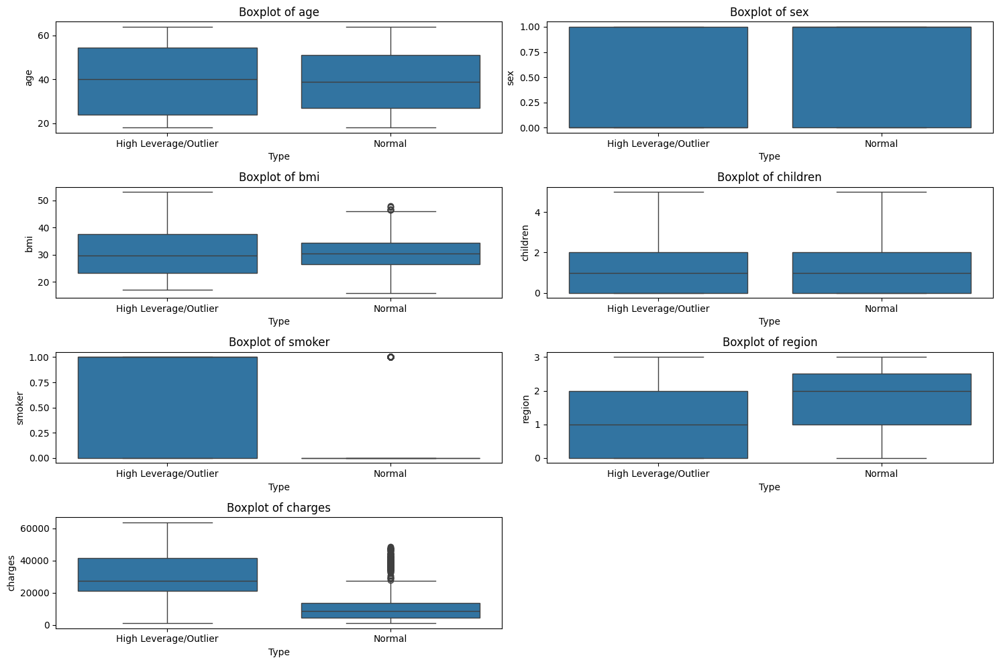

In [ ]:
# Extract high leverage points and outliers from the original dataset
high_leverage_outliers = data_numeric.loc[combined_indices]

# Compare high leverage points and outliers to the rest of the dataset
non_high_leverage_outliers = data_numeric.drop(index=combined_indices)

# Summary statistics for high leverage points and outliers
high_leverage_outliers_summary = high_leverage_outliers.describe()

# Summary statistics for the rest of the dataset
non_high_leverage_outliers_summary = non_high_leverage_outliers.describe()

# Display the summaries
print("Summary Statistics for High Leverage Points and Outliers:")
print(high_leverage_outliers_summary)
print("\nSummary Statistics for the Rest of the Dataset:")
print(non_high_leverage_outliers_summary)

# Visualize the high leverage points and outliers in the context of the dataset
# Pairplot can help to see the distribution and relationships between variables

# Combine the datasets with a new column to indicate if they are outliers/high leverage
high_leverage_outliers['Type'] = 'High Leverage/Outlier'
non_high_leverage_outliers['Type'] = 'Normal'

combined_data = pd.concat([high_leverage_outliers, non_high_leverage_outliers])

# Create pairplot
sns.pairplot(combined_data, hue='Type', diag_kind='kde')
plt.suptitle("Pairplot Comparing High Leverage/Outliers and Normal Points", y=1.02)
plt.show()

# Visualize distribution of each variable with boxplots
plt.figure(figsize=(15, 10))
for i, column in enumerate(data_numeric.columns):
    plt.subplot(len(data_numeric.columns) // 2 + 1, 2, i + 1)
    sns.boxplot(x='Type', y=column, data=combined_data)
    plt.title(f'Boxplot of {column}')
plt.tight_layout()
plt.show()

Linear Regression on log data

In [ ]:
target_column = 'charges'
X = data_log_fs.drop(columns=[target_column, 'log_charges'])
y = data_log_fs[target_column]

# Split the Original data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Add a constant term for the intercept
X_train_wo = sm.add_constant(X_train_wo)

# Fit the model
linear_reg_cleaned = LinearRegression()
linear_reg_cleaned.fit(X_train_wo, y_train_wo)

# Predict on training and testing sets
y_pred_train_wo = linear_reg_cleaned.predict(X_train_wo)
y_pred_test_wo = linear_reg_cleaned.predict(sm.add_constant(X_test_wo))

# Evaluate the model using the actual target values
evaluate_model(y_train_wo, y_pred_train_wo, "Linear Regression (Train) -")
evaluate_model(y_test_wo, y_pred_test_wo, "Linear Regression (Test) -")

Linear Regression (Train) - - Mean Squared Error: 37638069.1703, R2 Score: 0.7392
Linear Regression (Test) - - Mean Squared Error: 34512843.8802, R2 Score: 0.7777


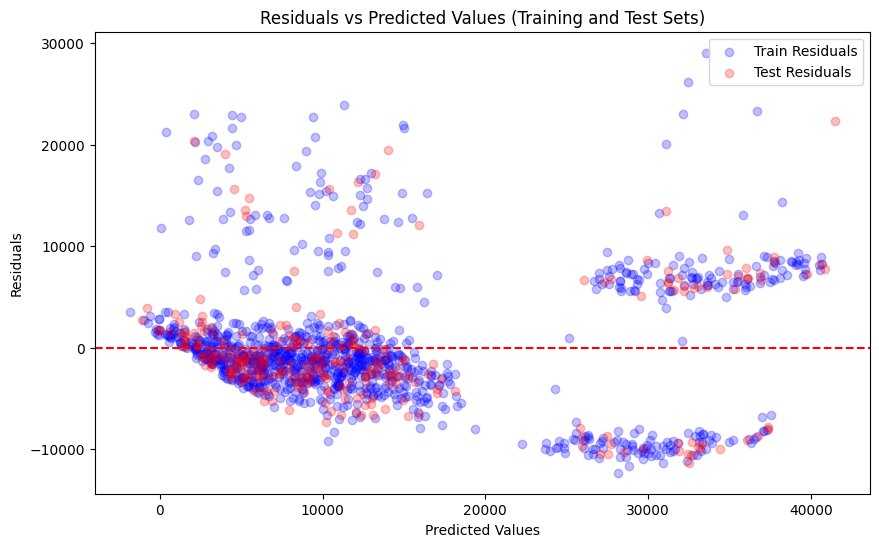

In [ ]:
# Calculate residuals for the training set
residuals_train_wo = y_train_wo - y_pred_train_wo

# Calculate residuals for the test set
residuals_test_wo = y_test_wo - y_pred_test_wo

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_wo, residuals_train_wo, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_wo, residuals_test_wo, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()


XGBoost Linear regression on log data

In [ ]:
target_column = 'charges'
X = data_log_fs.drop(columns=[target_column, 'log_charges'])
y = data_log_fs[target_column]

# Split the Original data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Add a constant term for the intercept
X_train_wo = sm.add_constant(X_train_wo)
X_test_wo = sm.add_constant(X_test_wo)

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg.fit(X_train_wo, y_train_wo)

# Predict
y_pred_train_wo = xgb_reg.predict(X_train_wo)
y_pred_test_wo = xgb_reg.predict(X_test_wo)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_wo, y_pred_train_wo, "XGBoost Regression (Train)")
evaluate_model(y_test_wo, y_pred_test_wo, "XGBoost Regression (Test)")


XGBoost Regression (Train) - Mean Squared Error: 16796711.6118, R2 Score: 0.8836
XGBoost Regression (Test) - Mean Squared Error: 19263812.5581, R2 Score: 0.8759


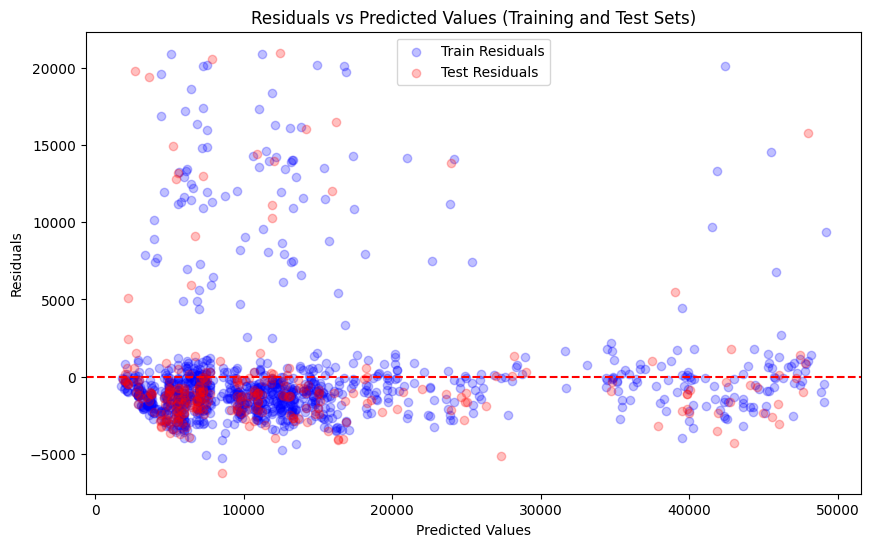

In [ ]:
# Calculate residuals for the training set
residuals_train_wo = y_train_wo - y_pred_train_wo

# Calculate residuals for the test set
residuals_test_wo = y_test_wo - y_pred_test_wo

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_wo, residuals_train_wo, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_wo, residuals_test_wo, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()


In [ ]:
# Remove outliers and high leverage points above the Cook's distance threshold
data_log_fs_cleaned = data_log_fs.drop(index=combined_indices)

# reset the index of the cleaned DataFrame
data_log_fs_cleaned = data_log_fs_cleaned.reset_index(drop=True)

data_log_fs_cleaned.head()

,smoker,bmi,age,charges,log_charges
0,1,27.90,19,16884.9240,9.734176
1,0,33.77,18,1725.5523,7.453302
2,0,33.00,28,4449.4620,8.400538
3,0,28.88,32,3866.8552,8.260197
4,0,25.74,31,3756.6216,8.231275


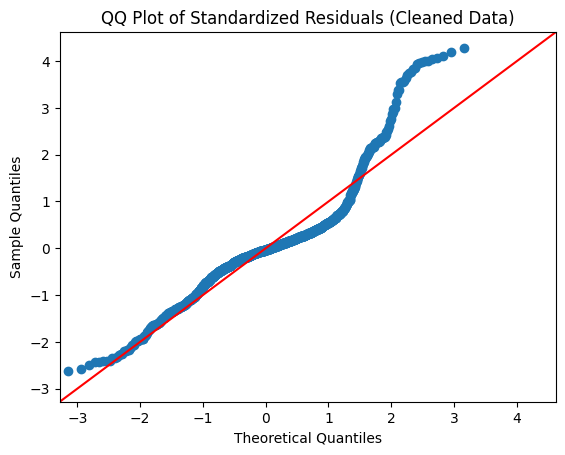

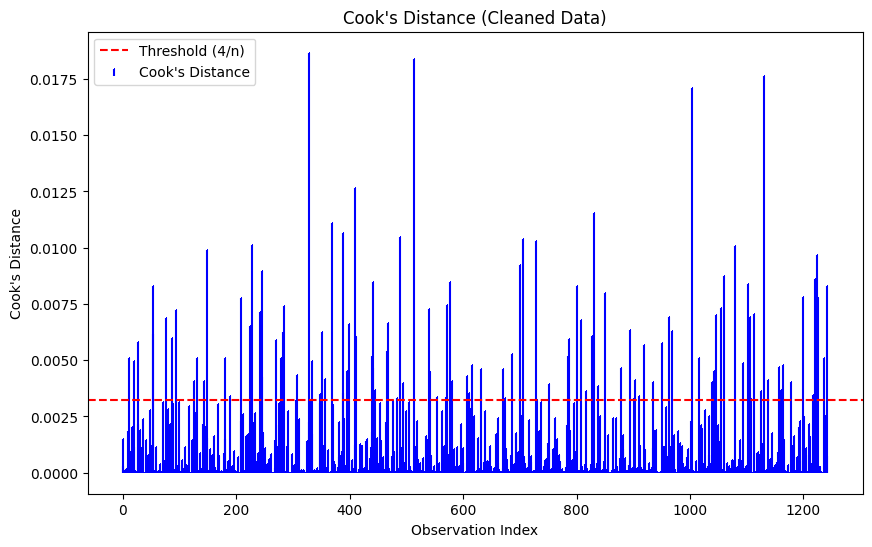

In [ ]:
# 'data_log_fs_cleaned' is cleaned DataFrame and 'target_column' is still 'charges'
target_column = 'log_charges'
X_cleaned = data_log_fs_cleaned.drop(columns=[target_column, 'charges'])
y_cleaned = data_log_fs_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Fit the model on the cleaned data
model_cleaned = sm.OLS(y_cleaned, X_cleaned).fit()

# Calculate influence measures
influence_cleaned = model_cleaned.get_influence()

# Standardized residuals for QQ plot
standardized_residuals_cleaned = influence_cleaned.resid_studentized_internal

# Cook's distance for Cook's distance plot
cooks_d_cleaned = influence_cleaned.cooks_distance[0]

# Plot QQ plot
sm.qqplot(standardized_residuals_cleaned, line='45')
plt.title("QQ Plot of Standardized Residuals (Cleaned Data)")
plt.show()

# Plot Cook's distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d_cleaned)), cooks_d_cleaned, markerfmt=",", linefmt='b-', basefmt=' ', label='Cook\'s Distance')
plt.title("Cook's Distance (Cleaned Data)")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.axhline(y=4 / len(X_cleaned), color='r', linestyle='--', label='Threshold (4/n)')
plt.legend()
plt.show()

Linear Regression

In [ ]:
target_column = 'log_charges'
X_cleaned = data_log_fs_cleaned.drop(columns=[target_column, 'charges'])
y_cleaned = data_log_fs_cleaned[target_column]
# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_cleaned = LinearRegression()
linear_reg_cleaned.fit(X_train_cleaned, y_train_cleaned)

# Predict and evaluate
y_pred_train_cleaned = linear_reg_cleaned.predict(X_train_cleaned)
y_pred_test_cleaned = linear_reg_cleaned.predict(X_test_cleaned)

evaluate_model(y_train_cleaned, y_pred_train_cleaned, "Linear Regression (Train) - Cleaned")
evaluate_model(y_test_cleaned, y_pred_test_cleaned, "Linear Regression (Test) - Cleaned")

Linear Regression (Train) - Cleaned - Mean Squared Error: 0.1505, R2 Score: 0.8076
Linear Regression (Test) - Cleaned - Mean Squared Error: 0.1503, R2 Score: 0.8107


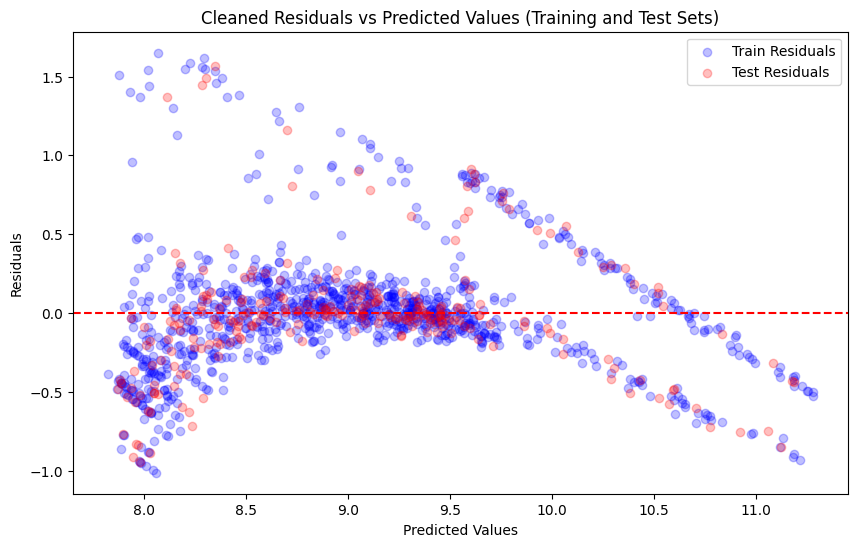

In [ ]:
# Calculate residuals for the training set
residuals_train_cleaned = y_train_cleaned - y_pred_train_cleaned

# Calculate residuals for the test set
residuals_test_cleaned = y_test_cleaned - y_pred_test_cleaned

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned, residuals_train_cleaned, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned, residuals_test_cleaned, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Cleaned Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()


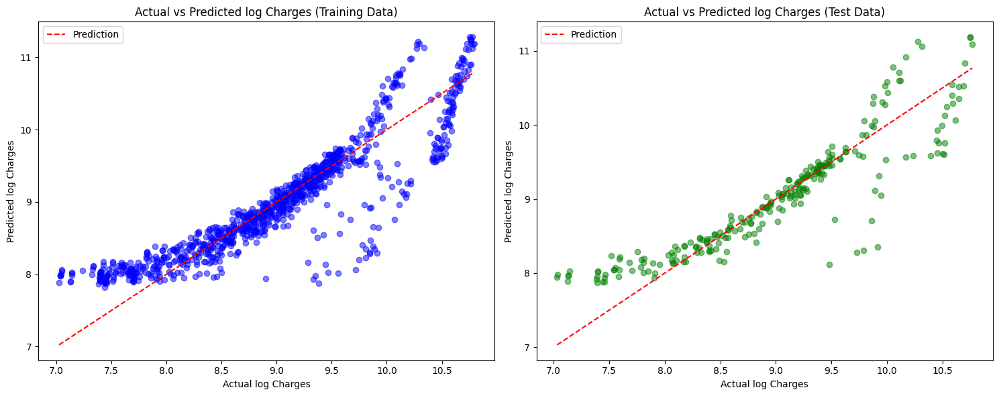

In [ ]:
# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot for the training set
axes[0].scatter(y_train_cleaned, y_pred_train_cleaned, color='blue', alpha=0.5)
axes[0].plot([y_train_cleaned.min(), y_train_cleaned.max()],
             [y_train_cleaned.min(), y_train_cleaned.max()],
             '--', color='red', label='Prediction')
axes[0].set_xlabel('Actual log Charges')
axes[0].set_ylabel('Predicted log Charges')
axes[0].set_title('Actual vs Predicted log Charges (Training Data)')
axes[0].legend()

# Plot for the test set
axes[1].scatter(y_test_cleaned, y_pred_test_cleaned, color='green', alpha=0.5)
axes[1].plot([y_test_cleaned.min(), y_test_cleaned.max()],
             [y_test_cleaned.min(), y_test_cleaned.max()],
             '--', color='red', label='Prediction')
axes[1].set_xlabel('Actual log Charges')
axes[1].set_ylabel('Predicted log Charges')
axes[1].set_title('Actual vs Predicted log Charges (Test Data)')
axes[1].legend()

# Adjust layout
plt.tight_layout()
plt.show()


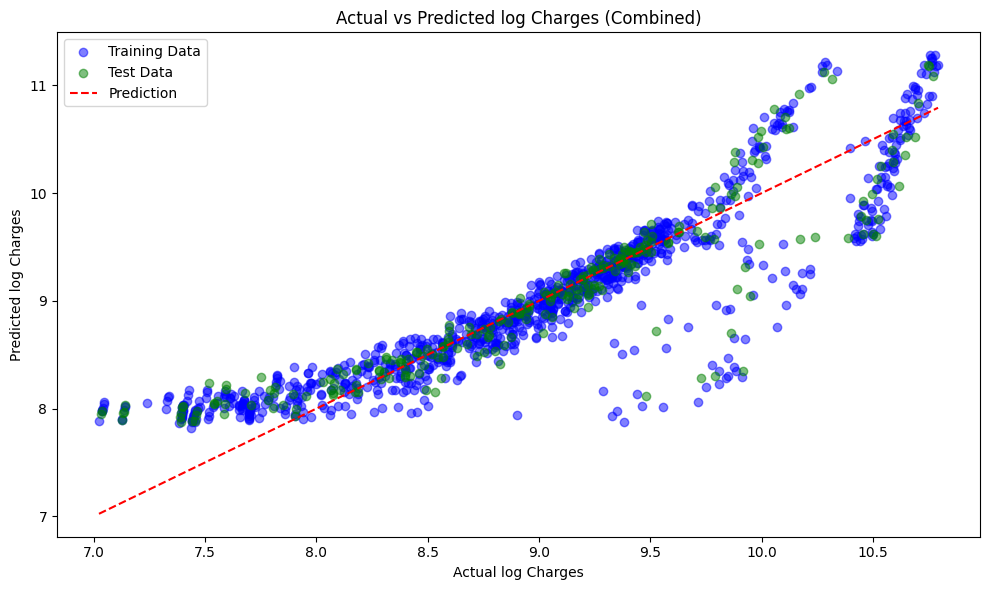

In [ ]:
# Create a single plot
plt.figure(figsize=(10, 6))

# Plot for the training set
plt.scatter(y_train_cleaned, y_pred_train_cleaned, color='blue', alpha=0.5, label='Training Data')

# Plot for the test set
plt.scatter(y_test_cleaned, y_pred_test_cleaned, color='green', alpha=0.5, label='Test Data')

# Plot the prediction line
plt.plot([min(y_train_cleaned.min(), y_test_cleaned.min()), max(y_train_cleaned.max(), y_test_cleaned.max())],
         [min(y_train_cleaned.min(), y_test_cleaned.min()), max(y_train_cleaned.max(), y_test_cleaned.max())],
         '--', color='red', label='Prediction')

# Set labels and title
plt.xlabel('Actual log Charges')
plt.ylabel('Predicted log Charges')
plt.title('Actual vs Predicted log Charges (Combined)')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


XGBoost

In [ ]:
target_column = 'log_charges'
X_cleaned = data_log_fs_cleaned.drop(columns=[target_column, 'charges'])
y_cleaned = data_log_fs_cleaned[target_column]
# Split the Original data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg.fit(X_train_cleaned, y_train_cleaned)

# Predict
y_pred_train_cleaned = xgb_reg.predict(X_train_cleaned)
y_pred_test_cleaned = xgb_reg.predict(X_test_cleaned)


evaluate_model(y_train_cleaned, y_pred_train_cleaned, "XGBoost Regression (Train)")
evaluate_model(y_test_cleaned, y_pred_test_cleaned, "XGBoost Regression (Test)")


XGBoost Regression (Train) - Mean Squared Error: 0.0762, R2 Score: 0.9026
XGBoost Regression (Test) - Mean Squared Error: 0.0952, R2 Score: 0.8800


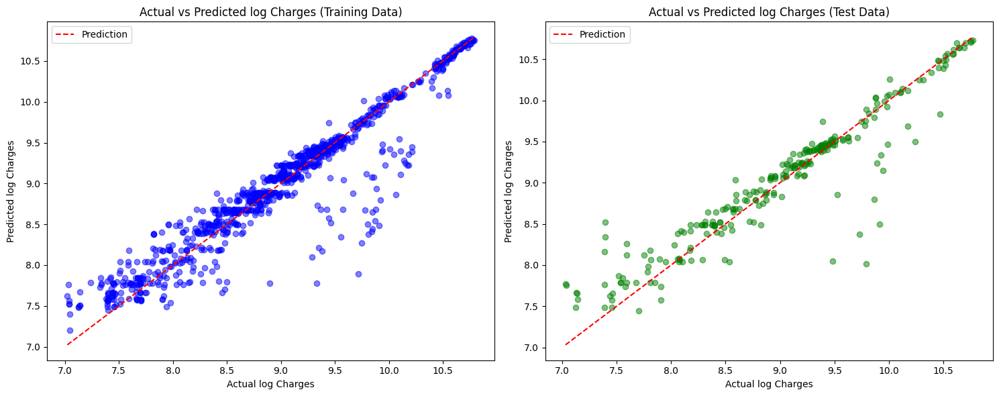

In [ ]:
# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot for the training set
axes[0].scatter(y_train_cleaned, y_pred_train_cleaned, color='blue', alpha=0.5)
axes[0].plot([y_train_cleaned.min(), y_train_cleaned.max()],
             [y_train_cleaned.min(), y_train_cleaned.max()],
             '--', color='red', label='Prediction')
axes[0].set_xlabel('Actual log Charges')
axes[0].set_ylabel('Predicted log Charges')
axes[0].set_title('Actual vs Predicted log Charges (Training Data)')
axes[0].legend()

# Plot for the test set
axes[1].scatter(y_test_cleaned, y_pred_test_cleaned, color='green', alpha=0.5)
axes[1].plot([y_test_cleaned.min(), y_test_cleaned.max()],
             [y_test_cleaned.min(), y_test_cleaned.max()],
             '--', color='red', label='Prediction')
axes[1].set_xlabel('Actual log Charges')
axes[1].set_ylabel('Predicted log Charges')
axes[1].set_title('Actual vs Predicted log Charges (Test Data)')
axes[1].legend()

# Adjust layout
plt.tight_layout()
plt.show()


Quantile Regression

Quantile 0.25 - Train MSE: 0.2124, R2: 0.7285
Quantile 0.25 - Test MSE: 0.2057, R2: 0.7408
Quantile 0.5 - Train MSE: 0.1529, R2: 0.8045
Quantile 0.5 - Test MSE: 0.1535, R2: 0.8066
Quantile 0.75 - Train MSE: 0.1874, R2: 0.7604
Quantile 0.75 - Test MSE: 0.1971, R2: 0.7517


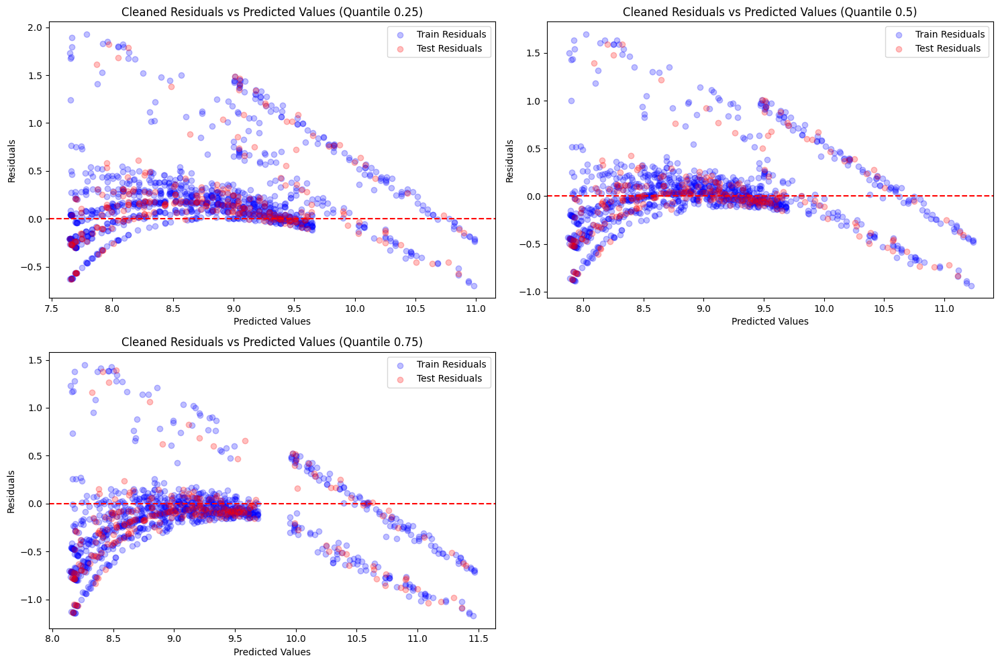

In [ ]:
X_cleaned = data_log_fs_cleaned.drop(columns=[target_column, 'charges'])
y_cleaned = data_log_fs_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_cq, y_pred_test_cq = quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_cq, y_pred_test_cq)

plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq = y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_cq, residuals_train_cq, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_cq, residuals_test_cq, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Cleaned Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


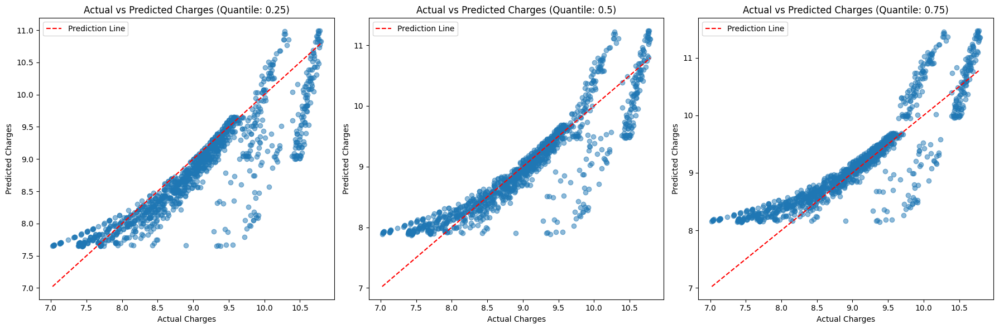

In [ ]:
# Create subplots for each quantile
fig, axes = plt.subplots(1, len(quantiles), figsize=(18, 6))

for i, q in enumerate(quantiles):
    # Unpack the results
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Create a combined DataFrame for easier plotting
    combined_df = pd.DataFrame({
        'Actual': pd.concat([y_train_cleaned.reset_index(drop=True), y_test_cleaned.reset_index(drop=True)]),
        'Predicted': pd.concat([pd.Series(y_pred_train_cq).reset_index(drop=True),
                                pd.Series(y_pred_test_cq).reset_index(drop=True)]),
        'Dataset': ['Train'] * len(y_train_cleaned) + ['Test'] * len(y_test_cleaned)
    })

    # Plot for the current quantile
    axes[i].scatter(combined_df['Actual'], combined_df['Predicted'], alpha=0.5)

    # Add a line for perfect prediction
    axes[i].plot([combined_df['Actual'].min(), combined_df['Actual'].max()],
                 [combined_df['Actual'].min(), combined_df['Actual'].max()],
                 '--', color='red', label='Prediction Line')

    # Customize the plot
    axes[i].set_title(f'Actual vs Predicted Charges (Quantile: {q})')
    axes[i].set_xlabel('Actual Charges')
    axes[i].set_ylabel('Predicted Charges')
    axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()


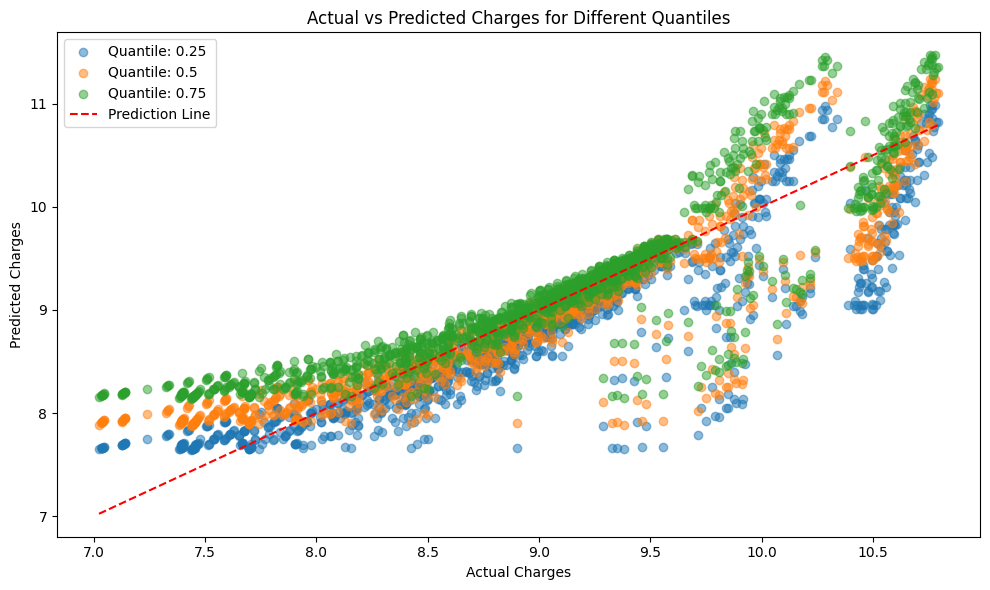

In [ ]:
# Create a single plot for all quantiles
plt.figure(figsize=(10, 6))

for q in quantiles:
    # Unpack the results
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Create a combined DataFrame for easier plotting
    combined_df = pd.DataFrame({
        'Actual': pd.concat([y_train_cleaned.reset_index(drop=True), y_test_cleaned.reset_index(drop=True)]),
        'Predicted': pd.concat([pd.Series(y_pred_train_cq).reset_index(drop=True),
                                pd.Series(y_pred_test_cq).reset_index(drop=True)]),
        'Dataset': ['Train'] * len(y_train_cleaned) + ['Test'] * len(y_test_cleaned)
    })

    # Plot the actual vs predicted values
    plt.scatter(combined_df['Actual'], combined_df['Predicted'], alpha=0.5, label=f'Quantile: {q}')

# Add a line for perfect prediction
plt.plot([combined_df['Actual'].min(), combined_df['Actual'].max()],
         [combined_df['Actual'].min(), combined_df['Actual'].max()],
         '--', color='red', label='Prediction Line')

# Set labels and title
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Predicted Charges for Different Quantiles')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


XG Boost

Quantile 0.25 - Train MSE: 0.0969, R2: 0.8761
Quantile 0.25 - Test MSE: 0.0832, R2: 0.8952
Quantile 0.5 - Train MSE: 0.0961, R2: 0.8772
Quantile 0.5 - Test MSE: 0.0844, R2: 0.8937
Quantile 0.75 - Train MSE: 0.0974, R2: 0.8754
Quantile 0.75 - Test MSE: 0.0844, R2: 0.8937


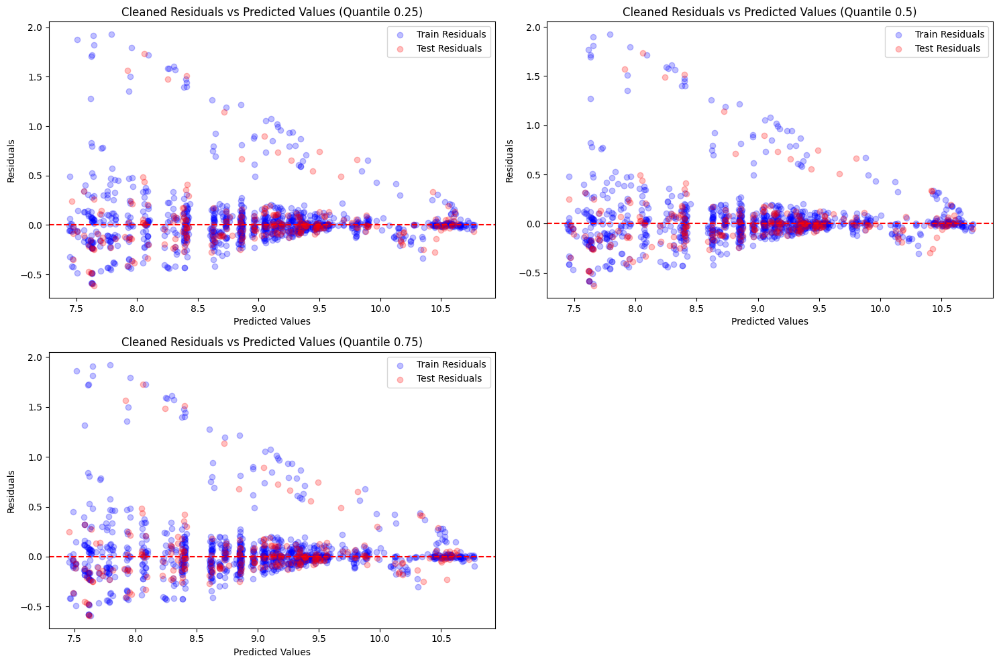

In [ ]:
X_cleaned = data_log_fs_cleaned.drop(columns=[target_column, 'charges'])
y_cleaned = data_log_fs_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_cq, y_pred_test_cq = xgboost_quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_cq, y_pred_test_cq)

plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq = y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_cq, residuals_train_cq, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_cq, residuals_test_cq, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Cleaned Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


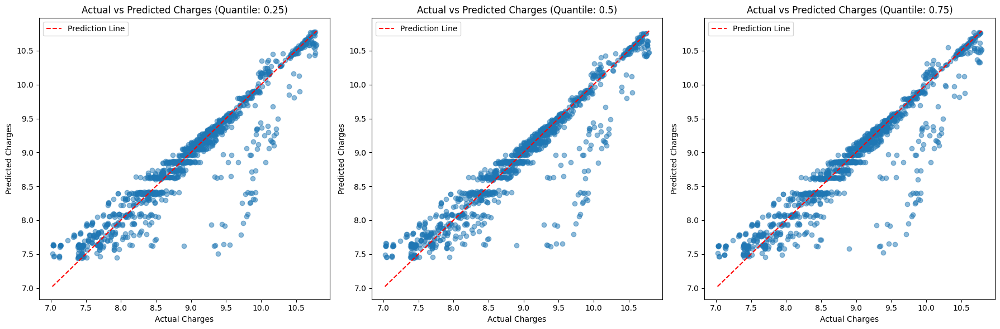

In [ ]:
# Create subplots for each quantile
fig, axes = plt.subplots(1, len(quantiles), figsize=(18, 6))

for i, q in enumerate(quantiles):
    # Unpack the results
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Create a combined DataFrame for easier plotting
    combined_df = pd.DataFrame({
        'Actual': pd.concat([y_train_cleaned.reset_index(drop=True), y_test_cleaned.reset_index(drop=True)]),
        'Predicted': pd.concat([pd.Series(y_pred_train_cq).reset_index(drop=True),
                                pd.Series(y_pred_test_cq).reset_index(drop=True)]),
        'Dataset': ['Train'] * len(y_train_cleaned) + ['Test'] * len(y_test_cleaned)
    })

    # Plot for the current quantile
    axes[i].scatter(combined_df['Actual'], combined_df['Predicted'], alpha=0.5)

    # Add a line for perfect prediction
    axes[i].plot([combined_df['Actual'].min(), combined_df['Actual'].max()],
                 [combined_df['Actual'].min(), combined_df['Actual'].max()],
                 '--', color='red', label='Prediction Line')

    # Customize the plot
    axes[i].set_title(f'Actual vs Predicted Charges (Quantile: {q})')
    axes[i].set_xlabel('Actual Charges')
    axes[i].set_ylabel('Predicted Charges')
    axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()


Linear Regression and Quantile Regression on 0.5 comparison

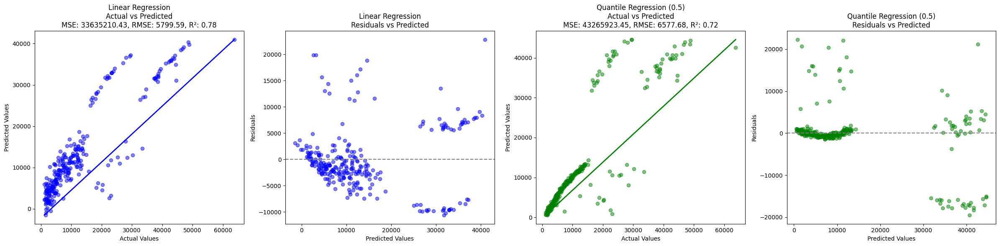

In [ ]:
# Split the data
X = data_numeric[['age', 'bmi', 'sex', 'smoker', 'region', 'children']]
y = data_numeric['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression Model
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)

# Predictions and metrics for Linear Regression
y_pred_test_lr = linear_reg.predict(X_test)
mse_lr = mean_squared_error(y_test, y_pred_test_lr)
rmse_lr = np.sqrt(mse_lr)
r2_lr = r2_score(y_test, y_pred_test_lr)
residuals_lr = y_test - y_pred_test_lr

# Add constant to X for the intercept term in Quantile Regression
X_train_sm = sm.add_constant(X_train)
X_test_sm = sm.add_constant(X_test)

# Quantile Regression Model at the 0.5 quantile
quantile = 0.50
quant_reg_model = sm.QuantReg(y_train, X_train_sm).fit(q=quantile, max_iter=10000)

# Predictions and metrics for Quantile Regression
y_pred_test_qr = quant_reg_model.predict(X_test_sm)
mse_qr = mean_squared_error(y_test, y_pred_test_qr)
rmse_qr = np.sqrt(mse_qr)
r2_qr = r2_score(y_test, y_pred_test_qr)
residuals_qr = y_test - y_pred_test_qr

# Create a 4-column, 1-row subplot
fig, axs = plt.subplots(1, 4, figsize=(24, 6))

# Plot 1: Linear Regression - Actual vs Predicted values
axs[0].scatter(y_test, y_pred_test_lr, color='blue', alpha=0.5)
# Linear regression line
axs[0].plot([y_test.min(), y_test.max()],
            [y_pred_test_lr.min(), y_pred_test_lr.max()],
            color='blue', linewidth=2)
axs[0].set_title(f'Linear Regression\nActual vs Predicted\nMSE: {mse_lr:.2f}, RMSE: {rmse_lr:.2f}, R²: {r2_lr:.2f}')
axs[0].set_xlabel('Actual Values')
axs[0].set_ylabel('Predicted Values')

# Plot 2: Linear Regression - Residuals vs Predicted Residuals
axs[1].scatter(y_pred_test_lr, residuals_lr, color='blue', alpha=0.5)
axs[1].axhline(y=0, color='gray', linestyle='--')
axs[1].set_title('Linear Regression\nResiduals vs Predicted')
axs[1].set_xlabel('Predicted Values')
axs[1].set_ylabel('Residuals')

# Plot 3: Quantile Regression (0.5) - Actual vs Predicted values
axs[2].scatter(y_test, y_pred_test_qr, color='green', alpha=0.5)
# Quantile regression line
axs[2].plot([y_test.min(), y_test.max()],
            [y_pred_test_qr.min(), y_pred_test_qr.max()],
            color='green', linewidth=2)
axs[2].set_title(f'Quantile Regression (0.5)\nActual vs Predicted\nMSE: {mse_qr:.2f}, RMSE: {rmse_qr:.2f}, R²: {r2_qr:.2f}')
axs[2].set_xlabel('Actual Values')
axs[2].set_ylabel('Predicted Values')

# Plot 4: Quantile Regression (0.5) - Residuals vs Predicted Residuals
axs[3].scatter(y_pred_test_qr, residuals_qr, color='green', alpha=0.5)
axs[3].axhline(y=0, color='gray', linestyle='--')
axs[3].set_title('Quantile Regression (0.5)\nResiduals vs Predicted')
axs[3].set_xlabel('Predicted Values')
axs[3].set_ylabel('Residuals')

plt.tight_layout()
plt.show()

In [ ]:
# Split the data
X = data_numeric[['age', 'bmi', 'sex', 'smoker', 'region', 'children']]
y = data_numeric['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit the model
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = linear_reg.predict(X_train)
y_pred_test = linear_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Linear Regression (Train)")
evaluate_model(y_test, y_pred_test, "Linear Regression (Test)")


quantiles = [ 0.5]
results = {}

for q in quantiles:
    res, y_pred_train_quant, y_pred_test_quant = quantile_regression(q, X_train, y_train, X_test, y_test)
    results[q] = (res, y_pred_train_quant, y_pred_test_quant)

Linear Regression (Train) - Mean Squared Error: 37280663.2226, R2 Score: 0.7417
Linear Regression (Test) - Mean Squared Error: 33635210.4312, R2 Score: 0.7833
Quantile 0.5 - Train MSE: 49599389.6664, R2: 0.6564
Quantile 0.5 - Test MSE: 43265923.4484, R2: 0.7213


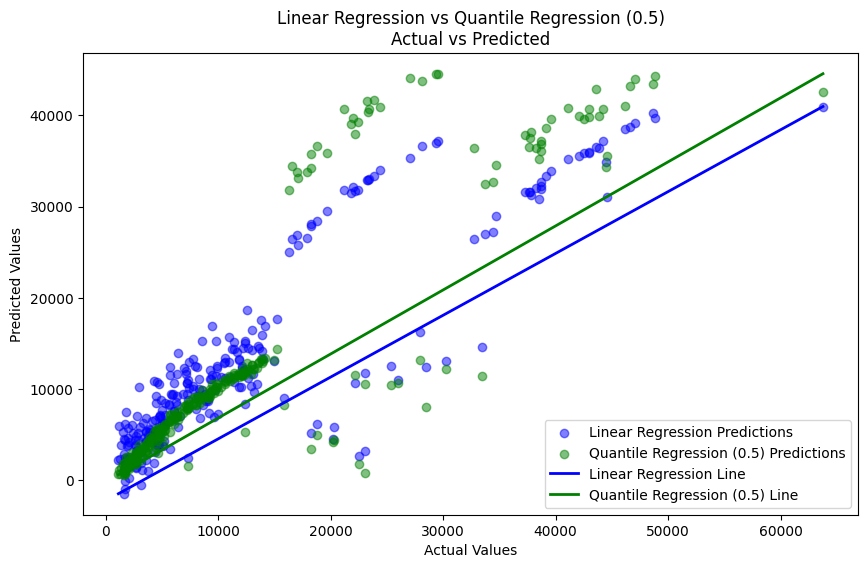

In [ ]:
#Plotting the Linear Regression and Quantile Regression (0.5) lines
plt.figure(figsize=(10, 6))

# Scatter plot of actual vs predicted values (Test set)
plt.scatter(y_test, y_pred_test_lr, color='blue', alpha=0.5, label='Linear Regression Predictions')
plt.scatter(y_test, y_pred_test_qr, color='green', alpha=0.5, label='Quantile Regression (0.5) Predictions')

# Linear Regression line
plt.plot([y_test.min(), y_test.max()],
         [y_pred_test_lr.min(), y_pred_test_lr.max()],
         color='blue', linewidth=2, label='Linear Regression Line')

# Quantile Regression line at 0.5
plt.plot([y_test.min(), y_test.max()],
         [y_pred_test_qr.min(), y_pred_test_qr.max()],
         color='green', linewidth=2, label='Quantile Regression (0.5) Line')

plt.title('Linear Regression vs Quantile Regression (0.5)\nActual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

After Feature selection

In [ ]:
# Split the data
X = data_numeric[['age', 'bmi', 'smoker']]
y = data_numeric['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit the model
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = linear_reg.predict(X_train)
y_pred_test = linear_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Linear Regression (Train)")
evaluate_model(y_test, y_pred_test, "Linear Regression (Test)")


quantiles = [ 0.5]
results = {}

for q in quantiles:
    res, y_pred_train_quant, y_pred_test_quant = quantile_regression(q, X_train, y_train, X_test, y_test)
    results[q] = (res, y_pred_train_quant, y_pred_test_quant)

Linear Regression (Train) - Mean Squared Error: 37638069.1703, R2 Score: 0.7392
Linear Regression (Test) - Mean Squared Error: 34512843.8802, R2 Score: 0.7777
Quantile 0.5 - Train MSE: 49302067.5833, R2: 0.6584
Quantile 0.5 - Test MSE: 43914834.1771, R2: 0.7171


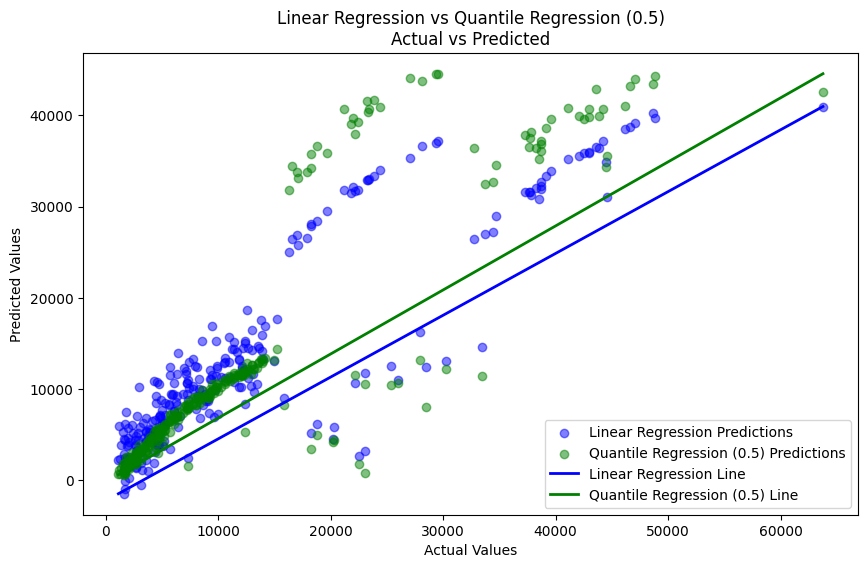

In [ ]:
# Plotting the Linear Regression and Quantile Regression (0.5) lines
plt.figure(figsize=(10, 6))

# Scatter plot of actual vs predicted values (Test set) for Linear Regression
plt.scatter(y_test, y_pred_test_lr, color='blue', alpha=0.5, label='Linear Regression Predictions')

# Scatter plot of actual vs predicted values (Test set) for Quantile Regression
plt.scatter(y_test, y_pred_test_qr, color='green', alpha=0.5, label='Quantile Regression (0.5) Predictions')

# Plot the Linear Regression line
plt.plot([y_test.min(), y_test.max()],
         [y_pred_test_lr.min(), y_pred_test_lr.max()],
         color='blue', linewidth=2, label='Linear Regression Line')

# Plot the Quantile Regression line at 0.5
plt.plot([y_test.min(), y_test.max()],
         [y_pred_test_qr.min(), y_pred_test_qr.max()],
         color='green', linewidth=2, label='Quantile Regression (0.5) Line')

plt.title('Linear Regression vs Quantile Regression (0.5)\nActual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

For cleaned data

In [ ]:
# Remove high leverage points and outliers from the dataset
data_cleaned = data_numeric.drop(index=combined_indices)

selected_features = ['age', 'bmi', 'sex', 'smoker', 'region', 'children']
target_column = 'charges'

# Split the cleaned data into features and target
X_cleaned = data_cleaned[selected_features]
y_cleaned = data_cleaned[target_column]

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Create and fit the model
linear_reg = LinearRegression()
linear_reg.fit(X_train_cleaned, y_train_cleaned)

# Predict and evaluate
y_pred_train_cleaned = linear_reg.predict(X_train_cleaned)
y_pred_test_cleaned = linear_reg.predict(X_test_cleaned)

evaluate_model(y_train_cleaned, y_pred_train_cleaned, "Linear Regression (Train)")
evaluate_model(y_test_cleaned, y_pred_test_cleaned, "Linear Regression (Test)")


quantiles = [ 0.5]
results = {}

for q in quantiles:
    res, y_pred_train_quant_cl, y_pred_test_quant_cl = quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_quant_cl, y_pred_test_quant_cl)

Linear Regression (Train) - Mean Squared Error: 21333356.8703, R2 Score: 0.8243
Linear Regression (Test) - Mean Squared Error: 20565751.4899, R2 Score: 0.8164
Quantile 0.5 - Train MSE: 30360203.8966, R2: 0.7500
Quantile 0.5 - Test MSE: 32390481.2419, R2: 0.7109


After Feature selection

In [ ]:
# Remove high leverage points and outliers from the dataset
data_cleaned = data_numeric.drop(index=combined_indices)

selected_features = ['age', 'bmi', 'smoker']
target_column = 'charges'

# Split the cleaned data into features and target
X_cleaned = data_cleaned[selected_features]
y_cleaned = data_cleaned[target_column]

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Create and fit the model
linear_reg = LinearRegression()
linear_reg.fit(X_train_cleaned, y_train_cleaned)

# Predict and evaluate
y_pred_train_cleaned = linear_reg.predict(X_train_cleaned)
y_pred_test_cleaned = linear_reg.predict(X_test_cleaned)

evaluate_model(y_train_cleaned, y_pred_train_cleaned, "Linear Regression (Train)")
evaluate_model(y_test_cleaned, y_pred_test_cleaned, "Linear Regression (Test)")


quantiles = [ 0.5]
results = {}

for q in quantiles:
    res, y_pred_train_quant_cl, y_pred_test_quant_cl = quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_quant_cl, y_pred_test_quant_cl)

Linear Regression (Train) - Mean Squared Error: 21618574.0548, R2 Score: 0.8220
Linear Regression (Test) - Mean Squared Error: 20653054.6292, R2 Score: 0.8156
Quantile 0.5 - Train MSE: 30195156.3301, R2: 0.7513
Quantile 0.5 - Test MSE: 32280151.7667, R2: 0.7119


XGBoost Comparison on Linear Regression and Quantile Regression at 0.5 after feature selection and removing the high leverage points and outliers

In [ ]:
# Remove high leverage points and outliers from the dataset
data_cleaned = data_numeric.drop(index=combined_indices)

selected_features = ['age', 'bmi', 'smoker']
target_column = 'charges'

# Split the cleaned data into features and target
X_cleaned = data_cleaned[selected_features]
y_cleaned = data_cleaned[target_column]

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Initialize the XGBRegressor
xgb_reg2 = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg2.fit(X_train_cleaned, y_train_cleaned)

# Predict
y_pred_train_cleaned_xg = xgb_reg2.predict(X_train_cleaned)
y_pred_test_cleaned_xg = xgb_reg2.predict(X_test_cleaned)

evaluate_model(y_train_cleaned, y_pred_train_cleaned_xg, "XGBoost Regression (Train)")
evaluate_model(y_test_cleaned, y_pred_test_cleaned_xg, "XGBoost Regression (Test)")

# Perform XGBoost quantile regression for 0.25, 0.5, and 0.75 quantiles
quantiles = [0.5]
results = {}

for q in quantiles:
    model, y_pred_train_qxgc, y_pred_test_qxgc = xgboost_quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (model, y_pred_train_qxgc, y_pred_test_qxgc)


XGBoost Regression (Train) - Mean Squared Error: 7203176.5501, R2 Score: 0.9407
XGBoost Regression (Test) - Mean Squared Error: 8857817.5640, R2 Score: 0.9209
Quantile 0.5 - Train MSE: 10321394.2075, R2: 0.9150
Quantile 0.5 - Test MSE: 12232046.9468, R2: 0.8908


### Linear Regression performs better than Quantile Regression (0.5 quantile)

in both training and test datasets based on the provided metrics.


Lower MSE: Linear Regression's lower MSE on both train and test data suggests that it is better at predicting the actual values.

 R² Score: The higher R² Score for Linear Regression indicates a better fit and higher explanatory power.

In [ ]:
# Remove high leverage points and outliers from the dataset
data_cleaned = data_numeric.drop(index=combined_indices)

# Select features and target
selected_features = ['age', 'bmi', 'smoker']
target_column = 'charges'

# Split the cleaned data into features and target
X_cleaned = data_cleaned[selected_features]
y_cleaned = data_cleaned[target_column]

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Linear Regression Model
linear_reg_cleaned = LinearRegression()
linear_reg_cleaned.fit(X_train_cleaned, y_train_cleaned)

# Predictions from Linear Regression
y_pred_test_lr_cleaned = linear_reg_cleaned.predict(X_test_cleaned)

# Prepare for Quantile Regression
X_train_cleaned_sm = sm.add_constant(X_train_cleaned)
X_test_cleaned_sm = sm.add_constant(X_test_cleaned)

# Quantile levels to estimate
quantiles = [0.25, 0.5, 0.75]
quantile_predictions = {}

# Fit quantile regression models and predict
for quantile in quantiles:
    quant_reg_model_cleaned = sm.QuantReg(y_train_cleaned, X_train_cleaned_sm).fit(q=quantile, max_iter=10000)
    y_pred_test_qr_cleaned = quant_reg_model_cleaned.predict(X_test_cleaned_sm)
    quantile_predictions[quantile] = y_pred_test_qr_cleaned


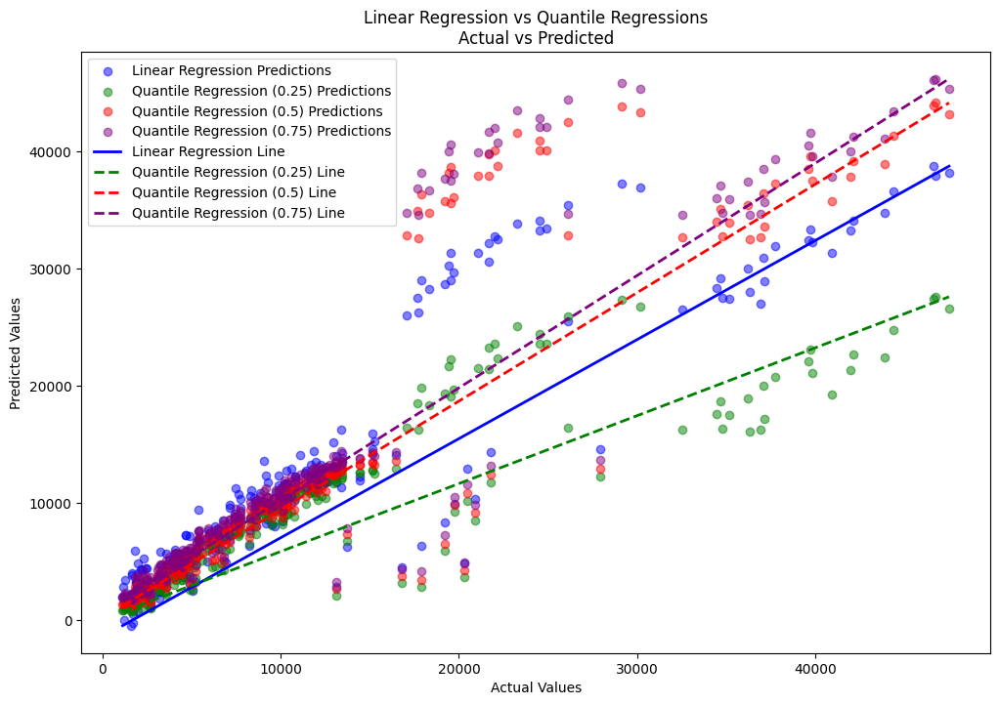

In [ ]:
# Plotting the Linear Regression and Quantile Regression lines
plt.figure(figsize=(12, 8))

# Scatter plot of actual vs predicted values (Test set) for Linear Regression
plt.scatter(y_test_cleaned, y_pred_test_lr_cleaned, color='blue', alpha=0.5, label='Linear Regression Predictions')

# Scatter plot of actual vs predicted values (Test set) for Quantile Regressions
for quantile, color in zip(quantiles, ['green', 'red', 'purple']):
    plt.scatter(y_test_cleaned, quantile_predictions[quantile], color=color, alpha=0.5, label=f'Quantile Regression ({quantile}) Predictions')

# Plot the Linear Regression line
plt.plot([y_test_cleaned.min(), y_test_cleaned.max()],
         [y_pred_test_lr_cleaned.min(), y_pred_test_lr_cleaned.max()],
         color='blue', linewidth=2, label='Linear Regression Line')

# Plot the Quantile Regression lines
for quantile, color in zip(quantiles, ['green', 'red', 'purple']):
    plt.plot([y_test_cleaned.min(), y_test_cleaned.max()],
             [quantile_predictions[quantile].min(), quantile_predictions[quantile].max()],
             color=color, linewidth=2, linestyle='--', label=f'Quantile Regression ({quantile}) Line')

plt.title('Linear Regression vs Quantile Regressions\nActual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

Linear Regression - MSE: 20653054.6292, R²: 0.8156
Quantile Regression (0.1) - MSE: 44222544.6387, R²: 0.6052
Quantile Regression (0.3) - MSE: 37225627.8965, R²: 0.6677
Quantile Regression (0.5) - MSE: 32280151.7667, R²: 0.7119
Quantile Regression (0.7) - MSE: 36849377.5603, R²: 0.6711
Quantile Regression (0.9) - MSE: 41255367.5995, R²: 0.6317


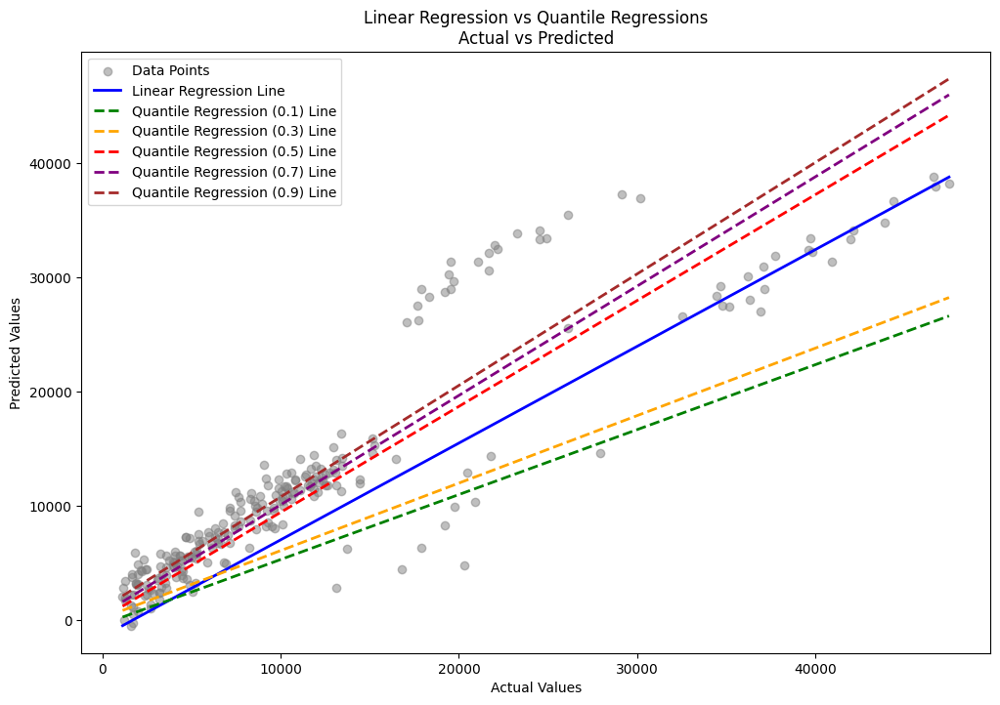

In [ ]:
# Select features and target
selected_features = ['age', 'bmi', 'smoker']
target_column = 'charges'

# Split the cleaned data into features and target
X_cleaned = data_cleaned[selected_features]
y_cleaned = data_cleaned[target_column]

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Linear Regression Model
linear_reg_cleaned = LinearRegression()
linear_reg_cleaned.fit(X_train_cleaned, y_train_cleaned)

# Predictions from Linear Regression
y_pred_test_lr_cleaned = linear_reg_cleaned.predict(X_test_cleaned)

# Calculate and print MSE and R² for Linear Regression
mse_lr = mean_squared_error(y_test_cleaned, y_pred_test_lr_cleaned)
r2_lr = r2_score(y_test_cleaned, y_pred_test_lr_cleaned)
print(f"Linear Regression - MSE: {mse_lr:.4f}, R²: {r2_lr:.4f}")

# Prepare for Quantile Regression
X_train_cleaned_sm = sm.add_constant(X_train_cleaned)
X_test_cleaned_sm = sm.add_constant(X_test_cleaned)

# Quantile levels to estimate
quantiles = [0.1, 0.3, 0.5, 0.7, 0.9]
quantile_predictions = {}

# Fit quantile regression models and predict
for quantile in quantiles:
    quant_reg_model_cleaned = sm.QuantReg(y_train_cleaned, X_train_cleaned_sm).fit(q=quantile, max_iter=10000)
    y_pred_test_qr_cleaned = quant_reg_model_cleaned.predict(X_test_cleaned_sm)
    quantile_predictions[quantile] = y_pred_test_qr_cleaned

    # Calculate and print MSE and R² for Quantile Regression
    mse_qr = mean_squared_error(y_test_cleaned, y_pred_test_qr_cleaned)
    r2_qr = r2_score(y_test_cleaned, y_pred_test_qr_cleaned)
    print(f"Quantile Regression ({quantile}) - MSE: {mse_qr:.4f}, R²: {r2_qr:.4f}")

# Plotting the Linear Regression and Quantile Regression lines
plt.figure(figsize=(12, 8))

# Scatter plot of all actual values (Test set) as grey dots against predicted values
plt.scatter(y_test_cleaned, y_pred_test_lr_cleaned, color='grey', alpha=0.5, label='Data Points')



# Plot the Linear Regression line
plt.plot([y_test_cleaned.min(), y_test_cleaned.max()],
         [y_pred_test_lr_cleaned.min(), y_pred_test_lr_cleaned.max()],
         color='blue', linewidth=2, label='Linear Regression Line')

# Plot the Quantile Regression lines
for quantile, color in zip(quantiles, ['green', 'orange', 'red', 'purple', 'brown']):
    plt.plot([y_test_cleaned.min(), y_test_cleaned.max()],
             [quantile_predictions[quantile].min(), quantile_predictions[quantile].max()],
             color=color, linewidth=2, linestyle='--', label=f'Quantile Regression ({quantile}) Line')

plt.title('Linear Regression vs Quantile Regressions\nActual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()